# 12 — PRE/POST TIME × ENCODING-SPACE interaction

This notebook tests whether **encoding-space effects** (early/middle/late route-position differences) depend on **temporal episode** (E1/E2/E3), while controlling for pre-existing image differences using the PRE viewing run.

Conceptual mapping:

```text
TIME  = episode / week of encoding: E1, E2, E3
SPACE = route-position / checkpoint third: early, middle, late
```

The key contrast is a PRE/POST triple interaction:

$$
\left[(\beta_{\mathrm{post,Ea,Sa}}-\beta_{\mathrm{post,Ea,Sb}})
-(\beta_{\mathrm{post,Eb,Sa}}-\beta_{\mathrm{post,Eb,Sb}})\right]
-
\left[(\beta_{\mathrm{pre,Ea,Sa}}-\beta_{\mathrm{pre,Ea,Sb}})
-(\beta_{\mathrm{pre,Eb,Sa}}-\beta_{\mathrm{pre,Eb,Sb}})\right].
$$

This asks whether a SPACE effect differs between TIME episodes after Island navigation, beyond any image-level difference already present at PRE.

The notebook includes all ordered TIME × SPACE interactions, including:

```text
large TIME × large SPACE: E1 vs E3 × early vs late
small TIME × small SPACE: E1 vs E2 or E2 vs E3 × early vs middle or middle vs late
```

Because we are specifically interested in hippocampal anterior/posterior patterns, this notebook also produces hippoAmyg ROI-masked HTML views, contour overlays, and ROI-overlap tables.


In [ ]:
# ============================================================
# 1. Setup
# ============================================================

from pathlib import Path
import sys
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display
from nilearn.image import load_img
from nilearn.plotting import plot_design_matrix

pd.set_option("display.max_columns", 220)
pd.set_option("display.max_colwidth", 220)

PROJECT_ROOT = Path("/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project")
SRC_DIR = PROJECT_ROOT / "src"

if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

from island_glm.paths import ProjectPaths, make_analysis_dirs
from island_glm.common import load_common_inputs, get_pre_post_subjects
from island_glm.events import (
    save_pre_post_time_space_subject_events,
    build_pre_post_time_space_event_qc,
    make_pre_post_time_space_events,
)
from island_glm.contrasts import (
    make_pre_post_time_space_interaction_contrasts,
    contrast_specs_to_table,
)
from island_glm.first_level import run_pre_post_time_space_first_level_subject
from island_glm.second_level import (
    first_level_map_path,
    verify_first_level_maps,
    run_second_level_all_contrasts,
    threshold_group_maps,
    make_cluster_tables,
)
from island_glm.reporting import label_cluster_table
from island_glm.plotting import plot_group_stat_map, make_interactive_view

ANALYSIS_NAME = "pre_post_time_x_encoding_space_interaction_glm"
SMOOTHING_FWHM = 5.0
SMOOTHING_LABEL = "smoothed5mm"
TEST_SUBJECT = "sub-P15"

# ------------------------------------------------------------
# Runtime flags
# ------------------------------------------------------------

RUN_FIRST_LEVEL = False
OVERWRITE_FIRST_LEVEL = False

RUN_SECOND_LEVEL = True
OVERWRITE_SECOND_LEVEL = True

USE_MEAN_T1W_BACKGROUND = True

paths = ProjectPaths.from_root(PROJECT_ROOT)
dirs = make_analysis_dirs(paths, ANALYSIS_NAME, smoothing_label=SMOOTHING_LABEL)

print("Project root:", paths.project_root)
print("Analysis output:", dirs["out"])
print("dirs keys:", sorted(dirs.keys()))


Project root: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project
Analysis output: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm
dirs keys: ['cluster_tables', 'events', 'figures', 'first_level', 'first_level_designs', 'first_level_figures', 'first_level_maps', 'interactive', 'out', 'restart', 'second_level', 'second_level_maps', 'tables', 'thresholded_maps']


## Load common inputs from Notebook 00

Notebook 00 defines the final PRE/POST subject list, viewing item labels, episode labels, checkpoint/space labels, and the common mean T1w anatomical background.


In [2]:
# ============================================================
# 2. Load common inputs and mean T1w background
# ============================================================

manifest, subject_table, viewing_item_labels = load_common_inputs(paths)
subjects = get_pre_post_subjects(manifest, no_high_motion=False)
sensitivity_subjects = get_pre_post_subjects(manifest, no_high_motion=True)

sessions = manifest["sessions"]

print("Main sample N:", len(subjects))
print("Sensitivity no-high-motion N:", len(sensitivity_subjects))
print("Sessions:", sessions)

assert "mean_anat" in manifest, (
    "Mean anatomical background missing from manifest. "
    "Rerun Notebook 00 after adding the mean T1w section."
)

mean_t1w_path = Path(manifest["mean_anat"]["mean_t1w_path"])
assert mean_t1w_path.exists(), f"Missing mean T1w file: {mean_t1w_path}"
mean_t1w_img = load_img(str(mean_t1w_path))

print("\nLoaded mean T1w anatomical background:")
print(mean_t1w_path)
print("Mean T1w shape:", mean_t1w_img.shape)

display(subject_table)
display(viewing_item_labels.head())

required_columns = {"subject", "phase", "onset", "duration", "old_new", "episode"}
missing_columns = required_columns.difference(viewing_item_labels.columns)
assert not missing_columns, f"Missing required columns: {missing_columns}"

has_space_column = any(
    col in viewing_item_labels.columns
    for col in [
        "checkpoint_third",
        "encoding_phase_third",
        "encoding_space",
        "encoding_time",
        "encoding_third",
        "checkpoint_index",
        "checkpoint",
        "checkpoint_number",
    ]
)
assert has_space_column, "No checkpoint / encoding-space column found. Rerun Notebook 00."


Main sample N: 27
Sensitivity no-high-motion N: 25
Sessions: {'pre': 'ses-01', 'post': 'ses-05', 'task': 'viewing', 'run': '01', 'bold_space': 'MNI152NLin2009cAsym'}

Loaded mean T1w anatomical background:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/common_inputs/mean_anat/mean_T1w_prepost_N27_subjects_MNI152NLin2009cAsym.nii.gz
Mean T1w shape: (193, 229, 193)


,subject,included_primary_post_only,included_pre_post_N27,included_pre_post_no_high_motion_N25,excluded_from_pre_post,high_motion_flag,exclusion_reason
0,sub-P10,True,True,True,False,False,NaN
1,sub-P12,True,True,True,False,False,NaN
2,sub-P13,True,True,True,False,False,NaN
3,sub-P14,True,True,True,False,False,NaN
4,sub-P15,True,True,True,False,False,NaN
5,sub-P16,True,True,True,False,False,NaN
6,sub-P17,True,True,True,False,False,NaN
7,sub-P18,True,True,True,False,False,NaN
8,sub-P19,True,True,False,False,True,High-motion sensitivity exclusion.
9,sub-P21,True,True,False,False,True,High-motion sensitivity exclusion.


,subject,session,run,onset,duration,image_file,source_image_column,phase,theme,item_id,episode,episode_number,checkpoint_index,checkpoint_index_out_of,checkpoint_third,relevance_from_filename,object_category_from_filename,old_new,stimulus_version,relevance_condition,spatial_accuracy_z,spatial_accuracy_condition_centered,relevance,encoding_phase_third
0,sub-P10,ses-01,1,4.634,3.017,maya_3_e3_6_r_h_v1_old,event,pre,maya,3.0,e3,3.0,6.0,16,middle,relevant,human,old,1.0,NaN,NaN,NaN,relevant,middle
1,sub-P10,ses-01,1,11.701,3.017,wealth_5_e3_7_nr_o_v1_old,event,pre,wealth,5.0,e3,3.0,7.0,16,middle,irrelevant,object,old,1.0,NaN,NaN,NaN,irrelevant,middle
2,sub-P10,ses-01,1,17.934,3.017,pirate_6_e2_13_r_h_v1_old,event,pre,pirate,6.0,e2,2.0,13.0,16,late,relevant,human,old,1.0,NaN,NaN,NaN,relevant,late
3,sub-P10,ses-01,1,24.534,3.017,viking_11_new,event,pre,NaN,NaN,NaN,NaN,NaN,16,NaN,NaN,NaN,new,NaN,NaN,NaN,NaN,NaN,NaN
4,sub-P10,ses-01,1,30.451,3.016,pirate_7_e3_1_nr_h_v1_old,event,pre,pirate,7.0,e3,3.0,1.0,16,early,irrelevant,human,old,1.0,NaN,NaN,NaN,irrelevant,early


## Design

This is a two-run PRE/POST viewing GLM.

Regressors:

```text
pre_oldE1Early   pre_oldE1Middle   pre_oldE1Late
pre_oldE2Early   pre_oldE2Middle   pre_oldE2Late
pre_oldE3Early   pre_oldE3Middle   pre_oldE3Late
pre_new

post_oldE1Early  post_oldE1Middle  post_oldE1Late
post_oldE2Early  post_oldE2Middle  post_oldE2Late
post_oldE3Early  post_oldE3Middle  post_oldE3Late
post_new
```

At PRE, the E1/E2/E3 and early/middle/late labels refer to the **future** Island encoding assignment. Therefore PRE acts as an image-level baseline. At POST, the same labels reflect the learned temporal and spatial structure from Island navigation.


## Contrast families

The main family contains all ordered TIME × SPACE interactions:

```text
(time Ea > Eb) × (space Sa > Sb), POST > PRE
```

where `Ea/Eb ∈ {E1,E2,E3}` and `Sa/Sb ∈ {early,middle,late}`.

This includes:

```text
large time × large space: E1 vs E3 × early vs late
large time × small space: E1 vs E3 × early vs middle or middle vs late
small time × large space: E1 vs E2 or E2 vs E3 × early vs late
small time × small space: E1 vs E2 or E2 vs E3 × early vs middle or middle vs late
```

Supporting contrasts are also included:

```text
within-episode SPACE effects, POST > PRE
within-space TIME effects, POST > PRE
cell-specific old > new, POST > PRE
average old > new, POST > PRE
```


In [3]:
# ============================================================
# 3. Define contrasts and save contrast table
# ============================================================

contrast_specs = make_pre_post_time_space_interaction_contrasts()
contrast_table = contrast_specs_to_table(contrast_specs)

contrast_table_path = dirs["tables"] / f"{ANALYSIS_NAME}_contrast_definitions.csv"
contrast_table.to_csv(contrast_table_path, index=False)

display(contrast_table)
print("Saved:", contrast_table_path)
print("Number of contrasts:", len(contrast_specs))
print("Priority counts:")
display(contrast_table["priority"].value_counts().reset_index())


,contrast,priority,formula,interpretation,post_oldE1Early,post_new,pre_oldE1Early,pre_new,post_oldE1Middle,pre_oldE1Middle,post_oldE1Late,pre_oldE1Late,post_oldE2Early,pre_oldE2Early,post_oldE2Middle,pre_oldE2Middle,post_oldE2Late,pre_oldE2Late,post_oldE3Early,pre_oldE3Early,post_oldE3Middle,pre_oldE3Middle,post_oldE3Late,pre_oldE3Late
0,e1_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Early}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Early}}-\beta_{\mathrm{pre,new}}) $$",Old-new effect for E1 early images is stronger at POST than PRE.,1.0,-1.0,-1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,e1_middle_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Middle}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Middle}}-\beta_{\mathrm{pre,new}}) $$",Old-new effect for E1 middle images is stronger at POST than PRE.,0.0,-1.0,0.0,1.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,e1_late_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Late}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Late}}-\beta_{\mathrm{pre,new}}) $$",Old-new effect for E1 late images is stronger at POST than PRE.,0.0,-1.0,0.0,1.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,e2_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E2,Early}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E2,Early}}-\beta_{\mathrm{pre,new}}) $$",Old-new effect for E2 early images is stronger at POST than PRE.,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,e2_middle_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E2,Middle}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E2,Middle}}-\beta_{\mathrm{pre,new}}) $$",Old-new effect for E2 middle images is stronger at POST than PRE.,0.0,-1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77,time_e3_gt_e2_x_space_middle_gt_early_post_gt_pre,12_time_space_interaction_small_time_small_space,"$$ [(\beta_{\mathrm{post,E3,middle}}-\beta_{\mathrm{post,E3,early}}) - (\beta_{\mathrm{post,E2,middle}}-\beta_{\mathrm{post,E2,early}})] - [(\beta_{\mathrm{pre,E3,middle}}-\beta_{\mathrm{pre,E3,early}}) - (\beta_{\ma...","TIME × SPACE interaction: the middle > early space effect differs for E3 > E2 after Island navigation, controlling for PRE image baseline. This is a small time × small space contrast.",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,-1.0,1.0,0.0,0.0,-1.0,1.0,1.0,-1.0,0.0,0.0
78,time_e3_gt_e2_x_space_early_gt_late_post_gt_pre,12_time_space_interaction_small_time_large_space,"$$ [(\beta_{\mathrm{post,E3,early}}-\beta_{\mathrm{post,E3,late}}) - (\beta_{\mathrm{post,E2,early}}-\beta_{\mathrm{post,E2,late}})] - [(\beta_{\mathrm{pre,E3,early}}-\beta_{\mathrm{pre,E3,late}}) - (\beta_{\mathrm{p...","TIME × SPACE interaction: the early > late space effect differs for E3 > E2 after Island navigation, controlling for PRE image baseline. This is a small time × large space contrast.",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,1.0,0.0,0.0,1.0,-1.0,1.0,-1.0,0.0,0.0,-1.0,1.0
79,time_e3_gt_e2_x_space_late_gt_early_post_gt_pre,12_time_space_interaction_small_time_large_space,"$$ [(\beta_{\mathrm{post,E3,late}}-\beta_{\mathrm{post,E3,early}}) - (\beta_{\mathrm{post,E2,late}}-\beta_{\mathrm{post,E2,early}})] - [(\beta_{\mathrm{pre,E3,late}}-\beta_{\mathrm{pre,E3,early}}) - (\beta_{\mathrm{p...","TIME × SPACE interaction: the late > early space effect differs for E3 > E2 after Island navigation, controlling for PRE image baseline. This is a small time × large space contrast.",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0,0.0,0.0,-1.0,1.0,-1.0,1.0,0.0,0.0,1.0,-1.0
80,time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre,12_time_space_interaction_small_time_small_space,"$$

Saved: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/pre_post_time_x_encoding_space_interaction_glm_contrast_definitions.csv
Number of contrasts: 82
Priority counts:


,priority,count
0,12_within_space_time_post_pre,18
1,12_within_episode_space_post_pre,18
2,12_time_space_interaction_small_time_small_space,16
3,12_cell_old_new_post_pre_control,9
4,12_time_space_interaction_large_time_small_space,8
5,12_time_space_interaction_small_time_large_space,8
6,12_time_space_interaction_large_time_large_space,4
7,12_average_old_new_post_pre_control,1


## Event relabelling

We create clean PRE and POST event tables per subject with BIDS-compatible columns:

```text
onset, duration, trial_type, modulation
```

Trial types encode both TIME and SPACE, e.g. `pre_oldE1Early`, `post_oldE3Late`, plus `pre_new` and `post_new`.


In [4]:
# ============================================================
# 4. Create PRE/POST TIME × SPACE event files and event-count QC
# ============================================================

for subject in subjects:
    save_pre_post_time_space_subject_events(
        viewing_item_labels=viewing_item_labels,
        subject=subject,
        events_dir=dirs["events"],
        phases=("pre", "post"),
    )

event_qc, all_events_long = build_pre_post_time_space_event_qc(
    viewing_item_labels=viewing_item_labels,
    subjects=subjects,
    events_dir=dirs["events"],
    phases=("pre", "post"),
)

event_qc_path = dirs["tables"] / f"{ANALYSIS_NAME}_event_count_qc.csv"
all_events_path = dirs["events"] / f"all_subjects_{ANALYSIS_NAME}_events_long.tsv"

event_qc.to_csv(event_qc_path, index=False)
all_events_long.to_csv(all_events_path, sep="\t", index=False)

print("Saved event QC:", event_qc_path)
print("Saved all events:", all_events_path)

print("\nEvent counts by phase and trial type:")
display(event_qc.head(20))

summary_cols = [col for col in event_qc.columns if col.startswith("n_pre_") or col.startswith("n_post_")]
display(event_qc[summary_cols].describe())


Saved event QC: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/pre_post_time_x_encoding_space_interaction_glm_event_count_qc.csv
Saved all events: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/all_subjects_pre_post_time_x_encoding_space_interaction_glm_events_long.tsv

Event counts by phase and trial type:


,subject,phase,n_events,events_path,n_pre_oldE1Early,n_pre_oldE1Middle,n_pre_oldE1Late,n_pre_oldE2Early,n_pre_oldE2Middle,n_pre_oldE2Late,n_pre_oldE3Early,n_pre_oldE3Middle,n_pre_oldE3Late,n_pre_new,n_pre_other,n_post_oldE1Early,n_post_oldE1Middle,n_post_oldE1Late,n_post_oldE2Early,n_post_oldE2Middle,n_post_oldE2Late,n_post_oldE3Early,n_post_oldE3Middle,n_post_oldE3Late,n_post_new,n_post_other
0,sub-P10,pre,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/sub-P10_pre_task-viewing_pre_post_time_space_events.tsv,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,sub-P10,post,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/sub-P10_post_task-viewing_pre_post_time_space_events.tsv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
2,sub-P12,pre,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/sub-P12_pre_task-viewing_pre_post_time_space_events.tsv,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,sub-P12,post,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/sub-P12_post_task-viewing_pre_post_time_space_events.tsv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
4,sub-P13,pre,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/sub-P13_pre_task-viewing_pre_post_time_space_events.tsv,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,sub-P13,post,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/sub-P13_post_task-viewing_pre_post_time_space_events.tsv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
6,sub-P14,pre,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/sub-P14_pre_task-viewing_pre_post_time_space_events.tsv,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,sub-P14,post,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/sub-P14_post_task-viewing_pre_post_time_space_events.tsv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
8,sub-P15,pre,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/sub-P15_pre_task-viewing_pre_post_time_space_events.tsv,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,sub-P15,post,384,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/preprocessed/relabeled_events_pre_post_time_x_encoding_space_interaction_glm/sub-P15_post_task-viewing_pre_post_time_space_events.tsv,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0


,n_pre_oldE1Early,n_pre_oldE1Middle,n_pre_oldE1Late,n_pre_oldE2Early,n_pre_oldE2Middle,n_pre_oldE2Late,n_pre_oldE3Early,n_pre_oldE3Middle,n_pre_oldE3Late,n_pre_new,n_pre_other,n_post_oldE1Early,n_post_oldE1Middle,n_post_oldE1Late,n_post_oldE2Early,n_post_oldE2Middle,n_post_oldE2Late,n_post_oldE3Early,n_post_oldE3Middle,n_post_oldE3Late,n_post_new,n_post_other
count,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0,27.0
mean,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
25%,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
50%,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
75%,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0
max,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0,30.0,30.0,36.0,30.0,30.0,36.0,30.0,30.0,36.0,96.0,0.0


## Single-subject design preview

Before running all subjects, we fit one example subject and inspect the design matrix and contrast vectors. This cell does **not** save first-level contrast maps.


In [5]:
# ============================================================
# 5. Single-subject design and contrast preview
# ============================================================

subject_qc_preview, contrast_qc_preview = run_pre_post_time_space_first_level_subject(
    subject=TEST_SUBJECT,
    paths=paths,
    viewing_item_labels=viewing_item_labels,
    contrast_specs=contrast_specs,
    output_dirs=dirs,
    sessions=sessions,
    smoothing_fwhm=SMOOTHING_FWHM,
    smoothing_label=SMOOTHING_LABEL,
    hrf_model="spm",
    save_outputs=False,
    make_design_plot=True,
)

preview_subject_qc_path = (
    dirs["tables"]
    / f"{ANALYSIS_NAME}_{TEST_SUBJECT}_design_preview_subject_qc.csv"
)
preview_contrast_qc_path = (
    dirs["tables"]
    / f"{ANALYSIS_NAME}_{TEST_SUBJECT}_contrast_vector_preview_qc.csv"
)

subject_qc_preview.to_csv(preview_subject_qc_path, index=False)
contrast_qc_preview.to_csv(preview_contrast_qc_path, index=False)

print("Subject QC preview:")
display(subject_qc_preview)

print("Contrast-vector preview:")
display(contrast_qc_preview)

assert not contrast_qc_preview.groupby("contrast")["is_null_vector"].all().any()

print("Saved preview QC:")
print(preview_subject_qc_path)
print(preview_contrast_qc_path)


KeyboardInterrupt: 

## Restart-safe first-level GLM

The first-level GLM is the slow part. After a successful first run, keep `RUN_FIRST_LEVEL=False`.


In [6]:
# ============================================================
# 6. Run, recover, or load first-level GLM results
# ============================================================

first_level_qc_path = dirs["tables"] / f"{ANALYSIS_NAME}_first_level_qc_{SMOOTHING_LABEL}.csv"
first_level_contrast_qc_path = dirs["tables"] / f"{ANALYSIS_NAME}_first_level_contrast_qc_{SMOOTHING_LABEL}.csv"
failed_subjects_path = dirs["tables"] / f"{ANALYSIS_NAME}_failed_subjects_{SMOOTHING_LABEL}.csv"
map_qc_path = dirs["tables"] / f"{ANALYSIS_NAME}_first_level_map_qc_{SMOOTHING_LABEL}.csv"


def safe_read_csv(path, empty_columns=None):
    empty_columns = empty_columns or []
    path = Path(path)
    if not path.exists():
        return pd.DataFrame(columns=empty_columns)
    try:
        return pd.read_csv(path)
    except pd.errors.EmptyDataError:
        print(f"Warning: empty CSV detected, replacing with empty table: {path}")
        return pd.DataFrame(columns=empty_columns)


def subject_has_all_first_level_maps(subject, contrast_specs, dirs, smoothing_label):
    for contrast_name in contrast_specs.keys():
        z_path = first_level_map_path(dirs, subject, contrast_name, smoothing_label, map_type="z")
        effect_path = first_level_map_path(dirs, subject, contrast_name, smoothing_label, map_type="effect")
        if not z_path.exists() or not effect_path.exists():
            return False
    return True


def recover_first_level_qc_from_saved_maps(subjects, contrast_specs, dirs, smoothing_label):
    recovered_qc_rows = []
    recovered_contrast_rows = []

    for subject in subjects:
        subject_all_maps_exist = True
        for contrast_name in contrast_specs.keys():
            z_path = first_level_map_path(dirs, subject, contrast_name, smoothing_label, map_type="z")
            effect_path = first_level_map_path(dirs, subject, contrast_name, smoothing_label, map_type="effect")

            z_exists = z_path.exists()
            effect_exists = effect_path.exists()
            if not z_exists or not effect_exists:
                subject_all_maps_exist = False

            recovered_contrast_rows.append({
                "subject": subject,
                "contrast": contrast_name,
                "z_map_path": str(z_path),
                "effect_map_path": str(effect_path),
                "z_map_exists": z_exists,
                "effect_map_exists": effect_exists,
                "recovered_from_saved_maps": True,
            })

        recovered_qc_rows.append({
            "subject": subject,
            "all_expected_first_level_maps_exist": subject_all_maps_exist,
            "recovered_from_saved_maps": True,
        })

    first_level_qc = pd.DataFrame(recovered_qc_rows)
    first_level_contrast_qc = pd.DataFrame(recovered_contrast_rows)

    failed_subjects = first_level_qc.loc[
        ~first_level_qc["all_expected_first_level_maps_exist"],
        ["subject"],
    ].copy()

    if len(failed_subjects) > 0:
        failed_subjects["error_type"] = "MissingFirstLevelMaps"
        failed_subjects["error_message"] = "At least one expected first-level z/effect map is missing."
    else:
        failed_subjects = pd.DataFrame(columns=["subject", "error_type", "error_message"])

    return first_level_qc, first_level_contrast_qc, failed_subjects


existing_subjects = [
    subject
    for subject in subjects
    if subject_has_all_first_level_maps(subject, contrast_specs, dirs, SMOOTHING_LABEL)
]
missing_subjects = [subject for subject in subjects if subject not in existing_subjects]

print("Existing complete first-level subjects:", len(existing_subjects))
print("Missing/incomplete first-level subjects:", len(missing_subjects))
if missing_subjects:
    print("Missing/incomplete:", missing_subjects)

if RUN_FIRST_LEVEL:
    if OVERWRITE_FIRST_LEVEL:
        subjects_to_run = subjects
        print("\nOVERWRITE_FIRST_LEVEL=True, rerunning all subjects.")
    else:
        subjects_to_run = missing_subjects
        print("\nOVERWRITE_FIRST_LEVEL=False, running only missing/incomplete subjects.")

    first_level_qc_rows = []
    first_level_contrast_qc_rows = []
    failed_rows = []

    for subject in subjects_to_run:
        print("=" * 80)
        print("Running PRE/POST TIME × SPACE first-level GLM:", subject)
        try:
            subject_qc, contrast_qc = run_pre_post_time_space_first_level_subject(
                subject=subject,
                paths=paths,
                viewing_item_labels=viewing_item_labels,
                contrast_specs=contrast_specs,
                output_dirs=dirs,
                sessions=sessions,
                smoothing_fwhm=SMOOTHING_FWHM,
                smoothing_label=SMOOTHING_LABEL,
                hrf_model="spm",
                save_outputs=True,
                make_design_plot=False,
            )
            first_level_qc_rows.append(subject_qc)
            first_level_contrast_qc_rows.append(contrast_qc)
            print("Finished:", subject)
        except Exception as exc:
            failed_rows.append({
                "subject": subject,
                "error_type": type(exc).__name__,
                "error_message": str(exc),
            })
            print("FAILED:", subject, type(exc).__name__, str(exc))

    new_first_level_qc = pd.concat(first_level_qc_rows, ignore_index=True) if first_level_qc_rows else pd.DataFrame()
    new_first_level_contrast_qc = pd.concat(first_level_contrast_qc_rows, ignore_index=True) if first_level_contrast_qc_rows else pd.DataFrame()
    failed_subjects = pd.DataFrame(failed_rows, columns=["subject", "error_type", "error_message"])

    if first_level_qc_path.exists() and not OVERWRITE_FIRST_LEVEL:
        old_first_level_qc = safe_read_csv(first_level_qc_path)
        first_level_qc = pd.concat([old_first_level_qc, new_first_level_qc], ignore_index=True)
        if "subject" in first_level_qc.columns:
            first_level_qc = first_level_qc.drop_duplicates(subset=["subject"], keep="last")
    else:
        first_level_qc = new_first_level_qc

    if first_level_contrast_qc_path.exists() and not OVERWRITE_FIRST_LEVEL:
        old_first_level_contrast_qc = safe_read_csv(first_level_contrast_qc_path)
        first_level_contrast_qc = pd.concat([old_first_level_contrast_qc, new_first_level_contrast_qc], ignore_index=True)
        dedup_cols = [col for col in ["subject", "contrast", "run"] if col in first_level_contrast_qc.columns]
        if dedup_cols:
            first_level_contrast_qc = first_level_contrast_qc.drop_duplicates(subset=dedup_cols, keep="last")
    else:
        first_level_contrast_qc = new_first_level_contrast_qc

    first_level_qc.to_csv(first_level_qc_path, index=False)
    first_level_contrast_qc.to_csv(first_level_contrast_qc_path, index=False)
    failed_subjects.to_csv(failed_subjects_path, index=False)

else:
    print("\nRUN_FIRST_LEVEL=False, loading or recovering existing first-level outputs.")
    if first_level_qc_path.exists() and first_level_contrast_qc_path.exists():
        first_level_qc = safe_read_csv(first_level_qc_path)
        first_level_contrast_qc = safe_read_csv(first_level_contrast_qc_path)
        failed_subjects = safe_read_csv(
            failed_subjects_path,
            empty_columns=["subject", "error_type", "error_message"],
        )
        if len(failed_subjects) == 0:
            failed_subjects = pd.DataFrame(columns=["subject", "error_type", "error_message"])
            failed_subjects.to_csv(failed_subjects_path, index=False)
    else:
        print("QC tables missing; recovering from saved first-level maps.")
        first_level_qc, first_level_contrast_qc, failed_subjects = recover_first_level_qc_from_saved_maps(
            subjects, contrast_specs, dirs, SMOOTHING_LABEL
        )
        first_level_qc.to_csv(first_level_qc_path, index=False)
        first_level_contrast_qc.to_csv(first_level_contrast_qc_path, index=False)
        failed_subjects.to_csv(failed_subjects_path, index=False)

map_qc = verify_first_level_maps(subjects, contrast_specs, dirs, SMOOTHING_LABEL)
map_qc.to_csv(map_qc_path, index=False)

display(map_qc)
assert (map_qc["n_z_maps"] == len(subjects)).all(), (
    "Some first-level z-maps are missing. Set RUN_FIRST_LEVEL=True and OVERWRITE_FIRST_LEVEL=False."
)
assert (map_qc["n_effect_maps"] == len(subjects)).all(), (
    "Some first-level effect maps are missing. Set RUN_FIRST_LEVEL=True and OVERWRITE_FIRST_LEVEL=False."
)

print("\nFirst-level ready.")
print("Failed subjects:", len(failed_subjects))
display(first_level_qc)
display(failed_subjects)
assert len(failed_subjects) == 0, "Some subjects failed. Inspect failed_subjects."


Existing complete first-level subjects: 27
Missing/incomplete first-level subjects: 0

RUN_FIRST_LEVEL=False, loading or recovering existing first-level outputs.


,contrast,priority,n_subjects,n_z_maps,n_effect_maps
0,e1_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,27,27,27
1,e1_middle_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,27,27,27
2,e1_late_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,27,27,27
3,e2_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,27,27,27
4,e2_middle_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,27,27,27
...,...,...,...,...,...
77,time_e3_gt_e2_x_space_middle_gt_early_post_gt_pre,12_time_space_interaction_small_time_small_space,27,27,27
78,time_e3_gt_e2_x_space_early_gt_late_post_gt_pre,12_time_space_interaction_small_time_large_space,27,27,27
79,time_e3_gt_e2_x_space_late_gt_early_post_gt_pre,12_time_space_interaction_small_time_large_space,27,27,27
80,time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre,12_time_space_interaction_small_time_small_space,27,27,27



First-level ready.
Failed subjects: 0


,subject,tr,n_pre_scans,n_post_scans,n_pre_events,n_post_events,pre_event_types,post_event_types,n_pre_confounds,n_post_confounds,pre_sample_mask_originally_none,post_sample_mask_originally_none,sample_masks_passed_to_nilearn,n_design_columns_run_1,n_design_columns_run_2,design_columns_run_1,design_columns_run_2
0,sub-P10,1.3,2026,1994,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,66,65,True,True,False,77,76,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;cosine07;c...,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;...
1,sub-P12,1.3,1996,1954,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,65,64,True,True,False,76,75,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;cosine07;c...,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;...
2,sub-P13,1.3,1952,1957,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,64,64,True,True,False,75,75,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;cosine07;c...,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;...
3,sub-P14,1.3,1967,1922,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,64,64,True,True,False,75,75,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;cosine07;c...,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle;cosine00;cosine01;cosine02;cosine03;cosine04;cosine05;cosine06;...
4,sub-P15,1.3,1986,1995,384,384,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle,post_new;post_oldE1Early;post_oldE1Late;post_oldE1Middle;post_oldE2Early;post_oldE2Late;post_oldE2Middle;post_oldE3Early;post_oldE3Late;post_oldE3Middle,65,65,True,True,False,76,76,pre_new;pre_oldE1Early;pre_oldE1Late;pre_oldE1Middle;pre_oldE2Early;pre_oldE2Late;pre_oldE2Middle;pre_oldE3Early;pre_oldE3Late;pre_oldE3Middle;cos

,subject,error_type,error_message


## Second-level GLM

At the group level, each first-level effect map enters a one-sample test against zero.


In [7]:
# ============================================================
# 7. Run or load second-level GLM
# ============================================================

second_level_table_path = dirs["tables"] / f"{ANALYSIS_NAME}_second_level_maps_{SMOOTHING_LABEL}.csv"

if RUN_SECOND_LEVEL:
    if second_level_table_path.exists() and not OVERWRITE_SECOND_LEVEL:
        print("RUN_SECOND_LEVEL=True but existing second-level table found.")
        print("OVERWRITE_SECOND_LEVEL=False, loading existing second-level maps.")
        second_level_table = pd.read_csv(second_level_table_path)
    else:
        print("Running second-level GLM.")
        second_level_table = run_second_level_all_contrasts(
            subjects=subjects,
            contrast_specs=contrast_specs,
            output_dirs=dirs,
            smoothing_label=SMOOTHING_LABEL,
        )
        second_level_table.to_csv(second_level_table_path, index=False)
else:
    print("RUN_SECOND_LEVEL=False, loading existing second-level table.")
    assert second_level_table_path.exists(), (
        f"Missing second-level table: {second_level_table_path}. "
        "Set RUN_SECOND_LEVEL=True once to generate it."
    )
    second_level_table = pd.read_csv(second_level_table_path)

display(second_level_table)
print("Saved/loaded:", second_level_table_path)


Running second-level GLM.


,contrast,priority,formula,n_subjects,z_map_path,effect_map_path,z_map_exists,effect_map_exists
0,e1_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Early}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Early}}-\beta_{\mathrm{pre,new}}) $$",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e1_early_gt_new_post_gt_pre_smoothed5mm_zma...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e1_early_gt_new_post_gt_pre_smoothed5mm_eff...,True,True
1,e1_middle_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Middle}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Middle}}-\beta_{\mathrm{pre,new}}) $$",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e1_middle_gt_new_post_gt_pre_smoothed5mm_zm...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e1_middle_gt_new_post_gt_pre_smoothed5mm_ef...,True,True
2,e1_late_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Late}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Late}}-\beta_{\mathrm{pre,new}}) $$",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e1_late_gt_new_post_gt_pre_smoothed5mm_zmap...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e1_late_gt_new_post_gt_pre_smoothed5mm_effe...,True,True
3,e2_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E2,Early}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E2,Early}}-\beta_{\mathrm{pre,new}}) $$",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e2_early_gt_new_post_gt_pre_smoothed5mm_zma...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e2_early_gt_new_post_gt_pre_smoothed5mm_eff...,True,True
4,e2_middle_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E2,Middle}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E2,Middle}}-\beta_{\mathrm{pre,new}}) $$",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e2_middle_gt_new_post_gt_pre_smoothed5mm_zm...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e2_middle_gt_new_post_gt_pre_smoothed5mm_ef...,True,True
...,...,...,...,...,...,...,...,...
77,time_e3_gt_e2_x_space_middle_gt_early_post_gt_pre,12_time_space_interaction_small_time_small_space,"$$ [(\beta_{\mathrm{post,E3,middle}}-\beta_{\mathrm{post,E3,early}}) - (\beta_{\mathrm{post,E2,middle}}-\beta_{\mathrm{post,E2,early}})] - [(\beta_{\mathrm{pre,E3,middle}}-\beta_{\mathrm{pre,E3,early}}) - (\beta_{\ma...",27,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e3_gt_e2_x_space_middle_gt_early_post_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encodin

Saved/loaded: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/pre_post_time_x_encoding_space_interaction_glm_second_level_maps_smoothed5mm.csv


## Thresholding and cluster tables

We save corrected threshold summaries and exploratory cluster tables. Visualizations use exploratory thresholds unless corrected maps survive FDR/Bonferroni.


In [8]:
# ============================================================
# 8. Threshold maps and create cluster tables
# ============================================================

threshold_summary = threshold_group_maps(second_level_table, dirs)
threshold_summary_path = dirs["tables"] / f"{ANALYSIS_NAME}_threshold_summary_{SMOOTHING_LABEL}.csv"
threshold_summary.to_csv(threshold_summary_path, index=False)

cluster_summary, cluster_details = make_cluster_tables(
    second_level_table=second_level_table,
    output_dirs=dirs,
    thresholds=(2.33, 3.0),
    cluster_threshold_voxels=10,
)

cluster_summary_path = dirs["tables"] / f"{ANALYSIS_NAME}_cluster_summary_{SMOOTHING_LABEL}.csv"
cluster_details_path = dirs["tables"] / f"{ANALYSIS_NAME}_cluster_details_{SMOOTHING_LABEL}.csv"
cluster_summary.to_csv(cluster_summary_path, index=False)
cluster_details.to_csv(cluster_details_path, index=False)

print("Threshold summary:")
display(threshold_summary.sort_values(["contrast", "threshold_label"]))

print("Cluster summary:")
display(cluster_summary.sort_values(["contrast", "threshold_label"]))

print("Saved:")
print(threshold_summary_path)
print(cluster_summary_path)
print(cluster_details_path)


/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:85: FutureWarning: 
From nilearn version>=0.15, the default 'threshold' will be set to 3.090232306167813.
  thresholded_img, z_threshold = threshold_stats_img(
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:85: UserWarning: The given float value must not exceed 4.587499618530273. But, you have given threshold=inf.
  thresholded_img, z_threshold = threshold_stats_img(
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:85: UserWarning: The given float value must not exceed 4.587499618530273. But, you have given threshold=inf.
  thresholded_img, z_threshold = threshold_stats_img(
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:85: UserWarning: The given float value must not exceed 4.587499618530273. But, you have given threshold=4.943085175231748.
  t

Threshold summary:


/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/src/island_glm/second_level.py:231: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  pd.concat(all_tables, ignore_index=True)


,contrast,priority,formula,threshold_label,height_control,alpha,two_sided,z_threshold,n_nonzero_voxels,max_z,thresholded_map_path
51,e1_early_gt_late_post_gt_pre,12_within_episode_space_post_pre,"$$ (\beta_{\mathrm{post,E1,early}}-\beta_{\mathrm{post,E1,late}}) - (\beta_{\mathrm{pre,E1,early}}-\beta_{\mathrm{pre,E1,late}}) $$",bonferroni_p05_one_sided,bonferroni,0.050,False,4.943085,0,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/thresholded_maps/group_e1_early_gt_late_post_gt_pre_bo...
49,e1_early_gt_late_post_gt_pre,12_within_episode_space_post_pre,"$$ (\beta_{\mathrm{post,E1,early}}-\beta_{\mathrm{post,E1,late}}) - (\beta_{\mathrm{pre,E1,early}}-\beta_{\mathrm{pre,E1,late}}) $$",fdr_q05_one_sided,fdr,0.050,False,inf,0,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/thresholded_maps/group_e1_early_gt_late_post_gt_pre_fd...
50,e1_early_gt_late_post_gt_pre,12_within_episode_space_post_pre,"$$ (\beta_{\mathrm{post,E1,early}}-\beta_{\mathrm{post,E1,late}}) - (\beta_{\mathrm{pre,E1,early}}-\beta_{\mathrm{pre,E1,late}}) $$",fdr_q10_one_sided,fdr,0.100,False,inf,0,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/thresholded_maps/group_e1_early_gt_late_post_gt_pre_fd...
48,e1_early_gt_late_post_gt_pre,12_within_episode_space_post_pre,"$$ (\beta_{\mathrm{post,E1,early}}-\beta_{\mathrm{post,E1,late}}) - (\beta_{\mathrm{pre,E1,early}}-\beta_{\mathrm{pre,E1,late}}) $$",uncorrected_p001_one_sided,uncorrected,0.001,False,3.000000,56,3.711883,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/thresholded_maps/group_e1_early_gt_late_post_gt_pre_un...
43,e1_early_gt_middle_post_gt_pre,12_within_episode_space_post_pre,"$$ (\beta_{\mathrm{post,E1,early}}-\beta_{\mathrm{post,E1,middle}}) - (\beta_{\mathrm{pre,E1,early}}-\beta_{\mathrm{pre,E1,middle}}) $$",bonferroni_p05_one_sided,bonferroni,0.050,False,4.943085,0,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/thresholded_maps/group_e1_early_gt_middle_post_gt_pre_...
...,...,...,...,...,...,...,...,...,...,...,...
320,time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre,12_time_space_interaction_small_time_small_space,"$$ [(\beta_{\mathrm{post,E3,middle}}-\beta_{\mathrm{post,E3,late}}) - (\beta_{\mathrm{post,E2,middle}}-\beta_{\mathrm{post,E2,late}})] - [(\beta_{\mathrm{pre,E3,middle}}-\beta_{\mathrm{pre,E3,late}}) - (\beta_{\mathr...",uncorrected_p001_one_sided,uncorrected,0.001,False,3.000000,145,4.269749,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/thresholded_maps/group_time_e3_gt_e2_x_space_middle_gt...
39,time_space_old_gt_new_post_gt_pre,12_average_old_new_post_pre_control,"$$ \mathrm{mean}_{E,S}(\beta_{\mathrm{post,E,S}})-\beta_{\mathrm{post,new}} - [\mathrm{mean}_{E,S}(\beta_{\mathrm{pre,E,S}})-\beta_{\mathrm{pre,new}}] $$",bonferroni_p05_one_sided,bonferroni,0.050,False,4.943085,0,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/thresholded_maps/group_time_space_old_gt_new_post_gt_p...
37,time_space_old_gt_new_post_gt_pre,12_average_old_new_post_pre_control,"$$ \mathrm{mean}_{E,S}(\beta_{\mathrm{post,E,S}})-\beta_{\mathrm{post,new}} - [\mathrm{mean}_{E,S}(\beta_{\mathrm{pre,E,S}})-\beta_{\mathrm{pre,new}}] $$",fdr_q05_one_sided,fdr,0.050,False,inf,0,NaN,/media/RCPNAS/Data3/Alison_island

Cluster summary:


,contrast,priority,threshold_label,stat_threshold,cluster_threshold_voxels,n_clusters,max_peak_stat,largest_cluster_mm3,cluster_table_path
24,e1_early_gt_late_post_gt_pre,12_within_episode_space_post_pre,z_gt_2.33,2.33,10,15,3.711883,562.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/cluster_tables/clusters_e1_early_gt_late_post_gt_pre_z...
25,e1_early_gt_late_post_gt_pre,12_within_episode_space_post_pre,z_gt_3.00,3.00,10,0,NaN,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/cluster_tables/clusters_e1_early_gt_late_post_gt_pre_z...
20,e1_early_gt_middle_post_gt_pre,12_within_episode_space_post_pre,z_gt_2.33,2.33,10,20,3.702309,1390.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/cluster_tables/clusters_e1_early_gt_middle_post_gt_pre...
21,e1_early_gt_middle_post_gt_pre,12_within_episode_space_post_pre,z_gt_3.00,3.00,10,0,NaN,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/cluster_tables/clusters_e1_early_gt_middle_post_gt_pre...
0,e1_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,z_gt_2.33,2.33,10,21,4.587500,1234.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/cluster_tables/clusters_e1_early_gt_new_post_gt_pre_z_...
...,...,...,...,...,...,...,...,...,...
155,time_e3_gt_e2_x_space_middle_gt_early_post_gt_pre,12_time_space_interaction_small_time_small_space,z_gt_3.00,3.00,10,0,NaN,NaN,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/cluster_tables/clusters_time_e3_gt_e2_x_space_middle_g...
160,time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre,12_time_space_interaction_small_time_small_space,z_gt_2.33,2.33,10,26,4.269749,1875.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/cluster_tables/clusters_time_e3_gt_e2_x_space_middle_g...
161,time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre,12_time_space_interaction_small_time_small_space,z_gt_3.00,3.00,10,2,4.269749,359.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/cluster_tables/clusters_time_e3_gt_e2_x_space_middle_g...
18,time_space_old_gt_new_post_gt_pre,12_average_old_new_post_pre_control,z_gt_2.33,2.33,10,20,3.854896,921.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/cluster_tables/clusters_time_space_old_gt_new_post_gt_...


Saved:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/pre_post_time_x_encoding_space_interaction_glm_threshold_summary_smoothed5mm.csv
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/pre_post_time_x_encoding_space_interaction_glm_cluster_summary_smoothed5mm.csv
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/pre_post_time_x_encoding_space_interaction_glm_cluster_details_smoothed5mm.csv


In [9]:
# ============================================================
# 9. Label cluster table with Harvard-Oxford atlas
# ============================================================

cluster_details_labeled = label_cluster_table(cluster_details)
cluster_details_labeled_path = dirs["tables"] / f"{ANALYSIS_NAME}_cluster_details_labeled_{SMOOTHING_LABEL}.csv"
cluster_details_labeled.to_csv(cluster_details_labeled_path, index=False)

display(cluster_details_labeled.head(120))
print("Saved:", cluster_details_labeled_path)


[fetch_atlas_harvard_oxford] Dataset found in /home/kroczak/nilearn_data/fsl
[fetch_atlas_harvard_oxford] Dataset found in /home/kroczak/nilearn_data/fsl


,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3),contrast,priority,formula,threshold_label,stat_threshold,cluster_threshold_voxels,harvard_oxford_cortical_label,harvard_oxford_cortical_value,harvard_oxford_subcortical_label,harvard_oxford_subcortical_value
0,1,39.0,-74.5,4.5,4.587500,1234.0,e1_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Early}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Early}}-\beta_{\mathrm{pre,new}}) $$",z_gt_2.33,2.33,10,"Lateral Occipital Cortex, inferior division",23,Right Cerebral White Matter,12
1,1a,31.5,-77.0,2.0,3.759169,NaN,e1_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Early}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Early}}-\beta_{\mathrm{pre,new}}) $$",z_gt_2.33,2.33,10,Background,0,Right Cerebral White Matter,12
2,1b,31.5,-69.5,7.0,3.500554,NaN,e1_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Early}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Early}}-\beta_{\mathrm{pre,new}}) $$",z_gt_2.33,2.33,10,Background,0,Right Cerebral White Matter,12
3,2,14.0,-22.0,72.0,4.496698,296.0,e1_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Early}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Early}}-\beta_{\mathrm{pre,new}}) $$",z_gt_2.33,2.33,10,Precentral Gyrus,7,Right Cerebral Cortex,13
4,3,14.0,48.0,-8.0,4.179354,328.0,e1_early_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Early}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Early}}-\beta_{\mathrm{pre,new}}) $$",z_gt_2.33,2.33,10,Background,0,Right Cerebral White Matter,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115,31,4.0,28.0,32.0,3.088296,375.0,e1_late_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Late}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Late}}-\beta_{\mathrm{pre,new}}) $$",z_gt_2.33,2.33,10,Paracingulate Gyrus,28,Right Cerebral Cortex,13
116,32,54.0,18.0,2.0,3.065232,250.0,e1_late_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Late}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Late}}-\beta_{\mathrm{pre,new}}) $$",z_gt_2.33,2.33,10,"Inferior Frontal Gyrus, pars opercularis",6,Right Cerebral Cortex,13
117,33,59.0,-44.5,12.0,3.060288,156.0,e1_late_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Late}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Late}}-\beta_{\mathrm{pre,new}}) $$",z_gt_2.33,2.33,10,"Middle Temporal Gyrus, temporooccipital part",13,Right Cerebral Cortex,13
118,34,-56.0,-59.5,19.5,3.047366,156.0,e1_late_gt_new_post_gt_pre,12_cell_old_new_post_pre_control,"$$ (\beta_{\mathrm{post,E1,Late}}-\beta_{\mathrm{post,new}}) - (\beta_{\mathrm{pre,E1,Late}}-\beta_{\mathrm{pre,new}}) $$",z_gt_2.33,2.33,10,Angular Gyrus,21,Left Cerebral Cortex,2


Saved: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/pre_post_time_x_encoding_space_interaction_glm_cluster_details_labeled_smoothed5mm.csv


## Choose main contrasts to plot

By default we plot all 36 TIME × SPACE interactions plus a small set of controls. The ROI cell below uses the same `main_contrasts` list.


In [10]:
# ============================================================
# 10. Select main contrasts for plotting and ROI inspection
# ============================================================

contrast_priority = contrast_table.set_index("contrast")["priority"].to_dict()

interaction_contrasts = [
    c for c in contrast_specs
    if str(contrast_specs[c].get("priority", "")).startswith("12_time_space_interaction")
]

# A compact set of controls that helps interpret the interactions.
key_control_contrasts = [
    "time_space_old_gt_new_post_gt_pre",
    "e1_early_gt_late_post_gt_pre",
    "e2_early_gt_late_post_gt_pre",
    "e3_early_gt_late_post_gt_pre",
    "early_e1_gt_e3_post_gt_pre",
    "middle_e1_gt_e3_post_gt_pre",
    "late_e1_gt_e3_post_gt_pre",
]

main_contrasts = [
    c for c in key_control_contrasts + interaction_contrasts
    if c in set(second_level_table["contrast"])
]

# Human-readable titles. Fall back to contrast name for any missing title.
plot_title_map = {
    "time_space_old_gt_new_post_gt_pre": "Average old > new across TIME × SPACE, POST > PRE",
    "e1_early_gt_late_post_gt_pre": "Within E1: Early > Late, POST > PRE",
    "e2_early_gt_late_post_gt_pre": "Within E2: Early > Late, POST > PRE",
    "e3_early_gt_late_post_gt_pre": "Within E3: Early > Late, POST > PRE",
    "early_e1_gt_e3_post_gt_pre": "Within Early space: E1 > E3, POST > PRE",
    "middle_e1_gt_e3_post_gt_pre": "Within Middle space: E1 > E3, POST > PRE",
    "late_e1_gt_e3_post_gt_pre": "Within Late space: E1 > E3, POST > PRE",
}

for c in interaction_contrasts:
    parts = c.replace("time_", "").replace("_post_gt_pre", "").split("_x_space_")
    if len(parts) == 2:
        time_part = parts[0].replace("_gt_", " > ").upper()
        space_part = parts[1].replace("_gt_", " > ").replace("early", "Early").replace("middle", "Middle").replace("late", "Late")
        priority = contrast_specs[c].get("priority", "")
        label = priority.replace("12_time_space_interaction_", "").replace("_", " ")
        plot_title_map[c] = f"TIME × SPACE: {time_part} × {space_part}, POST > PRE ({label})"

main_contrast_table = contrast_table.query("contrast in @main_contrasts").copy()
main_contrast_table["plot_title"] = main_contrast_table["contrast"].map(plot_title_map)

print("Number of main contrasts selected:", len(main_contrasts))
print("Number of interaction contrasts:", len(interaction_contrasts))
display(main_contrast_table[["contrast", "priority", "plot_title"]])


Number of main contrasts selected: 43
Number of interaction contrasts: 36


,contrast,priority,plot_title
9,time_space_old_gt_new_post_gt_pre,12_average_old_new_post_pre_control,"Average old > new across TIME × SPACE, POST > PRE"
12,e1_early_gt_late_post_gt_pre,12_within_episode_space_post_pre,"Within E1: Early > Late, POST > PRE"
18,e2_early_gt_late_post_gt_pre,12_within_episode_space_post_pre,"Within E2: Early > Late, POST > PRE"
24,e3_early_gt_late_post_gt_pre,12_within_episode_space_post_pre,"Within E3: Early > Late, POST > PRE"
30,early_e1_gt_e3_post_gt_pre,12_within_space_time_post_pre,"Within Early space: E1 > E3, POST > PRE"
36,middle_e1_gt_e3_post_gt_pre,12_within_space_time_post_pre,"Within Middle space: E1 > E3, POST > PRE"
42,late_e1_gt_e3_post_gt_pre,12_within_space_time_post_pre,"Within Late space: E1 > E3, POST > PRE"
46,time_e1_gt_e2_x_space_early_gt_middle_post_gt_pre,12_time_space_interaction_small_time_small_space,"TIME × SPACE: E1 > E2 × Early > Middle, POST > PRE (small time small space)"
47,time_e1_gt_e2_x_space_middle_gt_early_post_gt_pre,12_time_space_interaction_small_time_small_space,"TIME × SPACE: E1 > E2 × Middle > Early, POST > PRE (small time small space)"
48,time_e1_gt_e2_x_space_early_gt_late_post_gt_pre,12_time_space_interaction_small_time_large_space,"TIME × SPACE: E1 > E2 × Early > Late, POST > PRE (small time large space)"


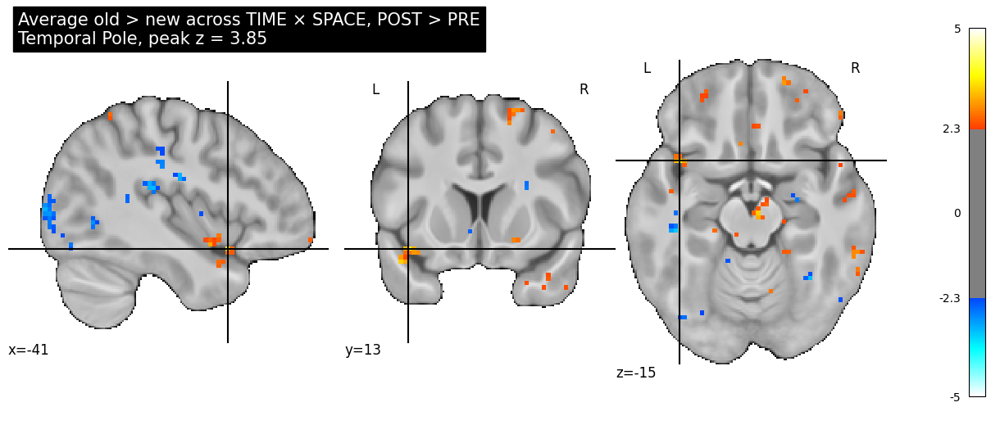

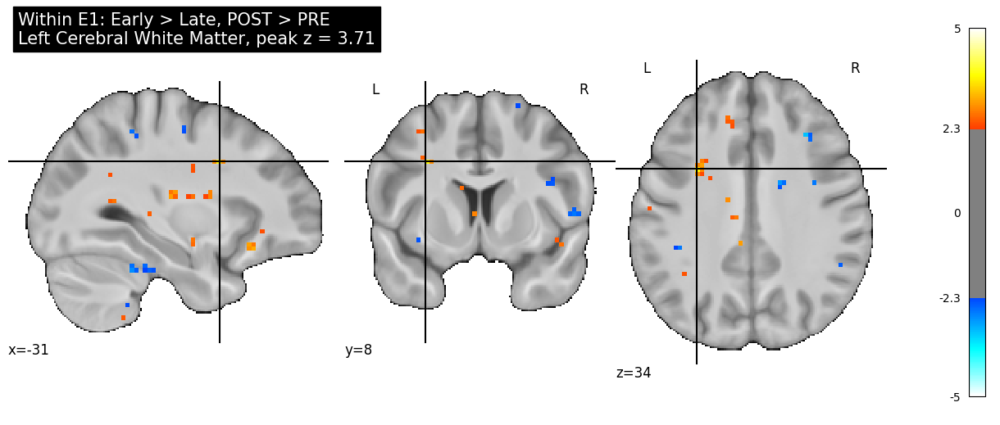

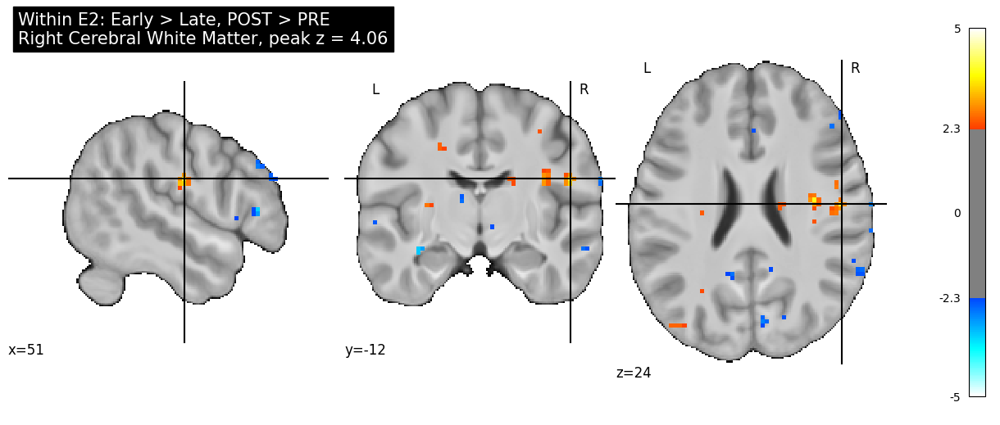

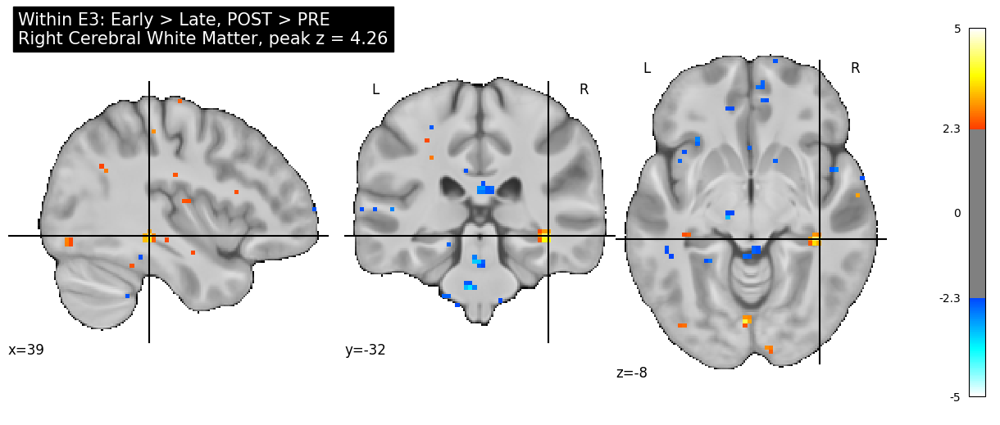

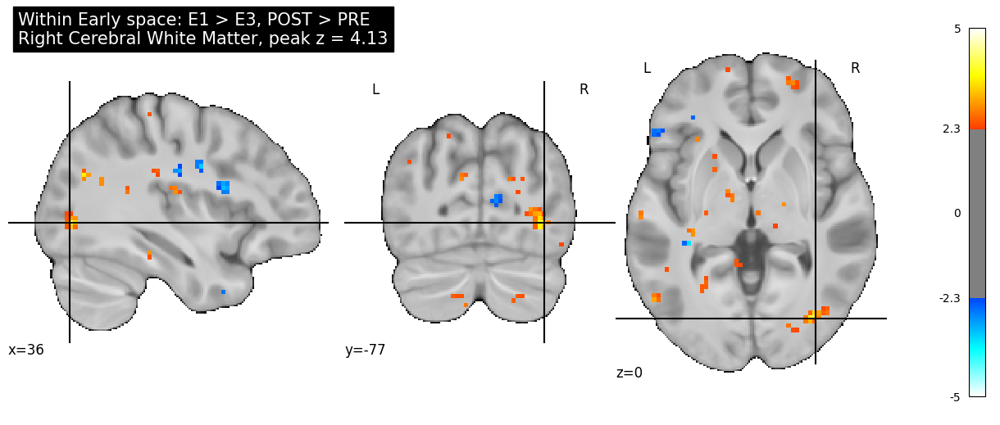

...

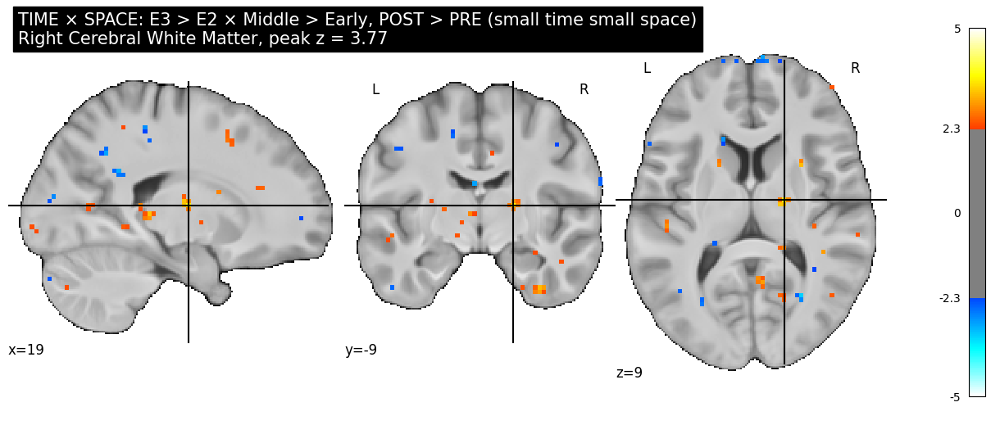

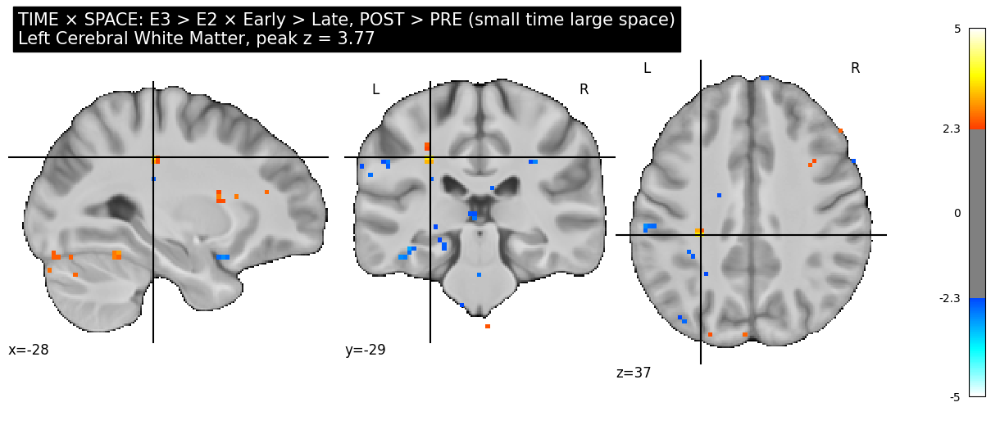

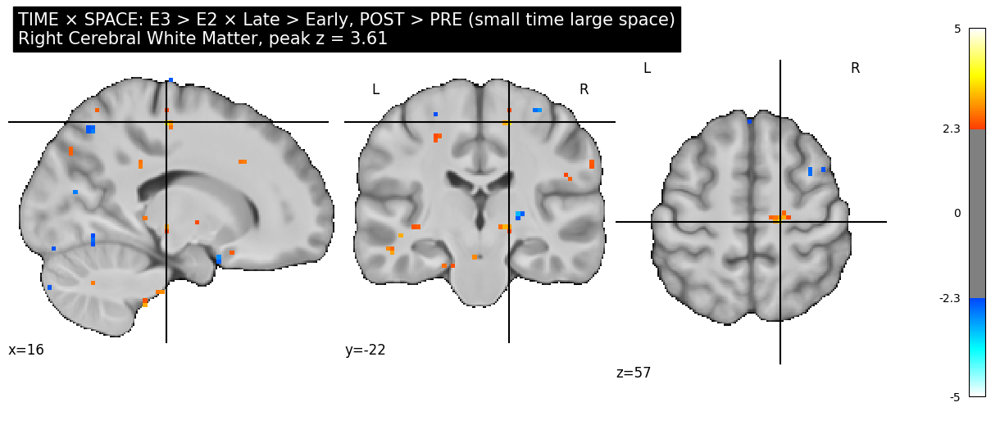

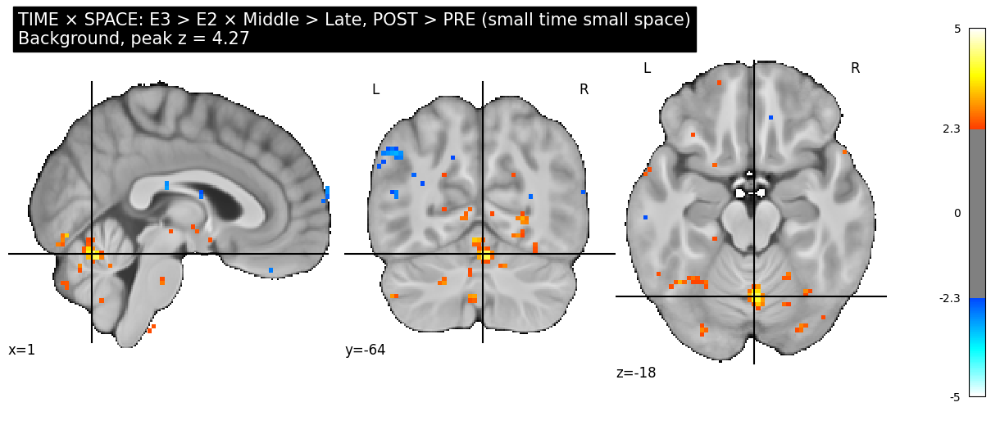

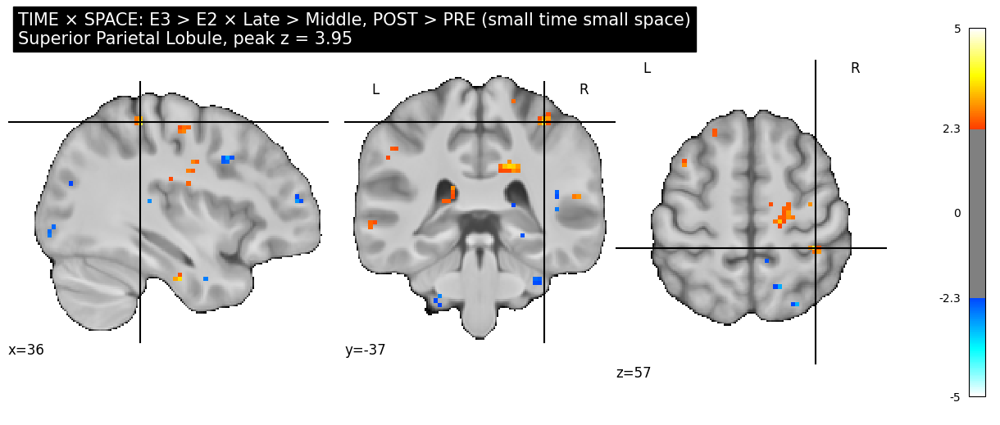

,contrast,figure_path,cut_x,cut_y,cut_z
0,time_space_old_gt_new_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/pre_post_time_x_encoding_space_interaction_glm_time_space_old_gt_new_post_gt...,-41.0,13.0,-15.5
1,e1_early_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/pre_post_time_x_encoding_space_interaction_glm_e1_early_gt_late_post_gt_pre_...,-31.0,8.0,34.5
2,e2_early_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/pre_post_time_x_encoding_space_interaction_glm_e2_early_gt_late_post_gt_pre_...,51.5,-12.0,24.5
3,e3_early_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/pre_post_time_x_encoding_space_interaction_glm_e3_early_gt_late_post_gt_pre_...,39.0,-32.0,-8.0
4,early_e1_gt_e3_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/pre_post_time_x_encoding_space_interaction_glm_early_e1_gt_e3_post_gt_pre_sm...,36.5,-77.0,-0.5
5,middle_e1_gt_e3_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/pre_post_time_x_encoding_space_interaction_glm_middle_e1_gt_e3_post_gt_pre_s...,-51.0,-47.0,14.5
6,late_e1_gt_e3_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/pre_post_time_x_encoding_space_interaction_glm_late_e1_gt_e3_post_gt_pre_smo...,49.0,-62.0,-8.0
7,time_e1_gt_e2_x_space_early_gt_middle_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/pre_post_time_x_encoding_space_interaction_glm_time_e1_gt_e2_x_space_early_g...,-3.5,-49.5,27.0
8,time_e1_gt_e2_x_space_middle_gt_early_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/pre_post_time_x_encoding_space_interaction_glm_time_e1_gt_e2_x_space_middle_...,49.0,0.5,22.0
9,time_e1_gt_e2_x_space_early_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/pre_post_time_x_encoding_space_interaction_glm_time_e1_gt_e2_x_space_early_g...,21.5,48.0,34.5


Saved: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/pre_post_time_x_encoding_space_interaction_glm_main_plot_index_smoothed5mm.csv


In [11]:
# ============================================================
# 11. Plot main TIME × SPACE contrasts on mean T1w background
# ============================================================

plot_rows = []

second_level_by_contrast = second_level_table.set_index("contrast")

for contrast_name in main_contrasts:
    if contrast_name not in second_level_by_contrast.index:
        print("Skipping missing contrast:", contrast_name)
        continue

    z_map_path = second_level_by_contrast.loc[contrast_name, "z_map_path"]

    table = cluster_details_labeled.query(
        "contrast == @contrast_name and threshold_label == 'z_gt_2.33'"
    ).copy()

    if len(table) > 0:
        top = table.sort_values("Peak Stat", ascending=False).iloc[0]
        cut_coords = (float(top["X"]), float(top["Y"]), float(top["Z"]))
        atlas_label = top.get("harvard_oxford_cortical_label", "")
        if atlas_label == "Background":
            atlas_label = top.get("harvard_oxford_subcortical_label", "Background")
        title = (
            f"{plot_title_map.get(contrast_name, contrast_name)}\n"
            f"{atlas_label}, peak z = {float(top['Peak Stat']):.2f}"
        )
    else:
        cut_coords = (0, 0, 0)
        title = plot_title_map.get(contrast_name, contrast_name)

    fig_path = dirs["figures"] / f"{ANALYSIS_NAME}_{contrast_name}_{SMOOTHING_LABEL}_zgt2p33.png"

    plot_group_stat_map(
        z_map_path=z_map_path,
        cut_coords=cut_coords,
        title=title,
        threshold=2.33,
        vmax=5.0,
        output_path=fig_path,
        bg_img=mean_t1w_img if USE_MEAN_T1W_BACKGROUND else None,
        dim=-0.2,
    )

    plot_rows.append({
        "contrast": contrast_name,
        "figure_path": str(fig_path),
        "cut_x": cut_coords[0],
        "cut_y": cut_coords[1],
        "cut_z": cut_coords[2],
    })

plot_index = pd.DataFrame(plot_rows)
plot_index_path = dirs["tables"] / f"{ANALYSIS_NAME}_main_plot_index_{SMOOTHING_LABEL}.csv"
plot_index.to_csv(plot_index_path, index=False)
display(plot_index)
print("Saved:", plot_index_path)


In [12]:
# ============================================================
# 12. Save optional interactive views
# ============================================================

interactive_rows = []

for contrast_name in main_contrasts:
    if contrast_name not in set(second_level_table["contrast"]):
        print("Skipping missing contrast:", contrast_name)
        continue

    z_map_path = second_level_table.set_index("contrast").loc[contrast_name, "z_map_path"]
    html_path = dirs["interactive"] / f"{ANALYSIS_NAME}_{contrast_name}_{SMOOTHING_LABEL}_interactive.html"
    view = make_interactive_view(
        z_map_path,
        threshold=2.33,
        title=plot_title_map.get(contrast_name, contrast_name),
    )
    view.save_as_html(str(html_path))
    interactive_rows.append({"contrast": contrast_name, "interactive_html_path": str(html_path)})

interactive_index = pd.DataFrame(interactive_rows)
interactive_index_path = dirs["tables"] / f"{ANALYSIS_NAME}_interactive_index_{SMOOTHING_LABEL}.csv"
interactive_index.to_csv(interactive_index_path, index=False)

display(interactive_index)
print("Saved:", interactive_index_path)


/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWa

,contrast,interactive_html_path
0,time_space_old_gt_new_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/pre_post_time_x_encoding_space_interaction_glm_time_space_old_gt_n...
1,e1_early_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/pre_post_time_x_encoding_space_interaction_glm_e1_early_gt_late_po...
2,e2_early_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/pre_post_time_x_encoding_space_interaction_glm_e2_early_gt_late_po...
3,e3_early_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/pre_post_time_x_encoding_space_interaction_glm_e3_early_gt_late_po...
4,early_e1_gt_e3_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/pre_post_time_x_encoding_space_interaction_glm_early_e1_gt_e3_post...
5,middle_e1_gt_e3_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/pre_post_time_x_encoding_space_interaction_glm_middle_e1_gt_e3_pos...
6,late_e1_gt_e3_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/pre_post_time_x_encoding_space_interaction_glm_late_e1_gt_e3_post_...
7,time_e1_gt_e2_x_space_early_gt_middle_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/pre_post_time_x_encoding_space_interaction_glm_time_e1_gt_e2_x_spa...
8,time_e1_gt_e2_x_space_middle_gt_early_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/pre_post_time_x_encoding_space_interaction_glm_time_e1_gt_e2_x_spa...
9,time_e1_gt_e2_x_space_early_gt_late_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/pre_post_time_x_encoding_space_interaction_glm_time_e1_gt_e2_x_spa...


Saved: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/pre_post_time_x_encoding_space_interaction_glm_interactive_index_smoothed5mm.csv


## ROI visualization with hippocampus/amygdala masks

For each selected TIME × SPACE contrast, this cell creates:

- an ROI-masked interactive HTML view showing only activity inside the group consensus hippoAmyg mask;
- a static whole-brain z-map with the hippoAmyg ROI contour overlaid;
- a table counting suprathreshold positive/negative voxels inside the ROI.

This is intended for inspecting possible anterior/posterior hippocampal involvement in TIME × SPACE gradients.


ROI root: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/rois/hippoAmyg_02022024
Saving ROI figures to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays
Saving ROI interactive views to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views
Loaded 54 unilateral ROI masks.


Saved group consensus ROI mask:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/roi_overlap/group_consensus_hippoAmyg_threshold-0.50_mask.nii.gz


/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


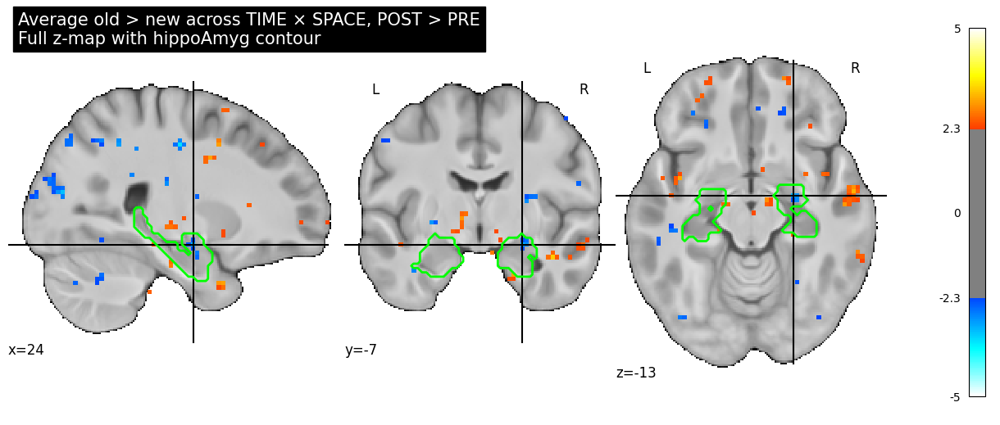

Contrast: time_space_old_gt_new_post_gt_pre
Title: Average old > new across TIME × SPACE, POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_space_old_gt_new_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_space_old_gt_new_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 5, 'negative_suprathreshold_voxels_inside_roi': 10, 'max_z_inside_roi': 2.802212715148926, 'min_z_inside_roi': -3.2346668243408203, 'contrast': 'time_space_old_gt_new_post_gt_pre', 'priority': '12_average_old_new_post_pre_control', 'display_title': 'Average old > new across TIME × SPACE, POST > PRE', '

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


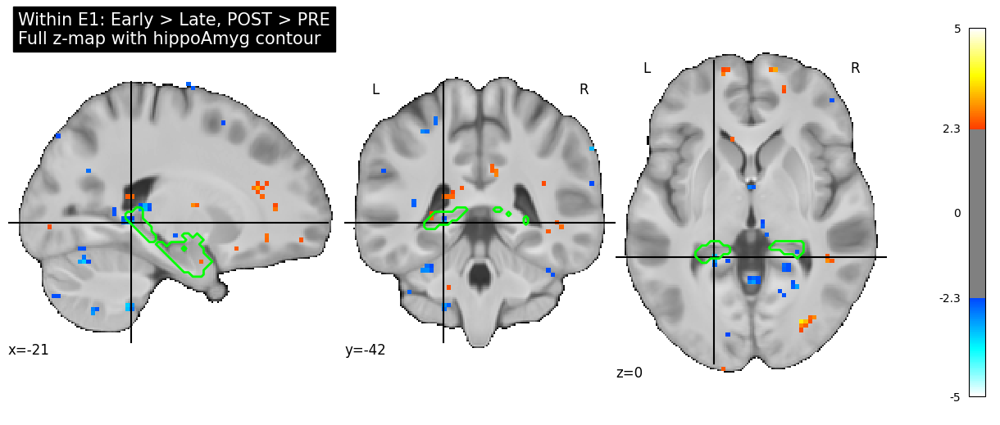

Contrast: e1_early_gt_late_post_gt_pre
Title: Within E1: Early > Late, POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/e1_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/e1_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 23, 'negative_suprathreshold_voxels_inside_roi': 14, 'max_z_inside_roi': 2.863239049911499, 'min_z_inside_roi': -3.291080951690674, 'contrast': 'e1_early_gt_late_post_gt_pre', 'priority': '12_within_episode_space_post_pre', 'display_title': 'Within E1: Early > Late, POST > PRE', 'z_map_path': '/media/RCPNAS/Data3/Alison_island/kro

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


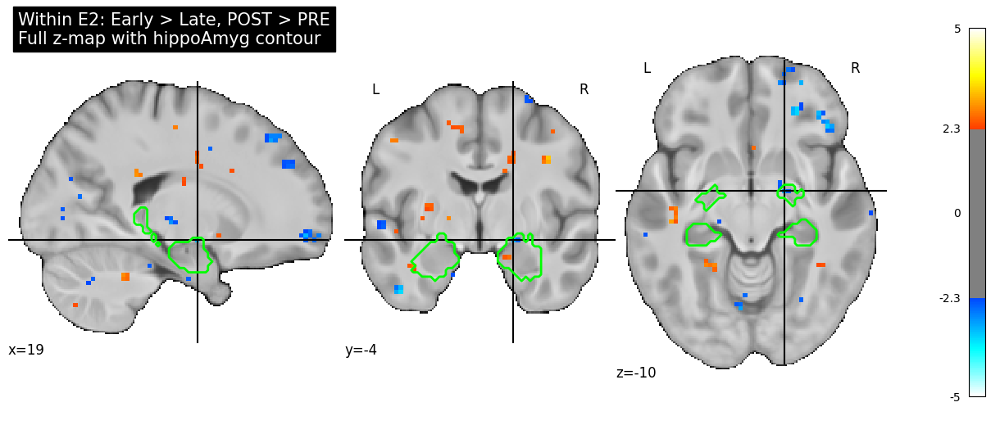

Contrast: e2_early_gt_late_post_gt_pre
Title: Within E2: Early > Late, POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/e2_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/e2_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 7, 'negative_suprathreshold_voxels_inside_roi': 4, 'max_z_inside_roi': 3.201507329940796, 'min_z_inside_roi': -3.2217214107513428, 'contrast': 'e2_early_gt_late_post_gt_pre', 'priority': '12_within_episode_space_post_pre', 'display_title': 'Within E2: Early > Late, POST > PRE', 'z_map_path': '/media/RCPNAS/Data3/Alison_island/kroc

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


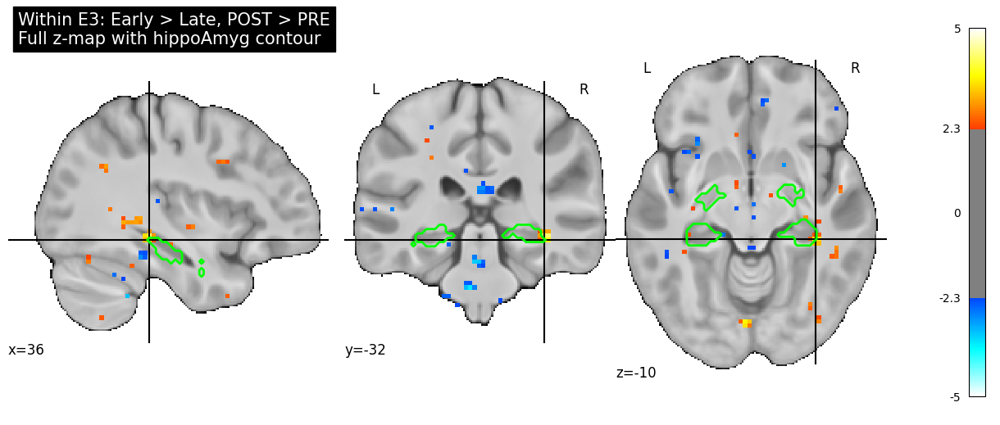

Contrast: e3_early_gt_late_post_gt_pre
Title: Within E3: Early > Late, POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/e3_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/e3_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 21, 'negative_suprathreshold_voxels_inside_roi': 2, 'max_z_inside_roi': 3.7390103340148926, 'min_z_inside_roi': -2.681007146835327, 'contrast': 'e3_early_gt_late_post_gt_pre', 'priority': '12_within_episode_space_post_pre', 'display_title': 'Within E3: Early > Late, POST > PRE', 'z_map_path': '/media/RCPNAS/Data3/Alison_island/kro

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


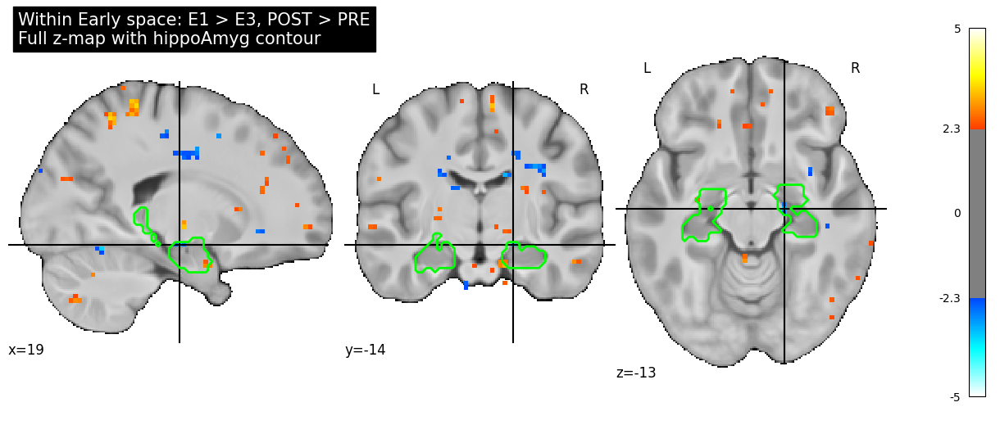

Contrast: early_e1_gt_e3_post_gt_pre
Title: Within Early space: E1 > E3, POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/early_e1_gt_e3_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/early_e1_gt_e3_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 16, 'negative_suprathreshold_voxels_inside_roi': 8, 'max_z_inside_roi': 3.0330822467803955, 'min_z_inside_roi': -3.299539566040039, 'contrast': 'early_e1_gt_e3_post_gt_pre', 'priority': '12_within_space_time_post_pre', 'display_title': 'Within Early space: E1 > E3, POST > PRE', 'z_map_path': '/media/RCPNAS/Data3/Alison_island/krocza

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


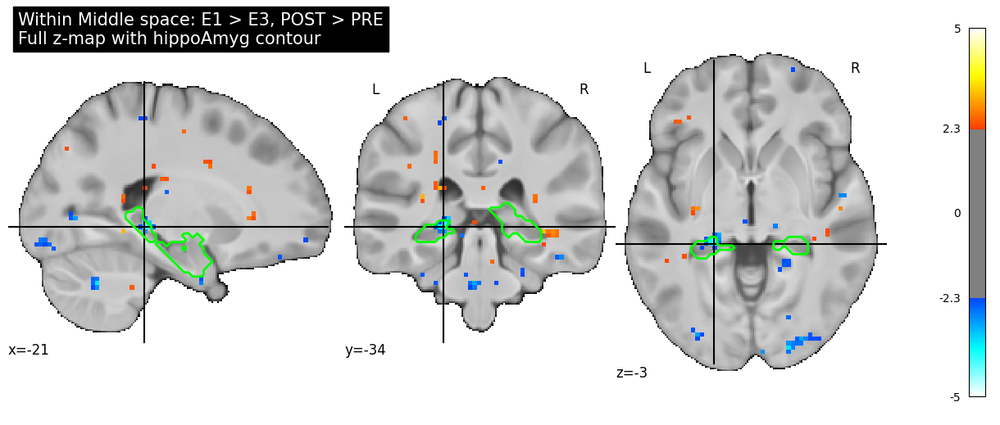

Contrast: middle_e1_gt_e3_post_gt_pre
Title: Within Middle space: E1 > E3, POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/middle_e1_gt_e3_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/middle_e1_gt_e3_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 21, 'negative_suprathreshold_voxels_inside_roi': 14, 'max_z_inside_roi': 3.6832478046417236, 'min_z_inside_roi': -4.096657752990723, 'contrast': 'middle_e1_gt_e3_post_gt_pre', 'priority': '12_within_space_time_post_pre', 'display_title': 'Within Middle space: E1 > E3, POST > PRE', 'z_map_path': '/media/RCPNAS/Data3/Alison_island

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


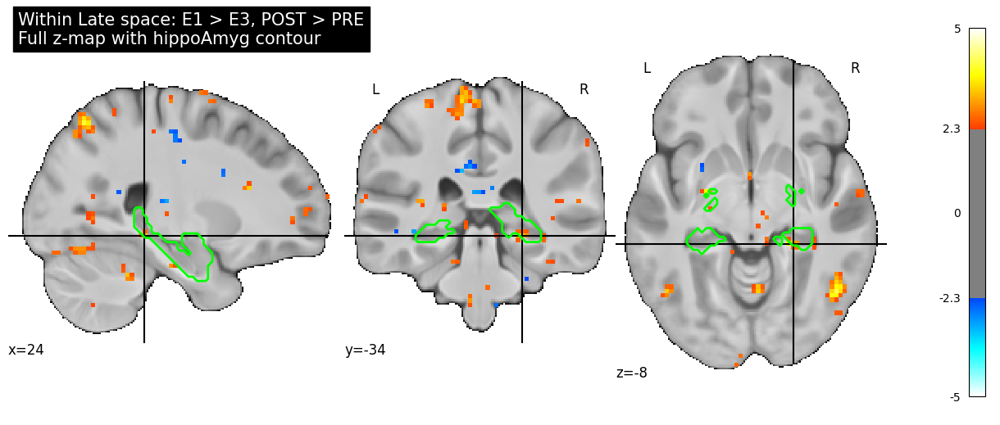

Contrast: late_e1_gt_e3_post_gt_pre
Title: Within Late space: E1 > E3, POST > PRE
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/late_e1_gt_e3_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/late_e1_gt_e3_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 21, 'negative_suprathreshold_voxels_inside_roi': 3, 'max_z_inside_roi': 3.308504104614258, 'min_z_inside_roi': -2.4468994140625, 'contrast': 'late_e1_gt_e3_post_gt_pre', 'priority': '12_within_space_time_post_pre', 'display_title': 'Within Late space: E1 > E3, POST > PRE', 'z_map_path': '/media/RCPNAS/Data3/Alison_island/kroczak/island_

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


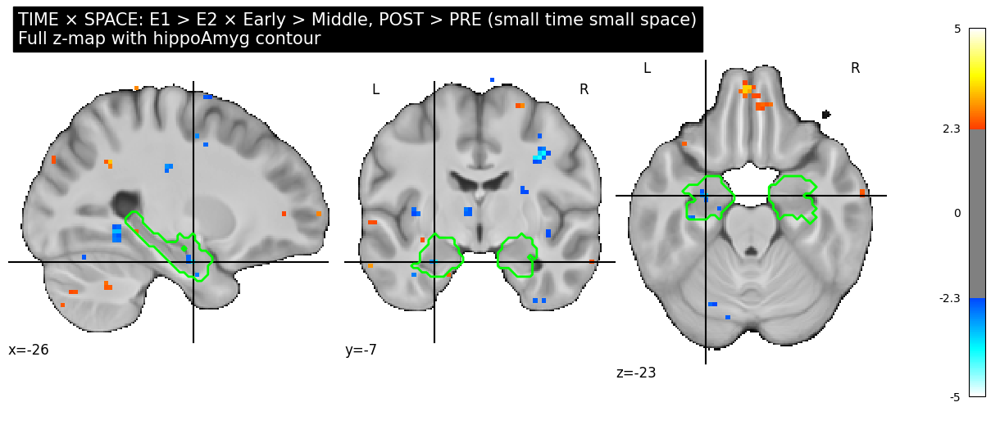

Contrast: time_e1_gt_e2_x_space_early_gt_middle_post_gt_pre
Title: TIME × SPACE: E1 > E2 × Early > Middle, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e2_x_space_early_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e2_x_space_early_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 9, 'negative_suprathreshold_voxels_inside_roi': 25, 'max_z_inside_roi': 2.936601161956787, 'min_z_inside_roi': -3.606964111328125, 'contrast': 'time_e1_gt_e2_x_space_early_gt_middle_post_gt_pre', 'priority': '12_time_space_intera

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


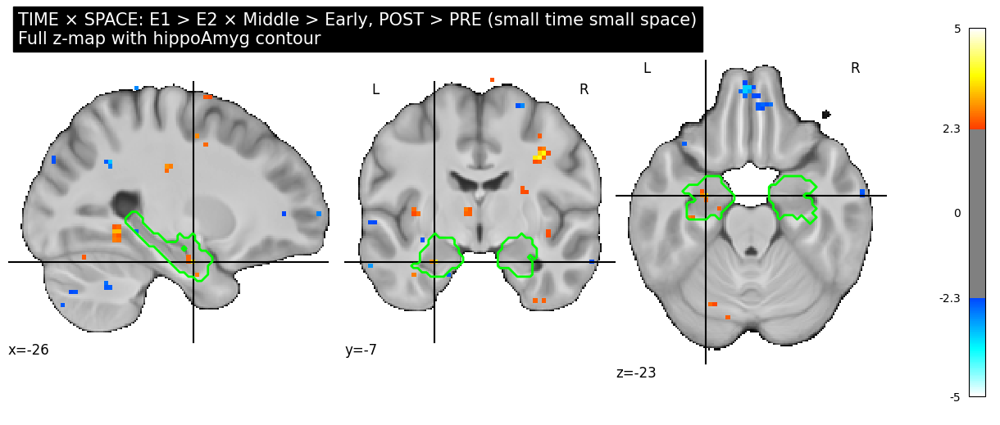

Contrast: time_e1_gt_e2_x_space_middle_gt_early_post_gt_pre
Title: TIME × SPACE: E1 > E2 × Middle > Early, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e2_x_space_middle_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e2_x_space_middle_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 25, 'negative_suprathreshold_voxels_inside_roi': 9, 'max_z_inside_roi': 3.606964111328125, 'min_z_inside_roi': -2.936601161956787, 'contrast': 'time_e1_gt_e2_x_space_middle_gt_early_post_gt_pre', 'priority': '12_time_space_intera

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


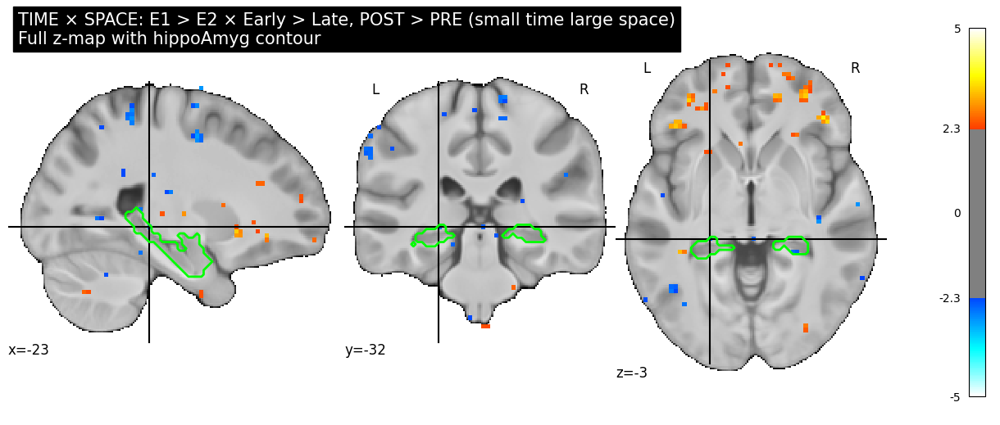

Contrast: time_e1_gt_e2_x_space_early_gt_late_post_gt_pre
Title: TIME × SPACE: E1 > E2 × Early > Late, POST > PRE (small time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e2_x_space_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e2_x_space_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 2, 'negative_suprathreshold_voxels_inside_roi': 3, 'max_z_inside_roi': 2.46960711479187, 'min_z_inside_roi': -2.6669092178344727, 'contrast': 'time_e1_gt_e2_x_space_early_gt_late_post_gt_pre', 'priority': '12_time_space_interaction_small

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


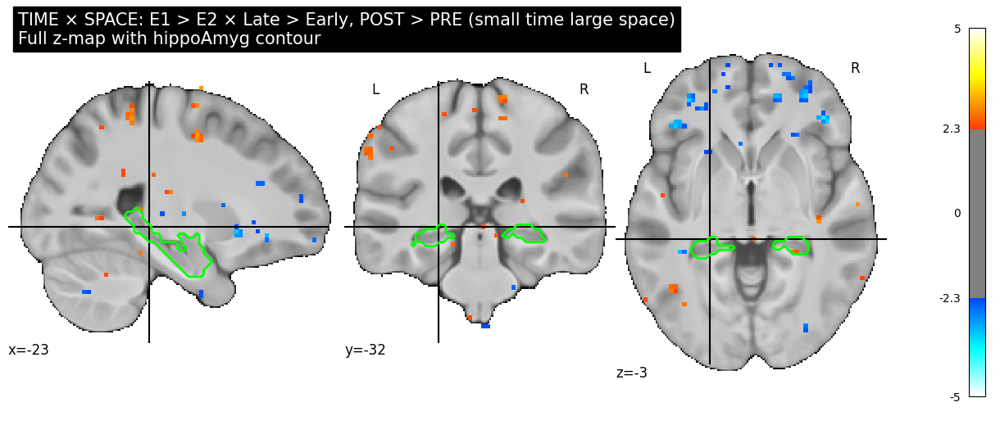

Contrast: time_e1_gt_e2_x_space_late_gt_early_post_gt_pre
Title: TIME × SPACE: E1 > E2 × Late > Early, POST > PRE (small time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e2_x_space_late_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e2_x_space_late_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 3, 'negative_suprathreshold_voxels_inside_roi': 2, 'max_z_inside_roi': 2.6669092178344727, 'min_z_inside_roi': -2.46960711479187, 'contrast': 'time_e1_gt_e2_x_space_late_gt_early_post_gt_pre', 'priority': '12_time_space_interaction_small

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


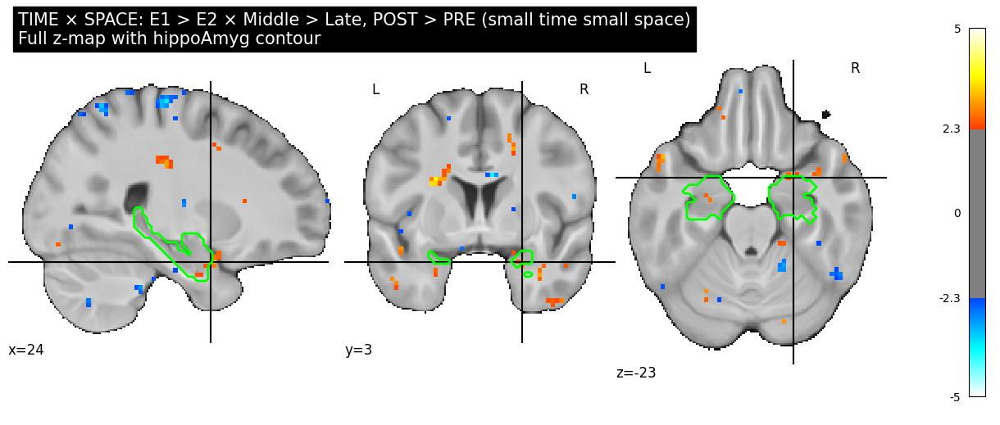

Contrast: time_e1_gt_e2_x_space_middle_gt_late_post_gt_pre
Title: TIME × SPACE: E1 > E2 × Middle > Late, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e2_x_space_middle_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e2_x_space_middle_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 12, 'negative_suprathreshold_voxels_inside_roi': 6, 'max_z_inside_roi': 3.082882881164551, 'min_z_inside_roi': -2.597656488418579, 'contrast': 'time_e1_gt_e2_x_space_middle_gt_late_post_gt_pre', 'priority': '12_time_space_interaction

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


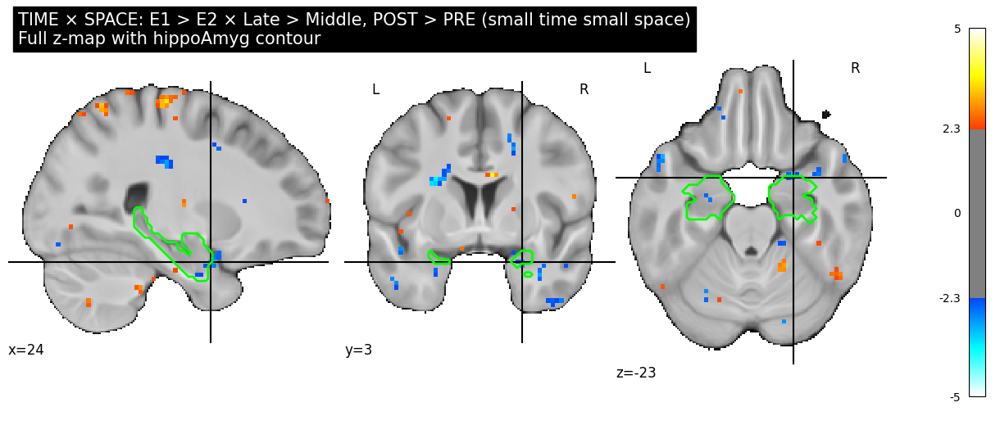

Contrast: time_e1_gt_e2_x_space_late_gt_middle_post_gt_pre
Title: TIME × SPACE: E1 > E2 × Late > Middle, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e2_x_space_late_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e2_x_space_late_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 6, 'negative_suprathreshold_voxels_inside_roi': 12, 'max_z_inside_roi': 2.597656488418579, 'min_z_inside_roi': -3.082882881164551, 'contrast': 'time_e1_gt_e2_x_space_late_gt_middle_post_gt_pre', 'priority': '12_time_space_interaction

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


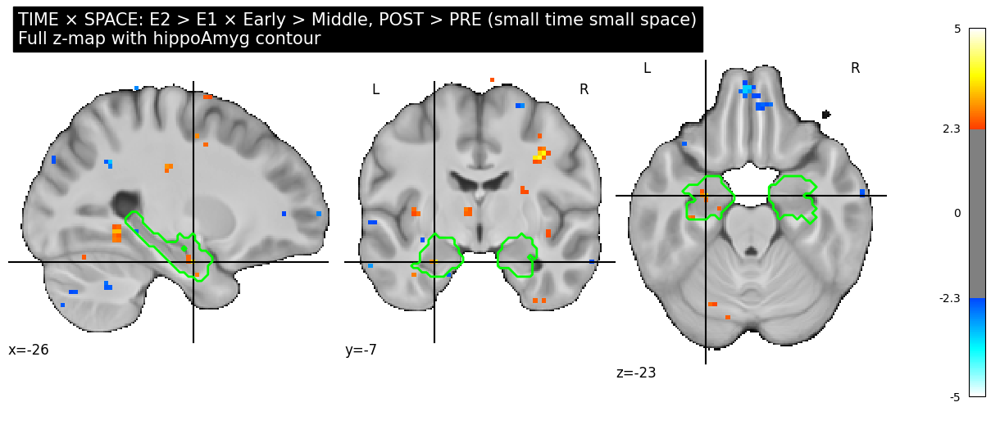

Contrast: time_e2_gt_e1_x_space_early_gt_middle_post_gt_pre
Title: TIME × SPACE: E2 > E1 × Early > Middle, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e1_x_space_early_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e1_x_space_early_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 25, 'negative_suprathreshold_voxels_inside_roi': 9, 'max_z_inside_roi': 3.606964111328125, 'min_z_inside_roi': -2.936601161956787, 'contrast': 'time_e2_gt_e1_x_space_early_gt_middle_post_gt_pre', 'priority': '12_time_space_intera

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


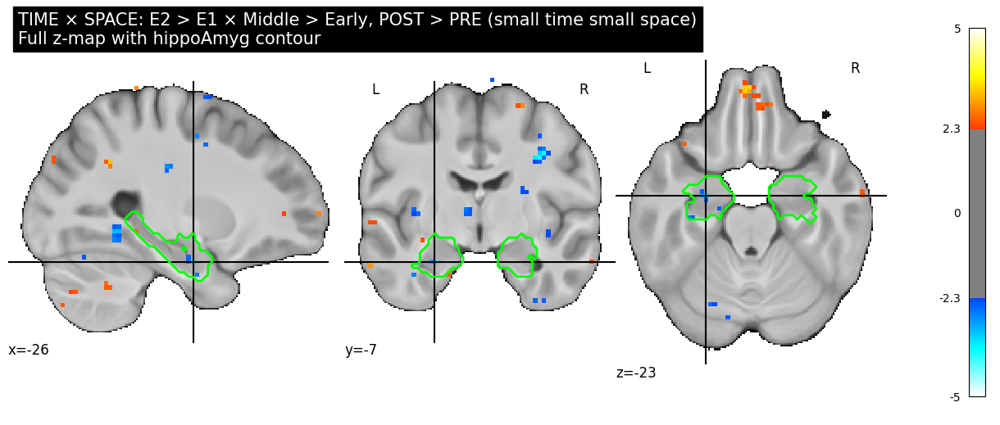

Contrast: time_e2_gt_e1_x_space_middle_gt_early_post_gt_pre
Title: TIME × SPACE: E2 > E1 × Middle > Early, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e1_x_space_middle_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e1_x_space_middle_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 9, 'negative_suprathreshold_voxels_inside_roi': 25, 'max_z_inside_roi': 2.936601161956787, 'min_z_inside_roi': -3.606964111328125, 'contrast': 'time_e2_gt_e1_x_space_middle_gt_early_post_gt_pre', 'priority': '12_time_space_intera

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


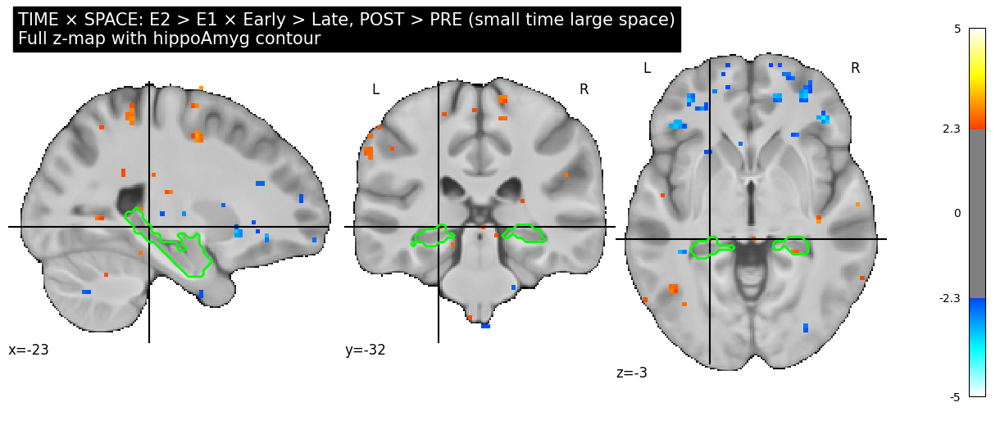

Contrast: time_e2_gt_e1_x_space_early_gt_late_post_gt_pre
Title: TIME × SPACE: E2 > E1 × Early > Late, POST > PRE (small time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e1_x_space_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e1_x_space_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 3, 'negative_suprathreshold_voxels_inside_roi': 2, 'max_z_inside_roi': 2.6669092178344727, 'min_z_inside_roi': -2.46960711479187, 'contrast': 'time_e2_gt_e1_x_space_early_gt_late_post_gt_pre', 'priority': '12_time_space_interaction_small

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


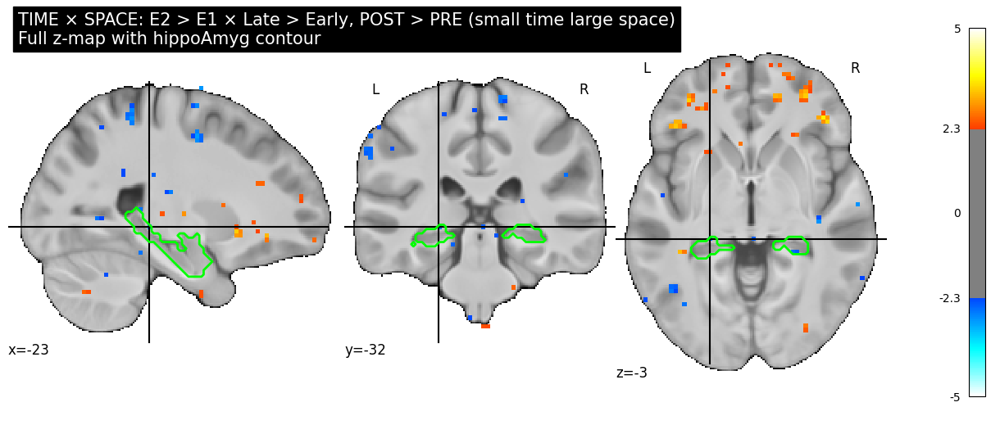

Contrast: time_e2_gt_e1_x_space_late_gt_early_post_gt_pre
Title: TIME × SPACE: E2 > E1 × Late > Early, POST > PRE (small time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e1_x_space_late_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e1_x_space_late_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 2, 'negative_suprathreshold_voxels_inside_roi': 3, 'max_z_inside_roi': 2.46960711479187, 'min_z_inside_roi': -2.6669092178344727, 'contrast': 'time_e2_gt_e1_x_space_late_gt_early_post_gt_pre', 'priority': '12_time_space_interaction_small

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


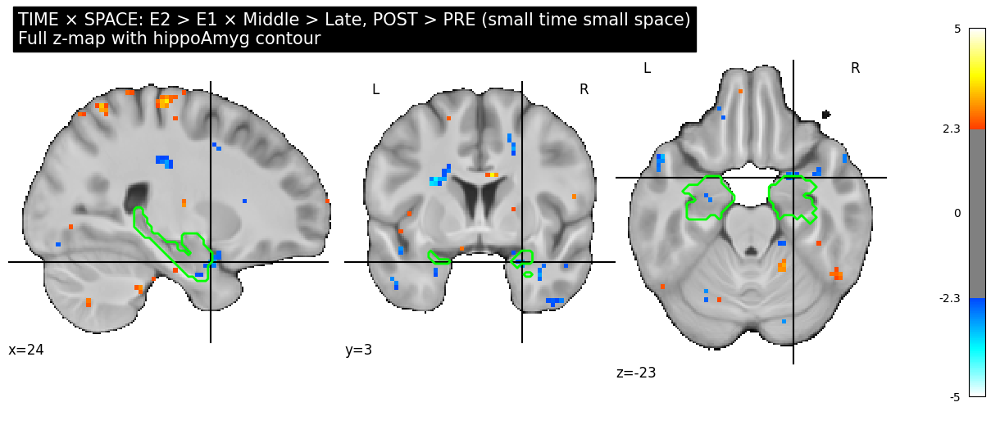

Contrast: time_e2_gt_e1_x_space_middle_gt_late_post_gt_pre
Title: TIME × SPACE: E2 > E1 × Middle > Late, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e1_x_space_middle_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e1_x_space_middle_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 6, 'negative_suprathreshold_voxels_inside_roi': 12, 'max_z_inside_roi': 2.597656488418579, 'min_z_inside_roi': -3.082882881164551, 'contrast': 'time_e2_gt_e1_x_space_middle_gt_late_post_gt_pre', 'priority': '12_time_space_interaction

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


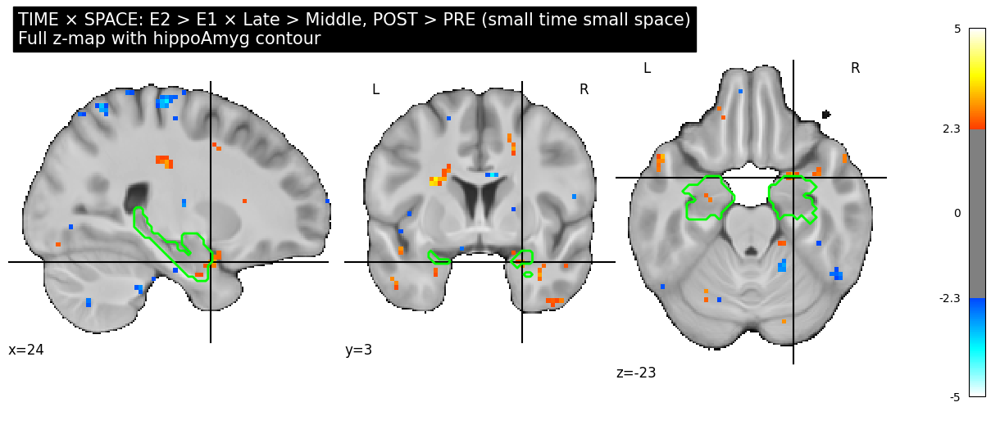

Contrast: time_e2_gt_e1_x_space_late_gt_middle_post_gt_pre
Title: TIME × SPACE: E2 > E1 × Late > Middle, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e1_x_space_late_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e1_x_space_late_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 12, 'negative_suprathreshold_voxels_inside_roi': 6, 'max_z_inside_roi': 3.082882881164551, 'min_z_inside_roi': -2.597656488418579, 'contrast': 'time_e2_gt_e1_x_space_late_gt_middle_post_gt_pre', 'priority': '12_time_space_interaction

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


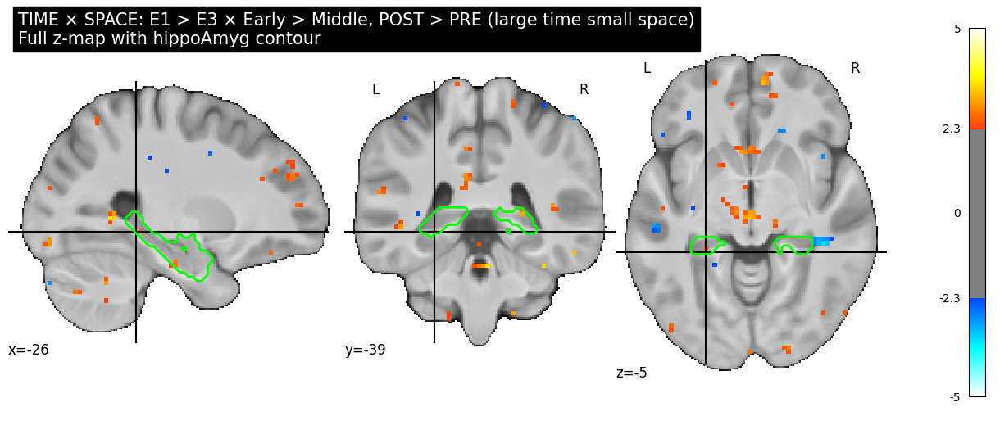

Contrast: time_e1_gt_e3_x_space_early_gt_middle_post_gt_pre
Title: TIME × SPACE: E1 > E3 × Early > Middle, POST > PRE (large time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e3_x_space_early_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e3_x_space_early_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 17, 'negative_suprathreshold_voxels_inside_roi': 7, 'max_z_inside_roi': 3.094153642654419, 'min_z_inside_roi': -2.8695266246795654, 'contrast': 'time_e1_gt_e3_x_space_early_gt_middle_post_gt_pre', 'priority': '12_time_space_inter

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


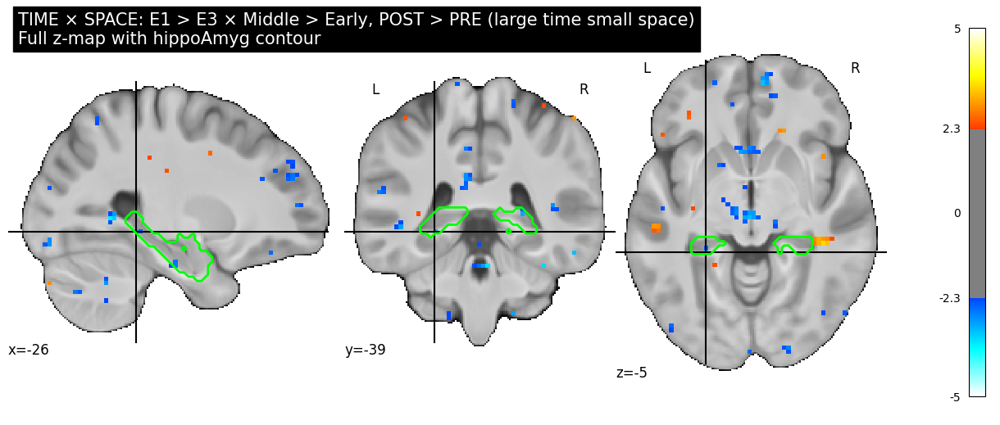

Contrast: time_e1_gt_e3_x_space_middle_gt_early_post_gt_pre
Title: TIME × SPACE: E1 > E3 × Middle > Early, POST > PRE (large time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e3_x_space_middle_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e3_x_space_middle_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 7, 'negative_suprathreshold_voxels_inside_roi': 17, 'max_z_inside_roi': 2.8695266246795654, 'min_z_inside_roi': -3.094153642654419, 'contrast': 'time_e1_gt_e3_x_space_middle_gt_early_post_gt_pre', 'priority': '12_time_space_inter

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


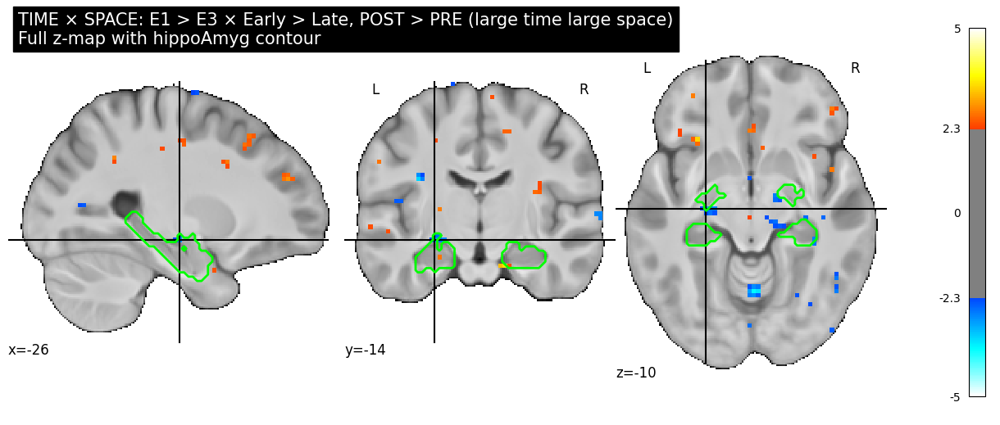

Contrast: time_e1_gt_e3_x_space_early_gt_late_post_gt_pre
Title: TIME × SPACE: E1 > E3 × Early > Late, POST > PRE (large time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e3_x_space_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e3_x_space_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 11, 'negative_suprathreshold_voxels_inside_roi': 15, 'max_z_inside_roi': 2.892782688140869, 'min_z_inside_roi': -2.9484989643096924, 'contrast': 'time_e1_gt_e3_x_space_early_gt_late_post_gt_pre', 'priority': '12_time_space_interaction_la

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


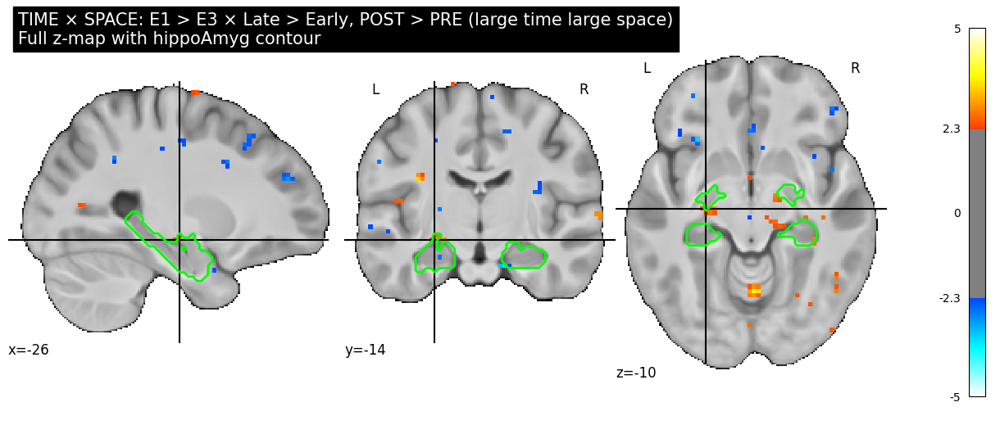

Contrast: time_e1_gt_e3_x_space_late_gt_early_post_gt_pre
Title: TIME × SPACE: E1 > E3 × Late > Early, POST > PRE (large time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e3_x_space_late_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e3_x_space_late_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 15, 'negative_suprathreshold_voxels_inside_roi': 11, 'max_z_inside_roi': 2.9484989643096924, 'min_z_inside_roi': -2.892782688140869, 'contrast': 'time_e1_gt_e3_x_space_late_gt_early_post_gt_pre', 'priority': '12_time_space_interaction_la

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


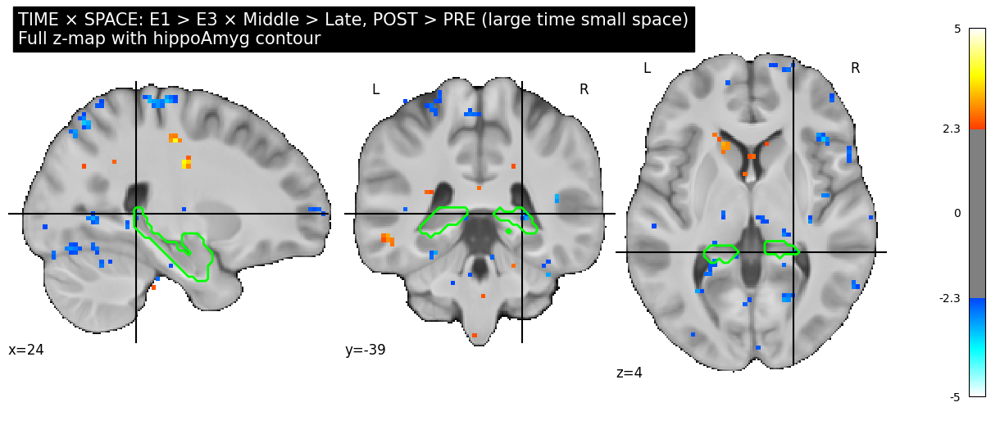

Contrast: time_e1_gt_e3_x_space_middle_gt_late_post_gt_pre
Title: TIME × SPACE: E1 > E3 × Middle > Late, POST > PRE (large time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e3_x_space_middle_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e3_x_space_middle_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 7, 'negative_suprathreshold_voxels_inside_roi': 31, 'max_z_inside_roi': 3.1975748538970947, 'min_z_inside_roi': -3.373218059539795, 'contrast': 'time_e1_gt_e3_x_space_middle_gt_late_post_gt_pre', 'priority': '12_time_space_interactio

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


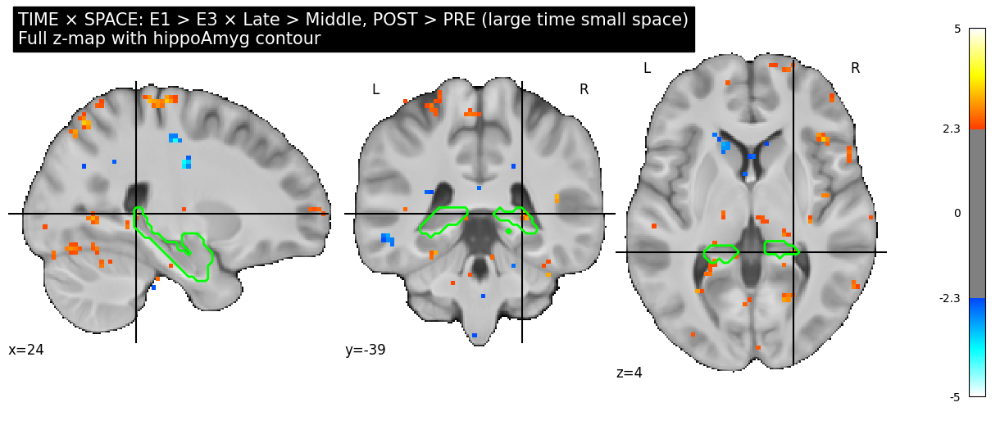

Contrast: time_e1_gt_e3_x_space_late_gt_middle_post_gt_pre
Title: TIME × SPACE: E1 > E3 × Late > Middle, POST > PRE (large time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e1_gt_e3_x_space_late_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e1_gt_e3_x_space_late_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 31, 'negative_suprathreshold_voxels_inside_roi': 7, 'max_z_inside_roi': 3.373218059539795, 'min_z_inside_roi': -3.1975748538970947, 'contrast': 'time_e1_gt_e3_x_space_late_gt_middle_post_gt_pre', 'priority': '12_time_space_interactio

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


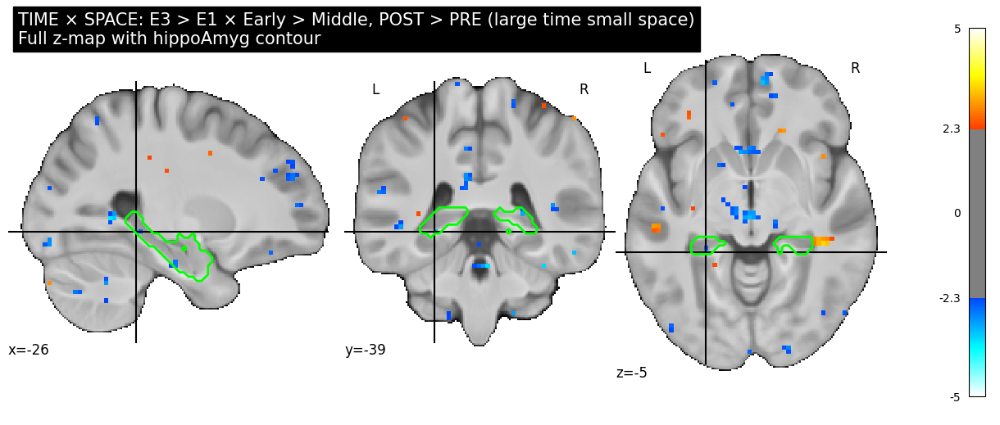

Contrast: time_e3_gt_e1_x_space_early_gt_middle_post_gt_pre
Title: TIME × SPACE: E3 > E1 × Early > Middle, POST > PRE (large time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e1_x_space_early_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e1_x_space_early_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 7, 'negative_suprathreshold_voxels_inside_roi': 17, 'max_z_inside_roi': 2.8695266246795654, 'min_z_inside_roi': -3.094153642654419, 'contrast': 'time_e3_gt_e1_x_space_early_gt_middle_post_gt_pre', 'priority': '12_time_space_inter

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


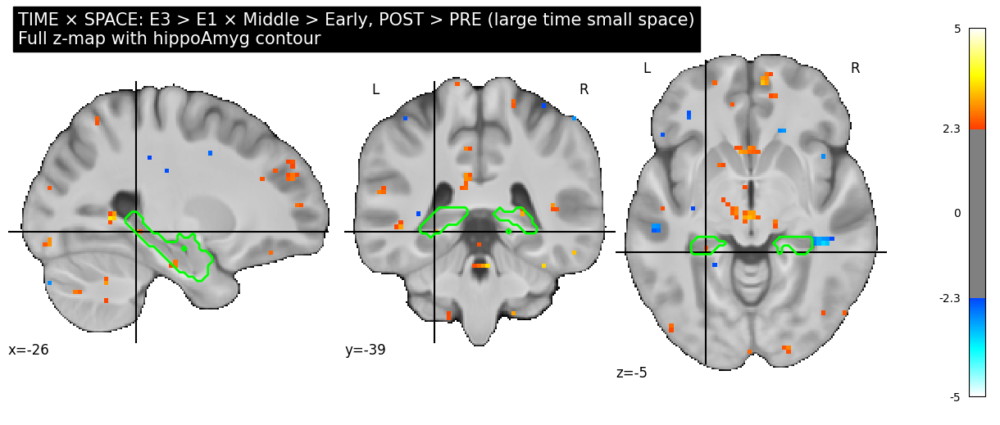

Contrast: time_e3_gt_e1_x_space_middle_gt_early_post_gt_pre
Title: TIME × SPACE: E3 > E1 × Middle > Early, POST > PRE (large time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e1_x_space_middle_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e1_x_space_middle_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 17, 'negative_suprathreshold_voxels_inside_roi': 7, 'max_z_inside_roi': 3.094153642654419, 'min_z_inside_roi': -2.8695266246795654, 'contrast': 'time_e3_gt_e1_x_space_middle_gt_early_post_gt_pre', 'priority': '12_time_space_inter

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


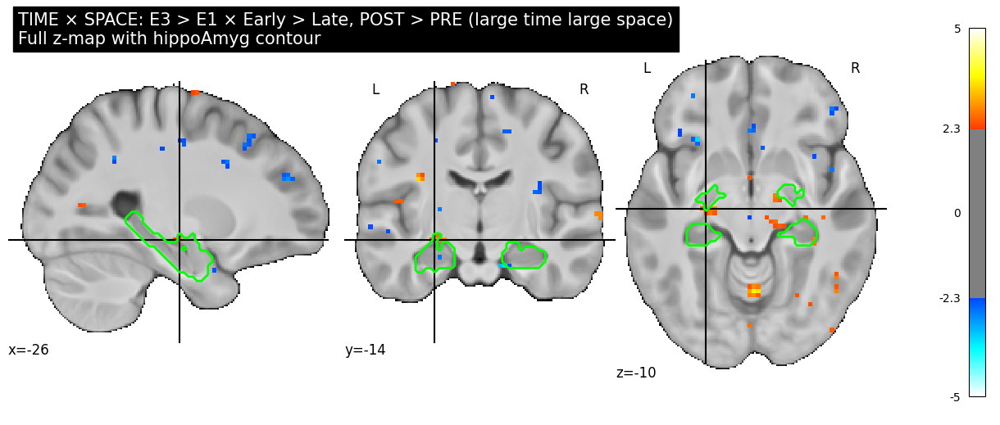

Contrast: time_e3_gt_e1_x_space_early_gt_late_post_gt_pre
Title: TIME × SPACE: E3 > E1 × Early > Late, POST > PRE (large time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e1_x_space_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e1_x_space_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 15, 'negative_suprathreshold_voxels_inside_roi': 11, 'max_z_inside_roi': 2.9484989643096924, 'min_z_inside_roi': -2.892782688140869, 'contrast': 'time_e3_gt_e1_x_space_early_gt_late_post_gt_pre', 'priority': '12_time_space_interaction_la

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


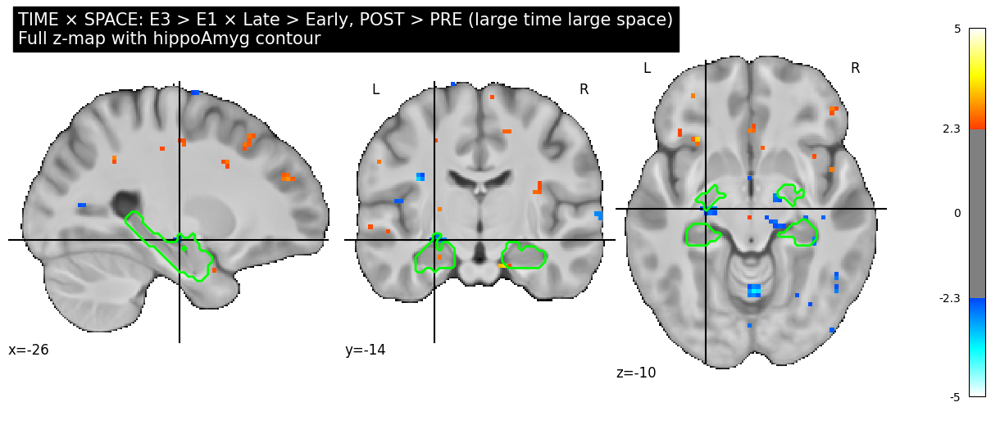

Contrast: time_e3_gt_e1_x_space_late_gt_early_post_gt_pre
Title: TIME × SPACE: E3 > E1 × Late > Early, POST > PRE (large time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e1_x_space_late_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e1_x_space_late_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 11, 'negative_suprathreshold_voxels_inside_roi': 15, 'max_z_inside_roi': 2.892782688140869, 'min_z_inside_roi': -2.9484989643096924, 'contrast': 'time_e3_gt_e1_x_space_late_gt_early_post_gt_pre', 'priority': '12_time_space_interaction_la

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


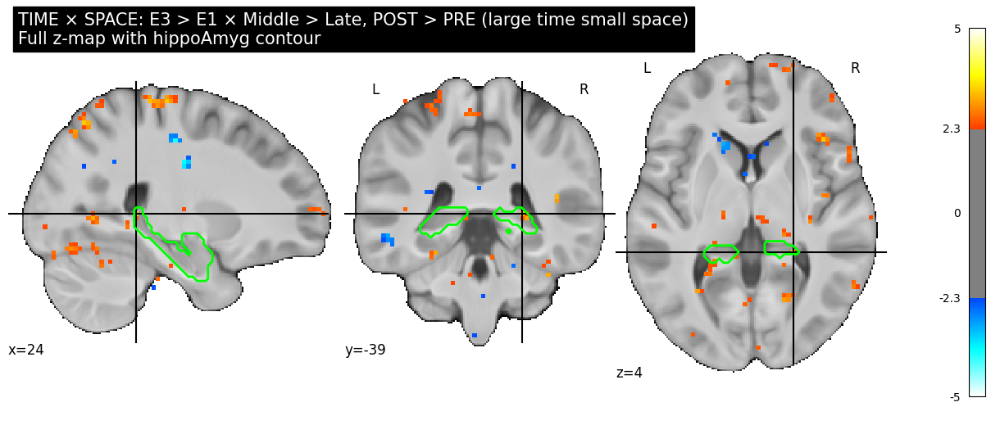

Contrast: time_e3_gt_e1_x_space_middle_gt_late_post_gt_pre
Title: TIME × SPACE: E3 > E1 × Middle > Late, POST > PRE (large time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e1_x_space_middle_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e1_x_space_middle_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 31, 'negative_suprathreshold_voxels_inside_roi': 7, 'max_z_inside_roi': 3.373218059539795, 'min_z_inside_roi': -3.1975748538970947, 'contrast': 'time_e3_gt_e1_x_space_middle_gt_late_post_gt_pre', 'priority': '12_time_space_interactio

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


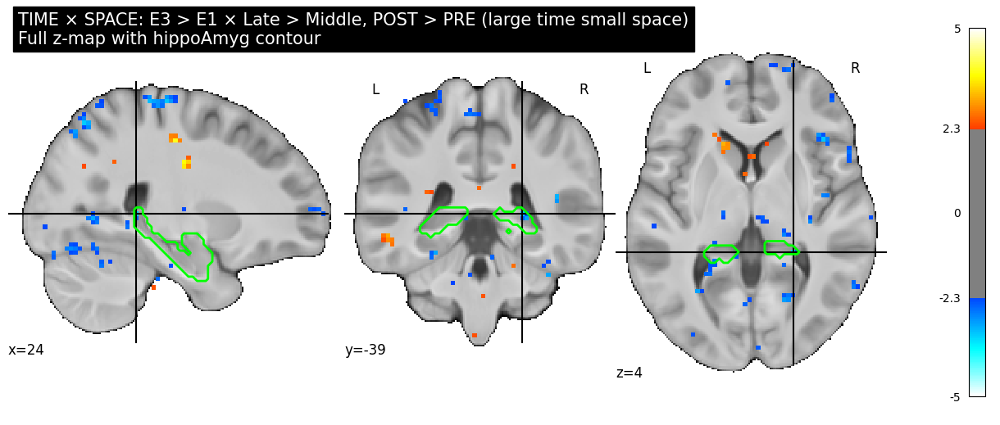

Contrast: time_e3_gt_e1_x_space_late_gt_middle_post_gt_pre
Title: TIME × SPACE: E3 > E1 × Late > Middle, POST > PRE (large time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e1_x_space_late_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e1_x_space_late_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 7, 'negative_suprathreshold_voxels_inside_roi': 31, 'max_z_inside_roi': 3.1975748538970947, 'min_z_inside_roi': -3.373218059539795, 'contrast': 'time_e3_gt_e1_x_space_late_gt_middle_post_gt_pre', 'priority': '12_time_space_interactio

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


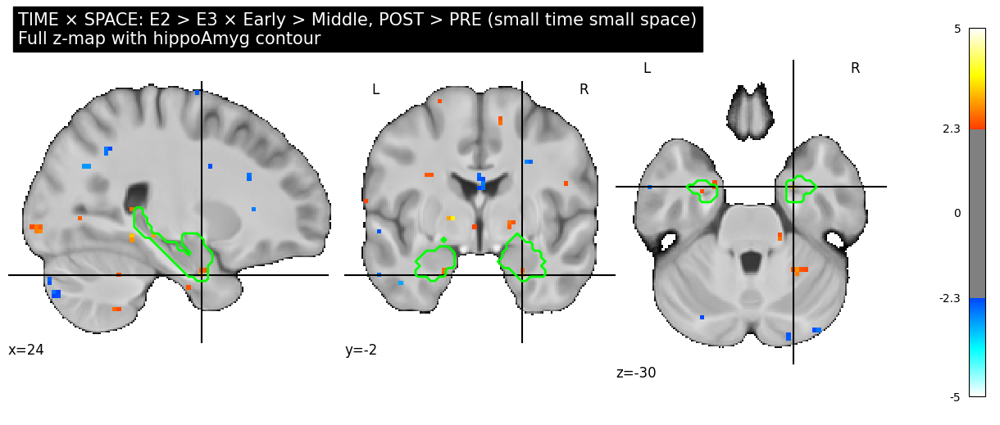

Contrast: time_e2_gt_e3_x_space_early_gt_middle_post_gt_pre
Title: TIME × SPACE: E2 > E3 × Early > Middle, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e3_x_space_early_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e3_x_space_early_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 32, 'negative_suprathreshold_voxels_inside_roi': 3, 'max_z_inside_roi': 3.212623357772827, 'min_z_inside_roi': -2.5919015407562256, 'contrast': 'time_e2_gt_e3_x_space_early_gt_middle_post_gt_pre', 'priority': '12_time_space_inter

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


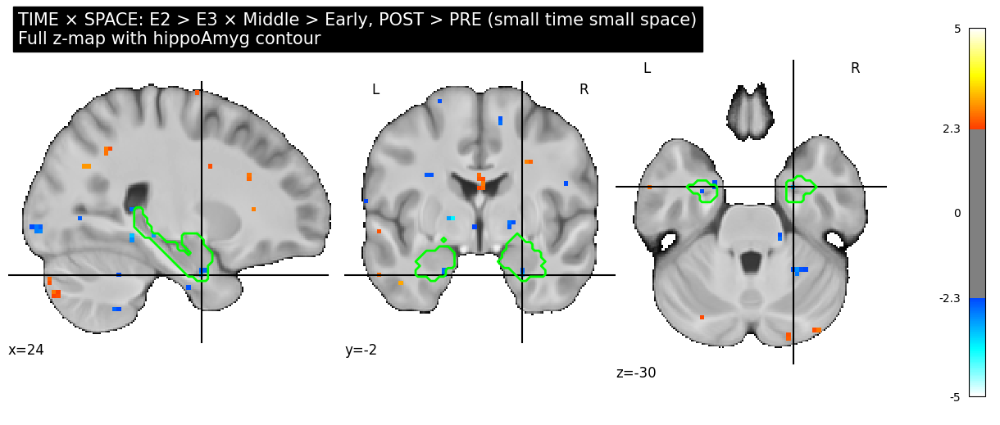

Contrast: time_e2_gt_e3_x_space_middle_gt_early_post_gt_pre
Title: TIME × SPACE: E2 > E3 × Middle > Early, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e3_x_space_middle_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e3_x_space_middle_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 3, 'negative_suprathreshold_voxels_inside_roi': 32, 'max_z_inside_roi': 2.5919015407562256, 'min_z_inside_roi': -3.212623357772827, 'contrast': 'time_e2_gt_e3_x_space_middle_gt_early_post_gt_pre', 'priority': '12_time_space_inter

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


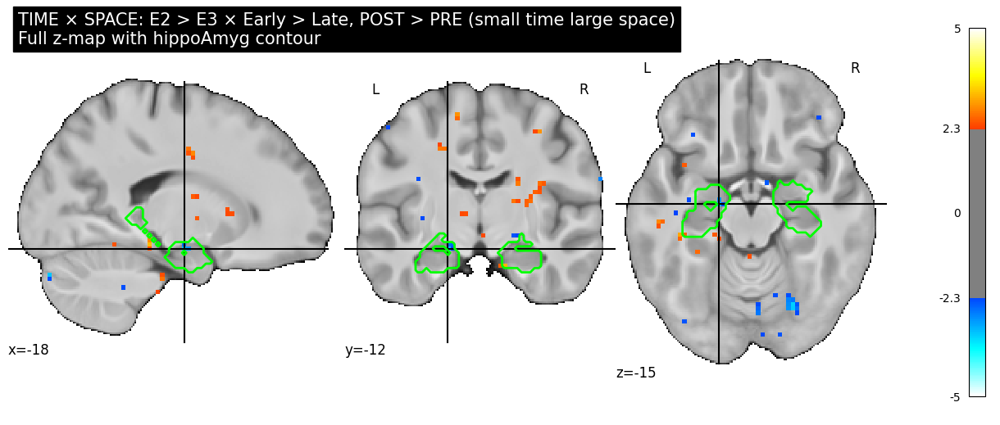

Contrast: time_e2_gt_e3_x_space_early_gt_late_post_gt_pre
Title: TIME × SPACE: E2 > E3 × Early > Late, POST > PRE (small time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e3_x_space_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e3_x_space_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 9, 'negative_suprathreshold_voxels_inside_roi': 9, 'max_z_inside_roi': 3.178417444229126, 'min_z_inside_roi': -3.288860321044922, 'contrast': 'time_e2_gt_e3_x_space_early_gt_late_post_gt_pre', 'priority': '12_time_space_interaction_small

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


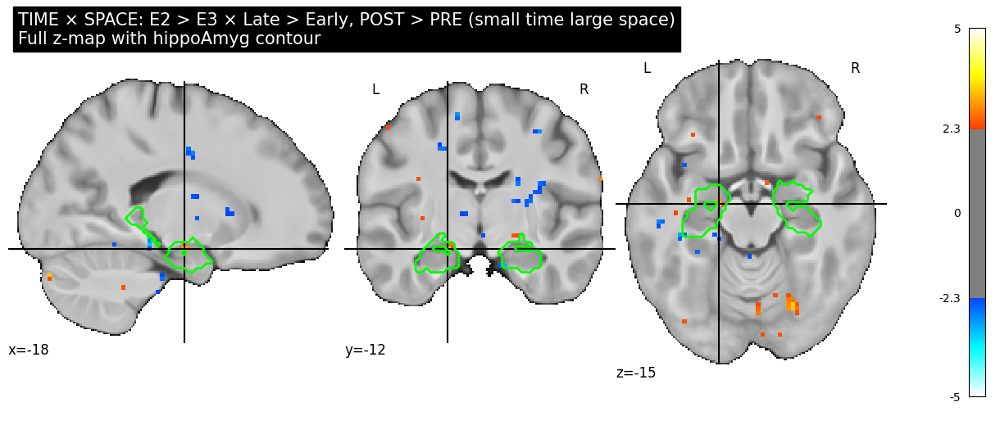

Contrast: time_e2_gt_e3_x_space_late_gt_early_post_gt_pre
Title: TIME × SPACE: E2 > E3 × Late > Early, POST > PRE (small time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e3_x_space_late_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e3_x_space_late_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 9, 'negative_suprathreshold_voxels_inside_roi': 9, 'max_z_inside_roi': 3.288860321044922, 'min_z_inside_roi': -3.178417444229126, 'contrast': 'time_e2_gt_e3_x_space_late_gt_early_post_gt_pre', 'priority': '12_time_space_interaction_small

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


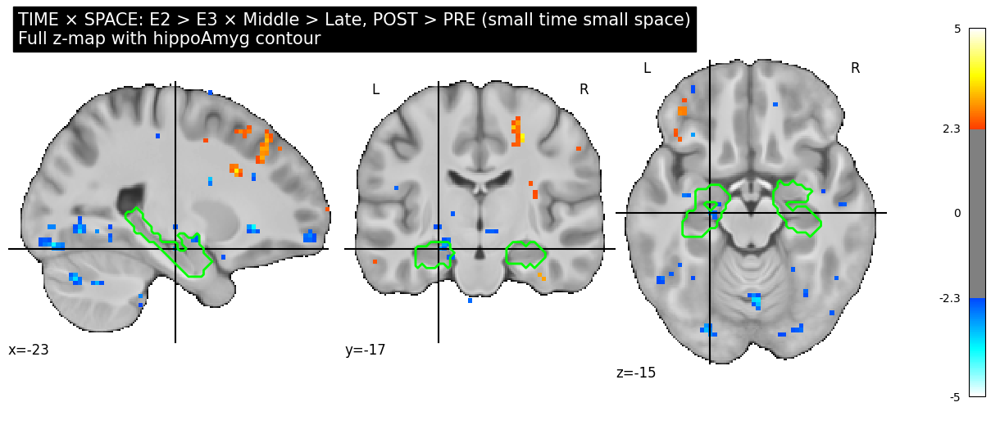

Contrast: time_e2_gt_e3_x_space_middle_gt_late_post_gt_pre
Title: TIME × SPACE: E2 > E3 × Middle > Late, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e3_x_space_middle_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e3_x_space_middle_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 2, 'negative_suprathreshold_voxels_inside_roi': 22, 'max_z_inside_roi': 2.698166847229004, 'min_z_inside_roi': -3.1057605743408203, 'contrast': 'time_e2_gt_e3_x_space_middle_gt_late_post_gt_pre', 'priority': '12_time_space_interactio

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


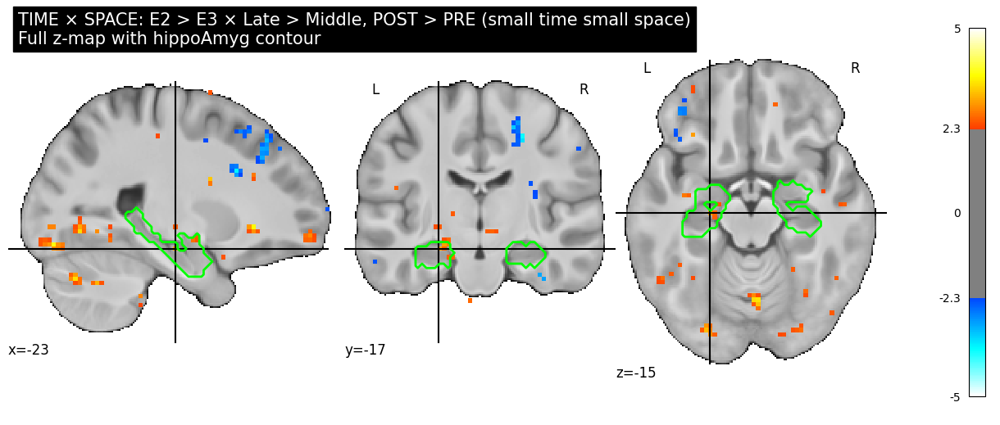

Contrast: time_e2_gt_e3_x_space_late_gt_middle_post_gt_pre
Title: TIME × SPACE: E2 > E3 × Late > Middle, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e2_gt_e3_x_space_late_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e2_gt_e3_x_space_late_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 22, 'negative_suprathreshold_voxels_inside_roi': 2, 'max_z_inside_roi': 3.1057605743408203, 'min_z_inside_roi': -2.698166847229004, 'contrast': 'time_e2_gt_e3_x_space_late_gt_middle_post_gt_pre', 'priority': '12_time_space_interactio

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


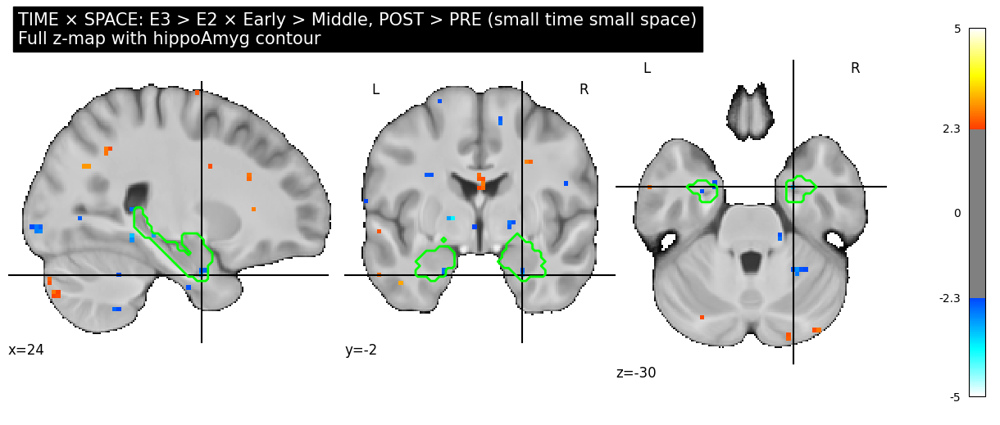

Contrast: time_e3_gt_e2_x_space_early_gt_middle_post_gt_pre
Title: TIME × SPACE: E3 > E2 × Early > Middle, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e2_x_space_early_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e2_x_space_early_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 3, 'negative_suprathreshold_voxels_inside_roi': 32, 'max_z_inside_roi': 2.5919015407562256, 'min_z_inside_roi': -3.212623357772827, 'contrast': 'time_e3_gt_e2_x_space_early_gt_middle_post_gt_pre', 'priority': '12_time_space_inter

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


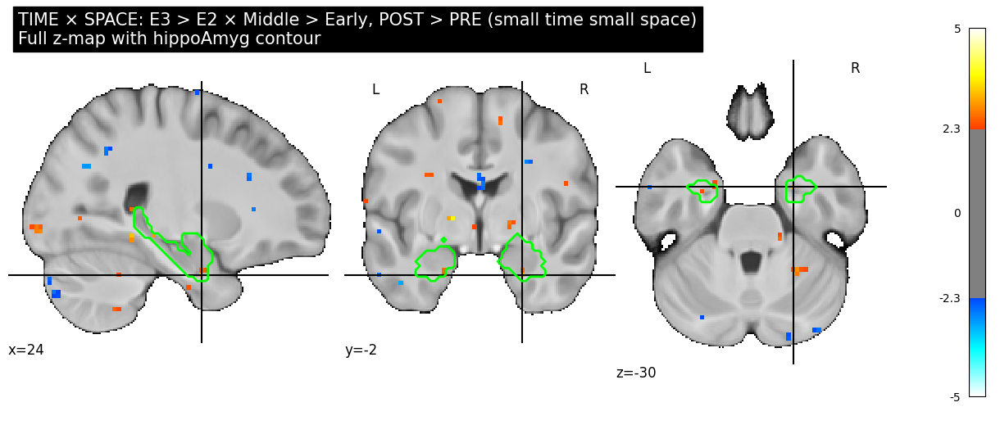

Contrast: time_e3_gt_e2_x_space_middle_gt_early_post_gt_pre
Title: TIME × SPACE: E3 > E2 × Middle > Early, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e2_x_space_middle_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e2_x_space_middle_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 32, 'negative_suprathreshold_voxels_inside_roi': 3, 'max_z_inside_roi': 3.212623357772827, 'min_z_inside_roi': -2.5919015407562256, 'contrast': 'time_e3_gt_e2_x_space_middle_gt_early_post_gt_pre', 'priority': '12_time_space_inter

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


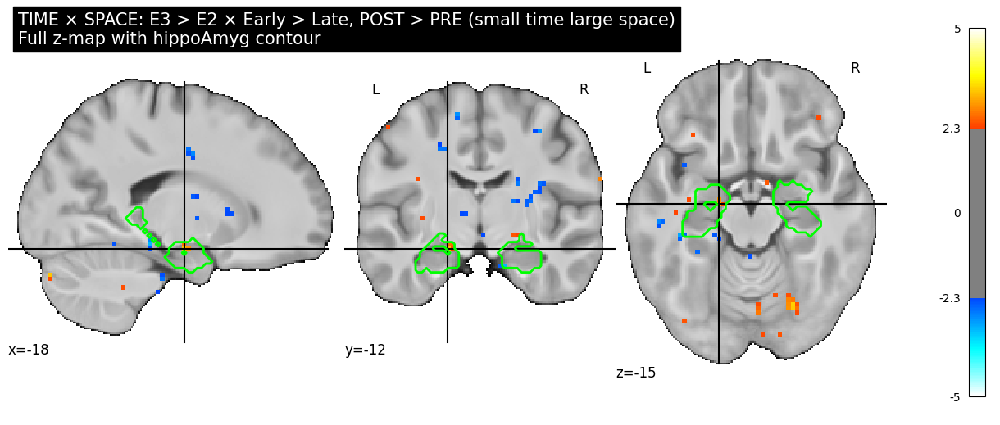

Contrast: time_e3_gt_e2_x_space_early_gt_late_post_gt_pre
Title: TIME × SPACE: E3 > E2 × Early > Late, POST > PRE (small time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e2_x_space_early_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e2_x_space_early_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 9, 'negative_suprathreshold_voxels_inside_roi': 9, 'max_z_inside_roi': 3.288860321044922, 'min_z_inside_roi': -3.178417444229126, 'contrast': 'time_e3_gt_e2_x_space_early_gt_late_post_gt_pre', 'priority': '12_time_space_interaction_small

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


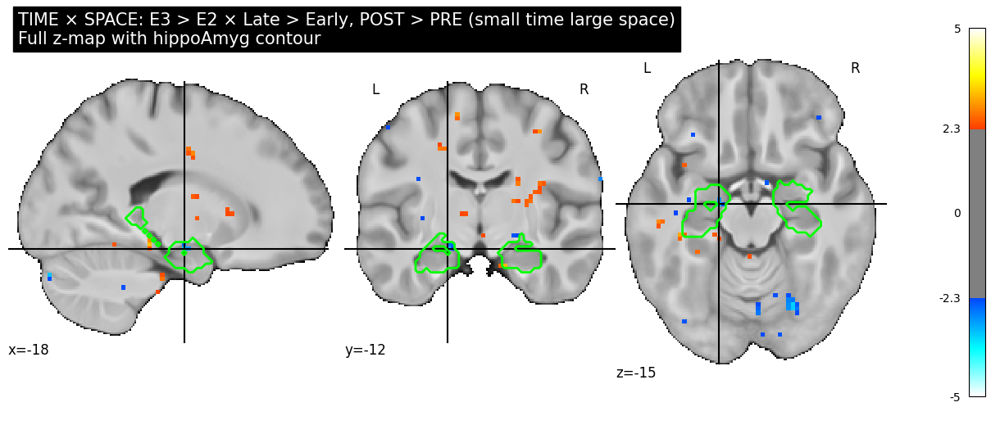

Contrast: time_e3_gt_e2_x_space_late_gt_early_post_gt_pre
Title: TIME × SPACE: E3 > E2 × Late > Early, POST > PRE (small time large space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e2_x_space_late_gt_early_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e2_x_space_late_gt_early_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 9, 'negative_suprathreshold_voxels_inside_roi': 9, 'max_z_inside_roi': 3.178417444229126, 'min_z_inside_roi': -3.288860321044922, 'contrast': 'time_e3_gt_e2_x_space_late_gt_early_post_gt_pre', 'priority': '12_time_space_interaction_small

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


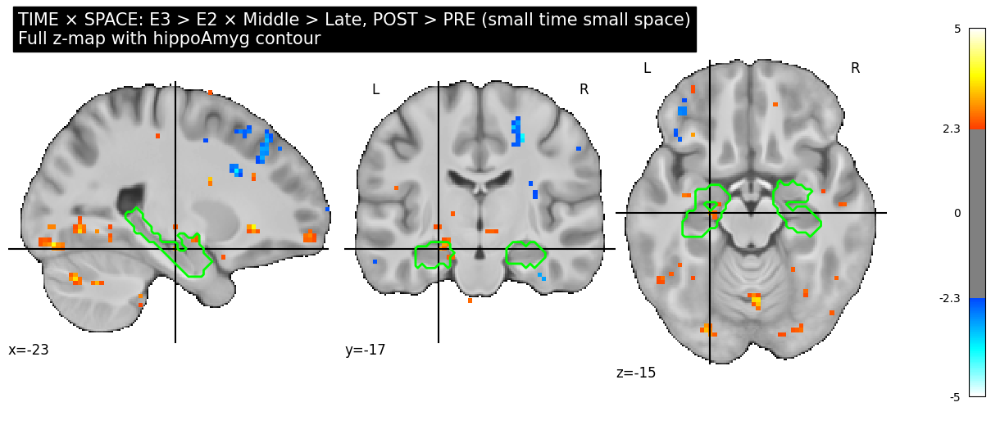

Contrast: time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre
Title: TIME × SPACE: E3 > E2 × Middle > Late, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 22, 'negative_suprathreshold_voxels_inside_roi': 2, 'max_z_inside_roi': 3.1057605743408203, 'min_z_inside_roi': -2.698166847229004, 'contrast': 'time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre', 'priority': '12_time_space_interactio

/home/kroczak/.conda/envs/island/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:868: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


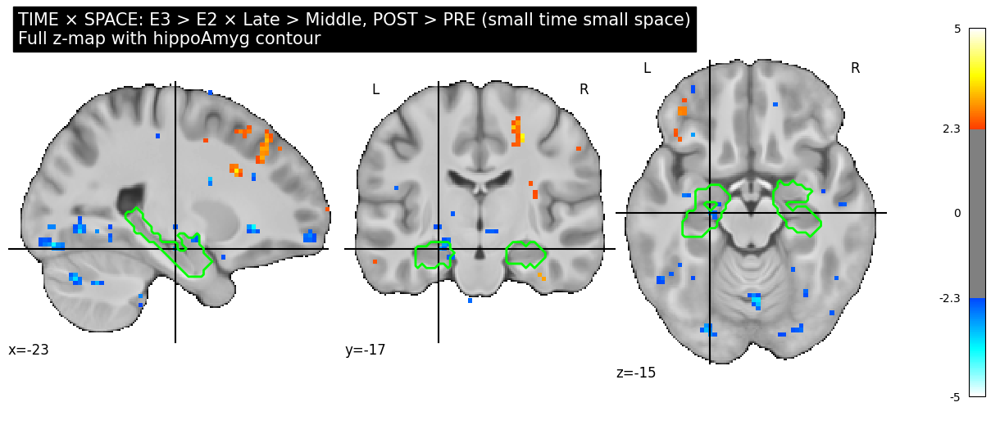

Contrast: time_e3_gt_e2_x_space_late_gt_middle_post_gt_pre
Title: TIME × SPACE: E3 > E2 × Late > Middle, POST > PRE (small time small space)
Saved ROI-masked interactive HTML: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/interactive_views/roi_masked_views/time_e3_gt_e2_x_space_late_gt_middle_post_gt_pre_hippoAmyg_masked_interactive.html
Saved contour overlay PNG: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/roi_mask_overlays/time_e3_gt_e2_x_space_late_gt_middle_post_gt_pre_hippoAmyg_contour_overlay.png
ROI stats: {'roi_voxels': 1544, 'positive_suprathreshold_voxels_inside_roi': 2, 'negative_suprathreshold_voxels_inside_roi': 22, 'max_z_inside_roi': 2.698166847229004, 'min_z_inside_roi': -3.1057605743408203, 'contrast': 'time_e3_gt_e2_x_space_late_gt_middle_post_gt_pre', 'priority': '12_time_space_interactio

,roi_voxels,positive_suprathreshold_voxels_inside_roi,negative_suprathreshold_voxels_inside_roi,max_z_inside_roi,min_z_inside_roi,contrast,priority,display_title,z_map_path,roi_masked_z_map_path
38,1544,32,3,3.212623,-2.591902,time_e3_gt_e2_x_space_middle_gt_early_post_gt_pre,12_time_space_interaction_small_time_small_space,"TIME × SPACE: E3 > E2 × Middle > Early, POST > PRE (small time small space)",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e3_gt_e2_x_space_middle_gt_early_post_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/roi_overlap/time_e3_gt_e2_x_space_middle_gt_early_post_gt_pre_hippoAmyg_maske...
31,1544,32,3,3.212623,-2.591902,time_e2_gt_e3_x_space_early_gt_middle_post_gt_pre,12_time_space_interaction_small_time_small_space,"TIME × SPACE: E2 > E3 × Early > Middle, POST > PRE (small time small space)",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e2_gt_e3_x_space_early_gt_middle_post_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/roi_overlap/time_e2_gt_e3_x_space_early_gt_middle_post_gt_pre_hippoAmyg_maske...
24,1544,31,7,3.373218,-3.197575,time_e1_gt_e3_x_space_late_gt_middle_post_gt_pre,12_time_space_interaction_large_time_small_space,"TIME × SPACE: E1 > E3 × Late > Middle, POST > PRE (large time small space)",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e1_gt_e3_x_space_late_gt_middle_post_g...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/roi_overlap/time_e1_gt_e3_x_space_late_gt_middle_post_gt_pre_hippoAmyg_masked...
29,1544,31,7,3.373218,-3.197575,time_e3_gt_e1_x_space_middle_gt_late_post_gt_pre,12_time_space_interaction_large_time_small_space,"TIME × SPACE: E3 > E1 × Middle > Late, POST > PRE (large time small space)",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e3_gt_e1_x_space_middle_gt_late_post_g...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/roi_overlap/time_e3_gt_e1_x_space_middle_gt_late_post_gt_pre_hippoAmyg_masked...
8,1544,25,9,3.606964,-2.936601,time_e1_gt_e2_x_space_middle_gt_early_post_gt_pre,12_time_space_interaction_small_time_small_space,"TIME × SPACE: E1 > E2 × Middle > Early, POST > PRE (small time small space)",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e1_gt_e2_x_space_middle_gt_early_post_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/roi_overlap/time_e1_gt_e2_x_space_middle_gt_early_post_gt_pre_hippoAmyg_maske...
13,1544,25,9,3.606964,-2.936601,time_e2_gt_e1_x_space_early_gt_middle_post_gt_pre,12_time_space_interaction_small_time_small_space,"TIME × SPACE: E2 > E1 × Early > Middle, POST > PRE (small time small space)",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e2_gt_e1_x_space_early_gt_middle_post_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tabl

Saved ROI overlap table:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/roi_overlap/pre_post_time_x_encoding_space_interaction_glm_hippoAmyg_overlap_stats_zgt2.33.csv


In [13]:
# ============================================================
# 13. ROI visualization: hippocampus/amygdala mask overlays
# ============================================================

import nibabel as nib
from nilearn.image import resample_to_img, math_img, mean_img
from nilearn.plotting import plot_stat_map, view_img

ROI_NAME = "hippoAmyg"
ROI_ROOT = paths.data_dir / "rois" / "hippoAmyg_02022024"

ROI_THRESHOLD = 0.50
STAT_THRESHOLD = 2.33
VMAX = 5.0

roi_fig_dir = dirs["figures"] / "roi_mask_overlays"
roi_fig_dir.mkdir(parents=True, exist_ok=True)

roi_html_dir = dirs["interactive"] / "roi_masked_views"
roi_html_dir.mkdir(parents=True, exist_ok=True)

roi_table_dir = dirs["tables"] / "roi_overlap"
roi_table_dir.mkdir(parents=True, exist_ok=True)

print("ROI root:", ROI_ROOT)
print("Saving ROI figures to:", roi_fig_dir)
print("Saving ROI interactive views to:", roi_html_dir)

roi_imgs = []
missing_roi_rows = []

for subject in subjects:
    left_mask = (
        ROI_ROOT / subject / "ses-01" / "anat" /
        f"{subject}_ses-01_space-MNI152NLin2009cAsym_hemi-L_label-hippoAmyg.nii.gz"
    )
    right_mask = (
        ROI_ROOT / subject / "ses-01" / "anat" /
        f"{subject}_ses-01_space-MNI152NLin2009cAsym_hemi-R_label-hippoAmyg.nii.gz"
    )

    if left_mask.exists():
        roi_imgs.append(load_img(str(left_mask)))
    else:
        missing_roi_rows.append({"subject": subject, "hemi": "L", "missing_mask_path": str(left_mask)})

    if right_mask.exists():
        roi_imgs.append(load_img(str(right_mask)))
    else:
        missing_roi_rows.append({"subject": subject, "hemi": "R", "missing_mask_path": str(right_mask)})

print(f"Loaded {len(roi_imgs)} unilateral ROI masks.")

if missing_roi_rows:
    display(pd.DataFrame(missing_roi_rows))

assert len(roi_imgs) > 0, "No ROI masks found. Check ROI_ROOT."

roi_mean_img = mean_img(roi_imgs)
roi_group_mask_img = math_img(f"img >= {ROI_THRESHOLD}", img=roi_mean_img)

roi_group_mask_path = roi_table_dir / f"group_consensus_{ROI_NAME}_threshold-{ROI_THRESHOLD:.2f}_mask.nii.gz"
roi_group_mask_img.to_filename(str(roi_group_mask_path))

print("Saved group consensus ROI mask:")
print(roi_group_mask_path)


def compute_roi_overlap_stats(z_img, roi_mask_img, threshold=2.33):
    roi_resampled = resample_to_img(
        roi_mask_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    z_data = z_img.get_fdata()
    roi_data = roi_resampled.get_fdata() > 0

    pos_supra = z_data > threshold
    neg_supra = z_data < -threshold

    pos_inside = pos_supra & roi_data
    neg_inside = neg_supra & roi_data

    if roi_data.sum() == 0:
        max_z_inside = np.nan
        min_z_inside = np.nan
    else:
        max_z_inside = float(np.nanmax(np.where(roi_data, z_data, np.nan)))
        min_z_inside = float(np.nanmin(np.where(roi_data, z_data, np.nan)))

    return {
        "roi_voxels": int(roi_data.sum()),
        "positive_suprathreshold_voxels_inside_roi": int(pos_inside.sum()),
        "negative_suprathreshold_voxels_inside_roi": int(neg_inside.sum()),
        "max_z_inside_roi": max_z_inside,
        "min_z_inside_roi": min_z_inside,
    }


roi_overlap_rows = []
second_level_by_contrast = second_level_table.set_index("contrast")

for contrast_name in main_contrasts:
    if contrast_name not in second_level_by_contrast.index:
        print("Skipping missing contrast:", contrast_name)
        continue

    row = second_level_by_contrast.loc[contrast_name]
    z_map_path = Path(row["z_map_path"])
    z_img = load_img(str(z_map_path))

    roi_resampled = resample_to_img(
        roi_group_mask_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    z_roi_img = math_img("z * (roi > 0)", z=z_img, roi=roi_resampled)

    z_roi_path = roi_table_dir / f"{contrast_name}_{ROI_NAME}_masked_zmap.nii.gz"
    z_roi_img.to_filename(str(z_roi_path))

    stats = compute_roi_overlap_stats(
        z_img=z_img,
        roi_mask_img=roi_group_mask_img,
        threshold=STAT_THRESHOLD,
    )

    stats["contrast"] = contrast_name
    stats["priority"] = contrast_specs[contrast_name].get("priority", "") if contrast_name in contrast_specs else ""
    stats["display_title"] = plot_title_map.get(contrast_name, contrast_name)
    stats["z_map_path"] = str(z_map_path)
    stats["roi_masked_z_map_path"] = str(z_roi_path)
    roi_overlap_rows.append(stats)

    html_path = roi_html_dir / f"{contrast_name}_{ROI_NAME}_masked_interactive.html"

    view = view_img(
        z_roi_img,
        bg_img=mean_t1w_img if USE_MEAN_T1W_BACKGROUND else None,
        threshold=STAT_THRESHOLD,
        vmax=VMAX,
        cmap="cold_hot",
        title=(
            f"{plot_title_map.get(contrast_name, contrast_name)} — "
            f"activity inside {ROI_NAME} ROI"
        ),
    )
    view.save_as_html(str(html_path))

    z_roi_data = z_roi_img.get_fdata()

    if np.any(np.abs(z_roi_data) > STAT_THRESHOLD):
        max_idx = np.unravel_index(np.nanargmax(np.abs(z_roi_data)), z_roi_data.shape)
        cut_coords = nib.affines.apply_affine(z_roi_img.affine, max_idx)
    else:
        cut_coords = (-28, -24, -14)

    fig = plt.figure(figsize=(12, 5))

    display_obj = plot_stat_map(
        z_img,
        bg_img=mean_t1w_img if USE_MEAN_T1W_BACKGROUND else None,
        threshold=STAT_THRESHOLD,
        vmax=VMAX,
        cmap="cold_hot",
        display_mode="ortho",
        cut_coords=cut_coords,
        black_bg=False,
        title=(
            f"{plot_title_map.get(contrast_name, contrast_name)}\n"
            f"Full z-map with {ROI_NAME} contour"
        ),
        figure=fig,
        dim=-0.2,
    )

    display_obj.add_contours(
        roi_resampled,
        levels=[0.5],
        colors="lime",
        linewidths=2.0,
    )

    contour_fig_path = roi_fig_dir / f"{contrast_name}_{ROI_NAME}_contour_overlay.png"
    fig.savefig(contour_fig_path, dpi=300, bbox_inches="tight")
    plt.show()

    print("=" * 80)
    print("Contrast:", contrast_name)
    print("Title:", plot_title_map.get(contrast_name, contrast_name))
    print("Saved ROI-masked interactive HTML:", html_path)
    print("Saved contour overlay PNG:", contour_fig_path)
    print("ROI stats:", stats)

roi_overlap_table = pd.DataFrame(roi_overlap_rows)
roi_overlap_table_path = roi_table_dir / f"{ANALYSIS_NAME}_{ROI_NAME}_overlap_stats_zgt{STAT_THRESHOLD:.2f}.csv"
roi_overlap_table.to_csv(roi_overlap_table_path, index=False)

display(roi_overlap_table.sort_values("positive_suprathreshold_voxels_inside_roi", ascending=False))
print("Saved ROI overlap table:")
print(roi_overlap_table_path)


## Notebook conclusion

This notebook provides the PRE/POST TIME × ENCODING-SPACE interaction analysis.

Main interpretation:

- TIME = E1/E2/E3 episode/week structure.
- SPACE = early/middle/late route-position structure.
- TIME × SPACE contrasts test whether spatial route-position effects differ by temporal episode.
- POST–PRE controls subtract image-level baseline differences already present before Island navigation.

The ROI outputs are designed to inspect whether interaction effects overlap the hippoAmyg mask and whether the pattern suggests anterior/posterior hippocampal involvement. Interpret cautiously because this is a high-dimensional exploratory model.


In [14]:
# ============================================================
# 14. Save analysis manifest
# ============================================================

analysis_manifest = {
    "notebook": "12_pre_post_time_x_encoding_space_interaction_glm.ipynb",
    "analysis_name": ANALYSIS_NAME,
    "project_root": str(PROJECT_ROOT),
    "n_subjects": len(subjects),
    "subjects": subjects,
    "smoothing_fwhm": SMOOTHING_FWHM,
    "smoothing_label": SMOOTHING_LABEL,
    "runtime_flags": {
        "RUN_FIRST_LEVEL": RUN_FIRST_LEVEL,
        "OVERWRITE_FIRST_LEVEL": OVERWRITE_FIRST_LEVEL,
        "RUN_SECOND_LEVEL": RUN_SECOND_LEVEL,
        "OVERWRITE_SECOND_LEVEL": OVERWRITE_SECOND_LEVEL,
        "USE_MEAN_T1W_BACKGROUND": USE_MEAN_T1W_BACKGROUND,
    },
    "time_definition": {
        "E1": "first encoding episode / week",
        "E2": "second encoding episode / week",
        "E3": "third encoding episode / week",
    },
    "encoding_space_definition": {
        "early": "checkpoints 1–5",
        "middle": "checkpoints 6–10",
        "late": "checkpoints 11–16",
    },
    "main_contrasts": {
        name: contrast_specs[name]
        for name in main_contrasts
        if name in contrast_specs
    },
    "key_outputs": {
        "contrast_definitions": str(contrast_table_path),
        "event_qc": str(event_qc_path),
        "first_level_qc": str(first_level_qc_path),
        "first_level_contrast_qc": str(first_level_contrast_qc_path),
        "first_level_map_qc": str(map_qc_path),
        "second_level_table": str(second_level_table_path),
        "threshold_summary": str(threshold_summary_path),
        "cluster_summary": str(cluster_summary_path),
        "cluster_details_labeled": str(cluster_details_labeled_path),
        "plot_index": str(plot_index_path) if "plot_index_path" in globals() else "",
        "interactive_index": str(interactive_index_path) if "interactive_index_path" in globals() else "",
        "roi_overlap_table": str(roi_overlap_table_path) if "roi_overlap_table_path" in globals() else "",
    },
}

manifest_dir = dirs["tables"] / "manifests"
manifest_dir.mkdir(parents=True, exist_ok=True)

analysis_manifest_path = manifest_dir / f"{ANALYSIS_NAME}_manifest.json"

with open(analysis_manifest_path, "w") as f:
    json.dump(analysis_manifest, f, indent=2)

print("Saved analysis manifest:")
print(analysis_manifest_path)


Saved analysis manifest:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/manifests/pre_post_time_x_encoding_space_interaction_glm_manifest.json


Saving literature SVC tables to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre
Saving figures to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/literature_6mm_spheres_time_x_space_post_gt_pre
Saving interactive 3D viewer to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/literature_6mm_spheres_time_x_space_post_gt_pre/interactive_3d_hippocampus

Literature centers:


,paper,roi_name,concept,x,y,z,priority
0,Deuker et al.,Deuker_temporal_right_medial_anterior_HPC,Temporal distance / close temporal relationships,26.0,-18.0,-22.0,temporal_event_map
1,Deuker et al.,Deuker_spatial_right_medial_anterior_HPC,Spatial distance / close spatial relationships,34.0,-17.0,-22.0,spatial_event_map
2,Deuker et al.,Deuker_combined_space_time_right_medial_anterior_HPC,Combined spatial and temporal proximity,32.0,-17.0,-22.0,space_time_event_map
3,Bellmund et al. 2022,Bellmund_same_sequence_left_anterior_HPC,"Constructed event-time relations, same sequence",-24.0,-13.0,-20.0,temporal_structure
4,Bellmund et al. 2022,Bellmund_interaction_right_anterior_HPC,Temporal-distance representation differs for same vs different sequences,31.0,-16.0,-21.0,temporal_structure
5,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,"Across-sequence temporal relation, exploratory",-26.0,-19.0,-15.0,temporal_structure
6,Montagrin et al.,Montagrin_current_gt_remote_left_posterior_HPC,Current > remote goals,-30.0,-31.0,-14.5,temporal_goal_structure
7,Montagrin et al.,Montagrin_remote_gt_current_left_anterior_HPC,Remote > current goals,-15.0,-8.5,-14.5,temporal_goal_structure
8,Montagrin et al.,Montagrin_remote_gt_current_right_anterior_HPC,Remote > current goals,17.5,-21.0,-14.5,temporal_goal_structure
9,Viard et al.,Viard_left_posterior_HPC_autobiographical_period,"Autobiographical memory period, left posterior hippocampus",-30.0,-26.0,-12.0,autobiographical_memory



POST > PRE contrasts found:
 - e1_early_gt_new_post_gt_pre
 - e1_middle_gt_new_post_gt_pre
 - e1_late_gt_new_post_gt_pre
 - e2_early_gt_new_post_gt_pre
 - e2_middle_gt_new_post_gt_pre
 - e2_late_gt_new_post_gt_pre
 - e3_early_gt_new_post_gt_pre
 - e3_middle_gt_new_post_gt_pre
 - e3_late_gt_new_post_gt_pre
 - time_space_old_gt_new_post_gt_pre
 - e1_early_gt_middle_post_gt_pre
 - e1_middle_gt_early_post_gt_pre
 - e1_early_gt_late_post_gt_pre
 - e1_late_gt_early_post_gt_pre
 - e1_middle_gt_late_post_gt_pre
 - e1_late_gt_middle_post_gt_pre
 - e2_early_gt_middle_post_gt_pre
 - e2_middle_gt_early_post_gt_pre
 - e2_early_gt_late_post_gt_pre
 - e2_late_gt_early_post_gt_pre
 - e2_middle_gt_late_post_gt_pre
 - e2_late_gt_middle_post_gt_pre
 - e3_early_gt_middle_post_gt_pre
 - e3_middle_gt_early_post_gt_pre
 - e3_early_gt_late_post_gt_pre
 - e3_late_gt_early_post_gt_pre
 - e3_middle_gt_late_post_gt_pre
 - e3_late_gt_middle_post_gt_pre
 - early_e1_gt_e2_post_gt_pre
 - early_e2_gt_e1_post_gt_pre
 

,n_voxels_in_sphere,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_distance_from_literature_center_mm,peak_p_uncorrected,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,n_voxels_p_unc_lt_0_001,n_voxels_fdr_q_lt_0_05,paper,literature_roi,concept,priority,contrast,contrast_label,sphere_center_x,sphere_center_y,sphere_center_z,sphere_radius_mm,sphere_mask_path,z_map_path,peak_hemisphere,peak_long_axis
0,61,14.0,-42.0,4.5,3.694535,4.716991,0.000110,0.006719,0.006719,1,1,Viard et al.,Viard_right_posterior_HPC_autobiographical_period_secondary,"Autobiographical memory period, right posterior hippocampus secondary",autobiographical_memory,e3_early_gt_middle_post_gt_pre,"E3 Early > middle, POST > PRE",14.0,-38.0,2.0,6.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/Viard_right_posterior_HPC_aut...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e3_early_gt_middle_post_gt_pre_smoothed5mm_...,right,posterior
1,57,26.5,-19.5,-25.5,3.592726,3.840573,0.000164,0.009326,0.007512,3,6,Deuker et al.,Deuker_temporal_right_medial_anterior_HPC,Temporal distance / close temporal relationships,temporal_event_map,late_e1_gt_e2_post_gt_pre,"Late E1 > e2, POST > PRE",26.0,-18.0,-22.0,6.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/Deuker_temporal_right_medial_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_late_e1_gt_e2_post_gt_pre_smoothed5mm_zmap....,right,anterior
2,61,-23.5,-17.0,-18.0,3.469893,4.387482,0.000260,0.015880,0.009641,3,3,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,"Across-sequence temporal relation, exploratory",temporal_structure,middle_e3_gt_e2_post_gt_pre,"Middle E3 > e2, POST > PRE",-26.0,-19.0,-15.0,6.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/Bellmund_across_sequence_left...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_middle_e3_gt_e2_post_gt_pre_smoothed5mm_zma...,left,anterior
3,55,36.5,-34.5,-8.0,3.495242,4.743416,0.000237,0.013025,0.013025,1,1,Viard et al.,Viard_right_posterior_HPC_autobiographical_period,"Autobiographical memory period, right posterior hippocampus",autobiographical_memory,e3_early_gt_late_post_gt_pre,"E3 Early > late, POST > PRE",34.0,-38.0,-6.0,6.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/Viard_right_posterior_HPC_aut...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e3_early_gt_late_post_gt_pre_smoothed5mm_zm...,right,posterior
4,56,-23.5,-17.0,-18.0,3.469893,4.500000,0.000260,0.014579,0.014579,2,3,Bellmund et al. 2022,Bellmund_same_sequence_left_anterior_HPC,"Constructed event-time relations, same sequence",temporal_structure,middle_e3_gt_e2_post_gt_pre,"Middle E3 > e2, POST > PRE",-24.0,-13.0,-20.0,6.0,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/Bellmund_same_sequence_left_a...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pr


TABLE 1 — POST > PRE effects close to current literature peaks


,Contrast,Peak,Region,z,qFDR sphere,pBonf sphere,Literature match,Papers,Concepts,Min dist. mm,Use
0,"E3 Early > middle, POST > PRE","(14, -42, 4)",right posterior hippocampus,3.69,.007,.007,Viard R posterior HPC secondary,Viard et al.,"Autobiographical memory period, right posterior hippocampus secondary",4.7,FDR-supported
1,"Late E1 > e2, POST > PRE","(26, -20, -26)",right anterior hippocampus,3.59,.008,.009,Deuker temporal R anterior HPC,Deuker et al.,Temporal distance / close temporal relationships,3.8,FDR-supported
2,"E3 Early > late, POST > PRE","(36, -34, -8)",right posterior hippocampus,3.50,.013,.013,Viard R posterior HPC,Viard et al.,"Autobiographical memory period, right posterior hippocampus",4.7,FDR-supported
3,"Middle E3 > e2, POST > PRE","(-24, -17, -18)",left anterior hippocampus,3.47,.010–.015,.015–.016,Bellmund across-sequence L anterior HPC; Bellmund same-sequence L anterior HPC,Bellmund et al. 2022,"Across-sequence temporal relation, exploratory; Constructed event-time relations, same sequence",4.4,FDR-supported
4,"E3 Middle > new, POST > PRE","(-14, -10, -10)",left anterior hippocampus,3.43,.017,.017,Montagrin L anterior HPC,Montagrin et al.,Remote > current goals,4.4,FDR-supported
5,"E1 Late > new, POST > PRE","(24, -20, -26)",right anterior hippocampus,3.31,.026,.026,Deuker temporal R anterior HPC,Deuker et al.,Temporal distance / close temporal relationships,4.3,FDR-supported
6,"time E2 > E3 × space Late > early, POST > PRE","(-18, -12, -16)",left anterior hippocampus,3.29,.028,.028,Montagrin L anterior HPC,Montagrin et al.,Remote > current goals,5.0,FDR-supported
7,"time E3 > E2 × space Early > late, POST > PRE","(-18, -12, -16)",left anterior hippocampus,3.29,.028,.028,Montagrin L anterior HPC,Montagrin et al.,Remote > current goals,5.0,FDR-supported
8,"E2 Early > late, POST > PRE","(14, -40, 7)",right posterior hippocampus,3.27,.033,.033,Viard R posterior HPC secondary,Viard et al.,"Autobiographical memory period, right posterior hippocampus secondary",5.2,FDR-supported
9,"Late E1 > e3, POST > PRE","(-18, -10, -18)",left anterior hippocampus,3.26,.031,.031,Montagrin L anterior HPC,Montagrin et al.,Remote > current goals,5.0,FDR-supported


Saved:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/pre_post_time_x_encoding_space_interaction_glm_POST_GT_PRE_literature_close_exploratory_summary.csv


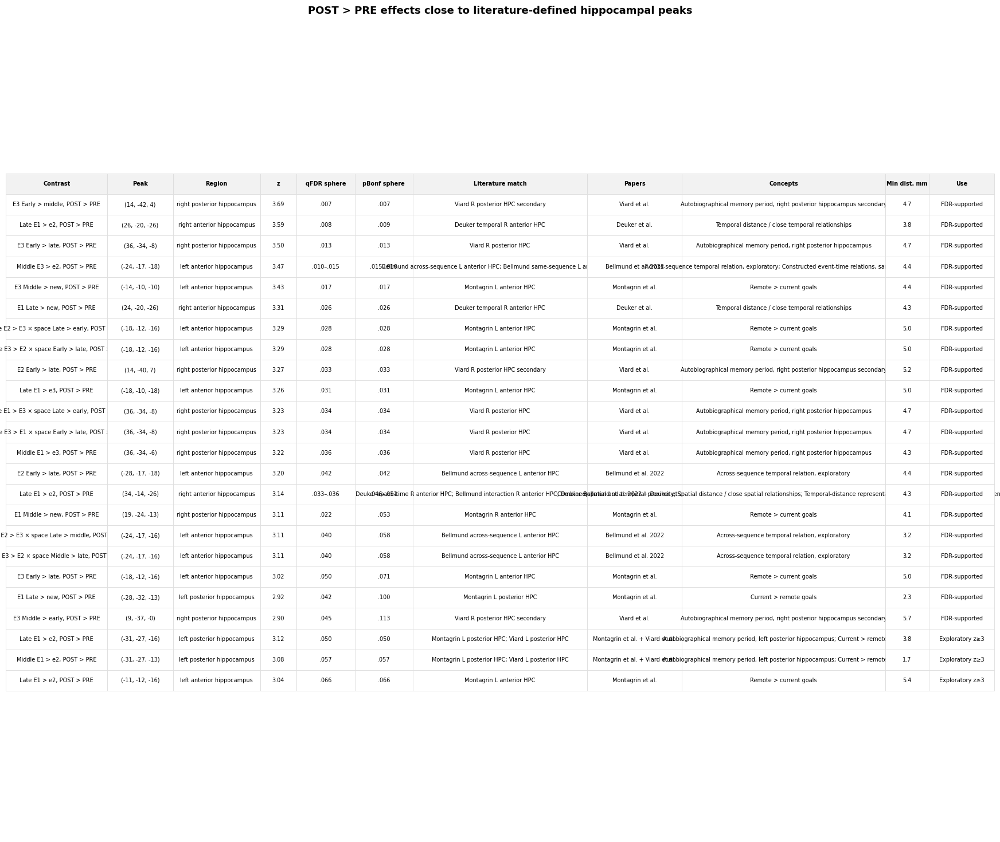

Saved table PNG:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/literature_6mm_spheres_time_x_space_post_gt_pre/pre_post_time_x_encoding_space_interaction_glm_POST_GT_PRE_literature_close_exploratory_summary.png

Extracting whole-brain peaks for e1_early_gt_new_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e1_early_gt_new_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for e1_middle_gt_new_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e1_middle_gt_new_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for e1_late_gt_new_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kro

/tmp/ipykernel_3841402/3047986735.py:749: UserWarning: No clusters found with stat higher than 3.0
  clusters = get_clusters_table(



Extracting whole-brain peaks for e2_middle_gt_late_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e2_middle_gt_late_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for e2_late_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e2_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for e3_early_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_e3_early_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for e3_middle_gt_early_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_islan

/tmp/ipykernel_3841402/3047986735.py:749: UserWarning: No clusters found with stat higher than 3.0
  clusters = get_clusters_table(


No clusters found.

Extracting whole-brain peaks for time_e1_gt_e3_x_space_middle_gt_late_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e1_gt_e3_x_space_middle_gt_late_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for time_e1_gt_e3_x_space_late_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e1_gt_e3_x_space_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for time_e3_gt_e1_x_space_early_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e3_gt_e1_x_space_early_gt_middle_post_gt

/tmp/ipykernel_3841402/3047986735.py:749: UserWarning: No clusters found with stat higher than 3.0
  clusters = get_clusters_table(



Extracting whole-brain peaks for time_e3_gt_e1_x_space_middle_gt_late_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e3_gt_e1_x_space_middle_gt_late_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for time_e3_gt_e1_x_space_late_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e3_gt_e1_x_space_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz

Extracting whole-brain peaks for time_e2_gt_e3_x_space_early_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e2_gt_e3_x_space_early_gt_middle_post_gt_pre_smoothed5mm_zm

,contrast,Contrast,Peak,x,y,z_coord,Peak z,Cluster size,Hemisphere,HPC axis heuristic,Nearest literature sphere,Nearest paper,Nearest center,Distance to nearest literature center mm,Close to current literature?
0,e1_early_gt_new_post_gt_pre,"E1 Early > new, POST > PRE","(39, -74, 4)",39.0,-74.5,4.5,4.587500,593,right,posterior,Viard R posterior HPC,Viard et al.,"(34, -38, -6)",38.307963,False
1,e1_early_gt_new_post_gt_pre,"E1 Early > new, POST > PRE","(32, -77, 2)",31.5,-77.0,2.0,3.759169,,right,posterior,Viard R posterior HPC,Viard et al.,"(34, -38, -6)",39.890475,False
2,e1_early_gt_new_post_gt_pre,"E1 Early > new, POST > PRE","(32, -70, 7)",31.5,-69.5,7.0,3.500554,,right,posterior,Viard R posterior HPC,Viard et al.,"(34, -38, -6)",34.168699,False
3,e1_early_gt_new_post_gt_pre,"E1 Early > new, POST > PRE","(14, -22, 72)",14.0,-22.0,72.0,4.496698,125,right,posterior,Viard R posterior HPC secondary,Viard et al.,"(14, -38, 2)",71.805292,False
4,e1_early_gt_new_post_gt_pre,"E1 Early > new, POST > PRE","(14, 48, -8)",14.0,48.0,-8.0,4.179354,171,right,anterior,Montagrin L anterior HPC,Montagrin et al.,"(-15, -8, -14)",63.839643,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
338,time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre,"time E3 > E2 × space Middle > late, POST > PRE","(-26, -72, -3)",-26.0,-72.0,-3.0,3.722857,78,left,posterior,Montagrin L posterior HPC,Montagrin et al.,"(-30, -31, -14)",42.769732,False
339,time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre,"time E3 > E2 × space Middle > late, POST > PRE","(12, -2, -10)",11.5,-2.0,-10.5,3.720952,140,right,anterior,Montagrin R anterior HPC,Montagrin et al.,"(18, -21, -14)",20.322401,False
340,time_e3_gt_e2_x_space_late_gt_middle_post_gt_pre,"time E3 > E2 × space Late > middle, POST > PRE","(-26, 33, 42)",-26.0,33.0,42.0,3.800198,171.0,left,anterior,Montagrin L anterior HPC,Montagrin et al.,"(-15, -8, -14)",70.961257,False
341,time_e3_gt_e2_x_space_late_gt_middle_post_gt_pre,"time E3 > E2 × space Late > middle, POST > PRE","(19, -42, 32)",19.0,-42.0,32.0,3.464478,109.0,right,posterior,Viard R posterior HPC secondary,Viard et al.,"(14, -38, 2)",30.675723,False


Saved all whole-brain peaks:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/pre_post_time_x_encoding_space_interaction_glm_POST_GT_PRE_wholebrain_peaks_z3.00_ALL.csv

TABLE 2 — Strong POST > PRE MTL-ish peaks not close to current literature peaks


,Contrast,Peak,Peak z,Cluster size,Hemisphere,HPC axis heuristic,Nearest literature sphere,Nearest paper,Nearest center,Distance to nearest literature center mm
0,"E1 Late > middle, POST > PRE","(4, -20, -0)",5.27,312.0,right,anterior,Montagrin R anterior HPC,Montagrin et al.,"(18, -21, -14)",19.5
1,"E2 Early > middle, POST > PRE","(34, 3, -36)",4.60,125.0,right,anterior,Bellmund interaction R anterior HPC,Bellmund et al. 2022,"(31, -16, -21)",24.1
2,"E3 Middle > early, POST > PRE","(-6, -32, -38)",4.48,109.0,left,posterior,Bellmund same-sequence L anterior HPC,Bellmund et al. 2022,"(-24, -13, -20)",31.8
3,"time E1 > E3 × space Early > middle, POST > PRE","(26, -27, -26)",4.42,171.0,right,posterior,Deuker temporal R anterior HPC,Deuker et al.,"(26, -18, -22)",9.7
4,"time E3 > E1 × space Middle > early, POST > PRE","(26, -27, -26)",4.42,171.0,right,posterior,Deuker temporal R anterior HPC,Deuker et al.,"(26, -18, -22)",9.7
...,...,...,...,...,...,...,...,...,...,...
57,"E1 Early > middle, POST > PRE","(4, -50, -30)",3.34,78.0,right,posterior,Montagrin R anterior HPC,Montagrin et al.,"(18, -21, -14)",35.4
58,"E1 Late > new, POST > PRE","(-31, -32, -28)",3.31,78,left,posterior,Montagrin L posterior HPC,Montagrin et al.,"(-30, -31, -14)",13.6
59,"E1 Early > middle, POST > PRE","(2, -20, -3)",3.30,78.0,midline,anterior,Montagrin R anterior HPC,Montagrin et al.,"(18, -21, -14)",19.8
60,"time E1 > E3 × space Early > middle, POST > PRE","(-4, -20, -3)",3.27,78.0,left,anterior,Montagrin L anterior HPC,Montagrin et al.,"(-15, -8, -14)",19.6


Saved:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/pre_post_time_x_encoding_space_interaction_glm_POST_GT_PRE_MTL_unmatched_candidate_peaks.csv


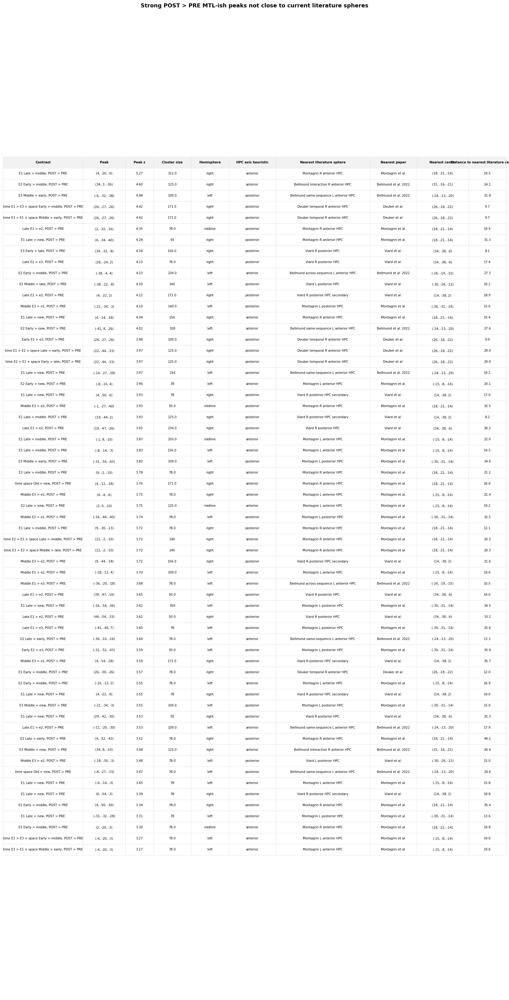

Saved table PNG:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/literature_6mm_spheres_time_x_space_post_gt_pre/pre_post_time_x_encoding_space_interaction_glm_POST_GT_PRE_MTL_unmatched_candidate_peaks.png

Observed points for interactive 3D:


,source,Contrast,Peak,x,y,z,Peak z,Hemisphere,Axis,Support,Papers,Use
0,literature-matched,"E3 Early > middle, POST > PRE","(14, -42, 4)",14.0,-42.0,4.0,3.690000,right,posterior,Viard R posterior HPC secondary,Viard et al.,FDR-supported
1,literature-matched,"Late E1 > e2, POST > PRE","(26, -20, -26)",26.0,-20.0,-26.0,3.590000,right,anterior,Deuker temporal R anterior HPC,Deuker et al.,FDR-supported
2,literature-matched,"E3 Early > late, POST > PRE","(36, -34, -8)",36.0,-34.0,-8.0,3.500000,right,posterior,Viard R posterior HPC,Viard et al.,FDR-supported
3,literature-matched,"Middle E3 > e2, POST > PRE","(-24, -17, -18)",-24.0,-17.0,-18.0,3.470000,left,anterior,Bellmund across-sequence L anterior HPC; Bellmund same-sequence L anterior HPC,Bellmund et al. 2022,FDR-supported
4,literature-matched,"E3 Middle > new, POST > PRE","(-14, -10, -10)",-14.0,-10.0,-10.0,3.430000,left,anterior,Montagrin L anterior HPC,Montagrin et al.,FDR-supported
...,...,...,...,...,...,...,...,...,...,...,...,...
78,exploratory-unmatched,"time space Old > new, POST > PRE","(-8, -27, -33)",-8.5,-27.0,-33.0,3.467457,left,posterior,Nearest current literature center: Bellmund same-sequence L anterior HPC (24.6 mm),new literature search needed,Exploratory unmatched
79,exploratory-unmatched,"E1 Late > new, POST > PRE","(-6, -14, -3)",-6.0,-14.5,-3.0,3.452537,left,anterior,Nearest current literature center: Montagrin L anterior HPC (15.8 mm),new literature search needed,Exploratory unmatched
80,exploratory-unmatched,"E1 Late > new, POST > PRE","(6, -54, -3)",6.5,-54.5,-3.0,3.390582,right,posterior,Nearest current literature center: Viard R posterior HPC secondary (18.8 mm),new literature search needed,Exploratory unmatched
81,exploratory-unmatched,"E1 Early > middle, POST > PRE","(4, -50, -30)",4.0,-49.5,-30.5,3.338435,right,posterior,Nearest current literature center: Montagrin R anterior HPC (35.4 mm),new literature search needed,Exploratory unmatched


Saved:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/interactive_3d_hippocampus/pre_post_time_x_encoding_space_interaction_glm_POST_GT_PRE_observed_points_for_3D.csv
Left hippocampus/MTL cloud: (0, 3)
Right hippocampus/MTL cloud: (0, 3)

Observed interactive points:


,source,Contrast,Peak,x,y,z,Peak z,Hemisphere,Axis,Support,Papers,Use
0,literature-matched,"E3 Early > middle, POST > PRE","(14, -42, 4)",14.0,-42.0,4.0,3.690000,right,posterior,Viard R posterior HPC secondary,Viard et al.,FDR-supported
1,literature-matched,"Late E1 > e2, POST > PRE","(26, -20, -26)",26.0,-20.0,-26.0,3.590000,right,anterior,Deuker temporal R anterior HPC,Deuker et al.,FDR-supported
2,literature-matched,"E3 Early > late, POST > PRE","(36, -34, -8)",36.0,-34.0,-8.0,3.500000,right,posterior,Viard R posterior HPC,Viard et al.,FDR-supported
3,literature-matched,"Middle E3 > e2, POST > PRE","(-24, -17, -18)",-24.0,-17.0,-18.0,3.470000,left,anterior,Bellmund across-sequence L anterior HPC; Bellmund same-sequence L anterior HPC,Bellmund et al. 2022,FDR-supported
4,literature-matched,"E3 Middle > new, POST > PRE","(-14, -10, -10)",-14.0,-10.0,-10.0,3.430000,left,anterior,Montagrin L anterior HPC,Montagrin et al.,FDR-supported
...,...,...,...,...,...,...,...,...,...,...,...,...
78,exploratory-unmatched,"time space Old > new, POST > PRE","(-8, -27, -33)",-8.5,-27.0,-33.0,3.467457,left,posterior,Nearest current literature center: Bellmund same-sequence L anterior HPC (24.6 mm),new literature search needed,Exploratory unmatched
79,exploratory-unmatched,"E1 Late > new, POST > PRE","(-6, -14, -3)",-6.0,-14.5,-3.0,3.452537,left,anterior,Nearest current literature center: Montagrin L anterior HPC (15.8 mm),new literature search needed,Exploratory unmatched
80,exploratory-unmatched,"E1 Late > new, POST > PRE","(6, -54, -3)",6.5,-54.5,-3.0,3.390582,right,posterior,Nearest current literature center: Viard R posterior HPC secondary (18.8 mm),new literature search needed,Exploratory unmatched
81,exploratory-unmatched,"E1 Early > middle, POST > PRE","(4, -50, -30)",4.0,-49.5,-30.5,3.338435,right,posterior,Nearest current literature center: Montagrin R anterior HPC (35.4 mm),new literature search needed,Exploratory unmatched


Saved:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/interactive_3d_hippocampus/pre_post_time_x_encoding_space_interaction_glm_interactive_3D_observed_points.csv



Saved interactive 3D viewer:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/literature_6mm_spheres_time_x_space_post_gt_pre/interactive_3d_hippocampus/pre_post_time_x_encoding_space_interaction_glm_interactive_3D_hippocampus_POST_GT_PRE.html



Key objects created:
- time_space_literature_svc_table
- post_pre_literature_summary
- wholebrain_peaks
- mtl_unmatched_clean
- observed_3d_points
- interactive_html

Next step:
Inspect the interactive 3D viewer. Then decide which effects are truly inside the hippocampal/MTL cloud and tell a coherent story.


In [15]:
# ============================================================
# Notebook 12: POST > PRE literature-SVC exploration
# Time × encoding-space interaction GLM
#
# Paste after: Cell 14 — save analysis manifest
#
# Outputs:
# 1) post_pre_literature_summary
# 2) wholebrain_peaks
# 3) mtl_unmatched_clean
# 4) observed_3d_points
# 5) interactive Plotly 3D hippocampus / MTL viewer
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

import nibabel as nib
from nilearn.image import load_img, new_img_like, resample_to_img
from nilearn.reporting import get_clusters_table
from scipy.stats import norm
from statsmodels.stats.multitest import multipletests
from IPython.display import display, HTML

# Plotly for interactive 3D
import plotly.graph_objects as go

# ------------------------------------------------------------
# Output folders
# ------------------------------------------------------------

tsx_svc_dir = dirs["tables"] / "literature_6mm_spheres_time_x_space_post_gt_pre"
tsx_fig_dir = dirs["figures"] / "literature_6mm_spheres_time_x_space_post_gt_pre"

tsx_svc_dir.mkdir(parents=True, exist_ok=True)
tsx_fig_dir.mkdir(parents=True, exist_ok=True)

tsx_interactive_dir = tsx_fig_dir / "interactive_3d_hippocampus"
tsx_interactive_table_dir = tsx_svc_dir / "interactive_3d_hippocampus"

tsx_interactive_dir.mkdir(parents=True, exist_ok=True)
tsx_interactive_table_dir.mkdir(parents=True, exist_ok=True)

print("Saving literature SVC tables to:", tsx_svc_dir)
print("Saving figures to:", tsx_fig_dir)
print("Saving interactive 3D viewer to:", tsx_interactive_dir)

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

LITERATURE_SPHERE_RADIUS_MM = 6.0

# Literature-sphere exploratory rule:
# keep qFDR-supported effects, plus strong local peaks.
QFDR_THRESHOLD = 0.05
EXPLORATORY_Z_THRESHOLD_INSIDE_SPHERE = 3.00

# Whole-brain / unmatched peak search
WHOLE_BRAIN_Z_THRESHOLD = 3.00
MIN_CLUSTER_SIZE_VOXELS = 5

# Distance from current paper coordinates
LITERATURE_MATCH_DISTANCE_MM = 8.0

# Merge repeated literature-sphere hits that are basically same observed peak
PEAK_MERGE_DISTANCE_MM = 6.0

# MTL-ish box for filtering whole-brain peaks for the 3D hippocampus plot
MTL_X_RANGE = (-45, 45)
MTL_Y_RANGE = (-55, 8)
MTL_Z_RANGE = (-45, 8)

# Keep unmatched MTL-ish peaks above this z for the interactive plot
MTL_UNMATCHED_MIN_Z = 3.30

# ------------------------------------------------------------
# Safety checks
# ------------------------------------------------------------

assert "second_level_table" in globals(), "second_level_table not found. Run Notebook 12 second-level cells first."
assert {"contrast", "z_map_path"}.issubset(second_level_table.columns), "second_level_table needs contrast and z_map_path columns."
assert "ANALYSIS_NAME" in globals(), "ANALYSIS_NAME not found."
assert "dirs" in globals(), "dirs not found."

# ------------------------------------------------------------
# Literature coordinates
# ------------------------------------------------------------
# Same coordinate family used in Notebooks 10/11.
# Coordinates are MNI.

LITERATURE_CENTERS = [
    # Deuker et al. — spatial/temporal event maps
    {
        "paper": "Deuker et al.",
        "roi_name": "Deuker_temporal_right_medial_anterior_HPC",
        "concept": "Temporal distance / close temporal relationships",
        "x": 26.0,
        "y": -18.0,
        "z": -22.0,
        "priority": "temporal_event_map",
    },
    {
        "paper": "Deuker et al.",
        "roi_name": "Deuker_spatial_right_medial_anterior_HPC",
        "concept": "Spatial distance / close spatial relationships",
        "x": 34.0,
        "y": -17.0,
        "z": -22.0,
        "priority": "spatial_event_map",
    },
    {
        "paper": "Deuker et al.",
        "roi_name": "Deuker_combined_space_time_right_medial_anterior_HPC",
        "concept": "Combined spatial and temporal proximity",
        "x": 32.0,
        "y": -17.0,
        "z": -22.0,
        "priority": "space_time_event_map",
    },

    # Bellmund et al. 2022 — temporal/event structure
    {
        "paper": "Bellmund et al. 2022",
        "roi_name": "Bellmund_same_sequence_left_anterior_HPC",
        "concept": "Constructed event-time relations, same sequence",
        "x": -24.0,
        "y": -13.0,
        "z": -20.0,
        "priority": "temporal_structure",
    },
    {
        "paper": "Bellmund et al. 2022",
        "roi_name": "Bellmund_interaction_right_anterior_HPC",
        "concept": "Temporal-distance representation differs for same vs different sequences",
        "x": 31.0,
        "y": -16.0,
        "z": -21.0,
        "priority": "temporal_structure",
    },
    {
        "paper": "Bellmund et al. 2022",
        "roi_name": "Bellmund_across_sequence_left_anterior_HPC_exploratory",
        "concept": "Across-sequence temporal relation, exploratory",
        "x": -26.0,
        "y": -19.0,
        "z": -15.0,
        "priority": "temporal_structure",
    },

    # Montagrin et al. — temporal goal structure
    {
        "paper": "Montagrin et al.",
        "roi_name": "Montagrin_current_gt_remote_left_posterior_HPC",
        "concept": "Current > remote goals",
        "x": -30.0,
        "y": -31.0,
        "z": -14.5,
        "priority": "temporal_goal_structure",
    },
    {
        "paper": "Montagrin et al.",
        "roi_name": "Montagrin_remote_gt_current_left_anterior_HPC",
        "concept": "Remote > current goals",
        "x": -15.0,
        "y": -8.5,
        "z": -14.5,
        "priority": "temporal_goal_structure",
    },
    {
        "paper": "Montagrin et al.",
        "roi_name": "Montagrin_remote_gt_current_right_anterior_HPC",
        "concept": "Remote > current goals",
        "x": 17.5,
        "y": -21.0,
        "z": -14.5,
        "priority": "temporal_goal_structure",
    },

    # Viard et al. — autobiographical / posterior hippocampus
    {
        "paper": "Viard et al.",
        "roi_name": "Viard_left_posterior_HPC_autobiographical_period",
        "concept": "Autobiographical memory period, left posterior hippocampus",
        "x": -30.0,
        "y": -26.0,
        "z": -12.0,
        "priority": "autobiographical_memory",
    },
    {
        "paper": "Viard et al.",
        "roi_name": "Viard_right_posterior_HPC_autobiographical_period",
        "concept": "Autobiographical memory period, right posterior hippocampus",
        "x": 34.0,
        "y": -38.0,
        "z": -6.0,
        "priority": "autobiographical_memory",
    },
    {
        "paper": "Viard et al.",
        "roi_name": "Viard_right_posterior_HPC_autobiographical_period_secondary",
        "concept": "Autobiographical memory period, right posterior hippocampus secondary",
        "x": 14.0,
        "y": -38.0,
        "z": 2.0,
        "priority": "autobiographical_memory",
    },
]

literature_centers_df = pd.DataFrame(LITERATURE_CENTERS)

print("\nLiterature centers:")
display(literature_centers_df)

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------

def fmt_p_tsx(x):
    if pd.isna(x):
        return "—"
    x = float(x)
    if x < 0.001:
        return "< .001"
    return f"{x:.3f}".replace("0.", ".")


def fmt_coord_tsx(x, y, z):
    return f"({x:.0f}, {y:.0f}, {z:.0f})"


def classify_hemi_tsx(x):
    if x < -2:
        return "left"
    if x > 2:
        return "right"
    return "midline"


def classify_axis_tsx(y):
    # Simple readability heuristic.
    return "posterior" if y < -21 else "anterior"


def euclidean_distance_tsx(a, b):
    return float(np.linalg.norm(np.array(a, dtype=float) - np.array(b, dtype=float)))


def make_contrast_label_tsx(contrast_name):
    """
    Robust label function for Notebook 12.
    It avoids relying on any existing variable called contrast_label.
    """
    label = str(contrast_name)

    # common cleanup
    label = label.replace("_post_gt_pre", ", POST > PRE")
    label = label.replace("_gt_", " > ")
    label = label.replace("_x_", " × ")
    label = label.replace("__", "_")
    label = label.replace("_", " ")

    # nicer capitalization
    replacements = {
        "early": "Early",
        "middle": "Middle",
        "late": "Late",
        "new": "new",
        "old": "Old",
        "e1": "E1",
        "e2": "E2",
        "e3": "E3",
        "post": "POST",
        "pre": "PRE",
        "encoding": "encoding",
        "time": "time",
        "space": "space",
        "interaction": "interaction",
    }

    words = []
    for w in label.split(" "):
        words.append(replacements.get(w, w))

    label = " ".join(words)

    # small readability fixes
    label = label.replace("POST > PRE", "POST > PRE")
    label = label.replace(" × ", " × ")

    return label


def short_sphere_name_tsx(roi):
    roi = str(roi)

    replacements = {
        "Deuker_temporal_right_medial_anterior_HPC": "Deuker temporal R anterior HPC",
        "Deuker_spatial_right_medial_anterior_HPC": "Deuker spatial R anterior HPC",
        "Deuker_combined_space_time_right_medial_anterior_HPC": "Deuker space-time R anterior HPC",
        "Bellmund_same_sequence_left_anterior_HPC": "Bellmund same-sequence L anterior HPC",
        "Bellmund_interaction_right_anterior_HPC": "Bellmund interaction R anterior HPC",
        "Bellmund_across_sequence_left_anterior_HPC_exploratory": "Bellmund across-sequence L anterior HPC",
        "Montagrin_current_gt_remote_left_posterior_HPC": "Montagrin L posterior HPC",
        "Montagrin_remote_gt_current_left_anterior_HPC": "Montagrin L anterior HPC",
        "Montagrin_remote_gt_current_right_anterior_HPC": "Montagrin R anterior HPC",
        "Viard_left_posterior_HPC_autobiographical_period": "Viard L posterior HPC",
        "Viard_right_posterior_HPC_autobiographical_period": "Viard R posterior HPC",
        "Viard_right_posterior_HPC_autobiographical_period_secondary": "Viard R posterior HPC secondary",
    }

    return replacements.get(roi, roi)


def nearest_literature_center_tsx(coord, literature_df):
    distances = []

    for _, row in literature_df.iterrows():
        center = (row["x"], row["y"], row["z"])
        distances.append(euclidean_distance_tsx(coord, center))

    nearest_idx = int(np.argmin(distances))
    nearest = literature_df.iloc[nearest_idx]

    return {
        "nearest_paper": nearest["paper"],
        "nearest_literature_sphere": nearest["roi_name"],
        "nearest_concept": nearest["concept"],
        "nearest_center": (nearest["x"], nearest["y"], nearest["z"]),
        "nearest_distance_mm": float(distances[nearest_idx]),
    }


def make_sphere_mask_img_tsx(reference_img, center_mni, radius_mm):
    """Create a binary MNI sphere mask on the grid of reference_img."""
    ref_img = load_img(reference_img) if isinstance(reference_img, (str, Path)) else reference_img

    shape = ref_img.shape[:3]
    affine = ref_img.affine

    ijk = np.array(
        np.meshgrid(
            np.arange(shape[0]),
            np.arange(shape[1]),
            np.arange(shape[2]),
            indexing="ij",
        )
    ).reshape(3, -1).T

    xyz = nib.affines.apply_affine(affine, ijk)
    center = np.array(center_mni, dtype=float)

    distances = np.linalg.norm(xyz - center, axis=1)
    sphere_data = (distances <= radius_mm).reshape(shape).astype(np.uint8)

    return new_img_like(ref_img, sphere_data)


def run_sphere_svc_tsx(z_map_path, sphere_img, center_mni):
    """Voxelwise p/q calculation inside fixed 6 mm literature sphere."""
    z_img = load_img(str(z_map_path))

    sphere_resampled = resample_to_img(
        sphere_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    z_data = z_img.get_fdata()
    sphere_data = sphere_resampled.get_fdata() > 0

    n_voxels = int(sphere_data.sum())
    assert n_voxels > 0, "Sphere mask has zero voxels."

    z_inside = z_data[sphere_data]

    peak_index = int(np.nanargmax(z_inside))
    peak_z = float(z_inside[peak_index])

    p_values = norm.sf(z_inside)
    peak_p_unc = float(norm.sf(peak_z))

    _, q_values, _, _ = multipletests(
        p_values,
        alpha=0.05,
        method="fdr_bh",
    )

    sphere_indices = np.array(np.where(sphere_data)).T
    peak_ijk = sphere_indices[peak_index]
    peak_mni = nib.affines.apply_affine(z_img.affine, peak_ijk)

    center = np.array(center_mni, dtype=float)
    peak_distance_mm = float(np.linalg.norm(np.array(peak_mni) - center))

    peak_q_fdr = float(q_values[peak_index])
    peak_p_bonf = float(min(peak_p_unc * n_voxels, 1.0))

    return {
        "n_voxels_in_sphere": n_voxels,
        "peak_x": float(peak_mni[0]),
        "peak_y": float(peak_mni[1]),
        "peak_z_coord": float(peak_mni[2]),
        "peak_z_stat": peak_z,
        "peak_distance_from_literature_center_mm": peak_distance_mm,
        "peak_p_uncorrected": peak_p_unc,
        "peak_p_bonferroni_within_sphere": peak_p_bonf,
        "peak_q_fdr_within_sphere": peak_q_fdr,
        "n_voxels_p_unc_lt_0_001": int(np.sum(p_values < 0.001)),
        "n_voxels_fdr_q_lt_0_05": int(np.sum(q_values < 0.05)),
    }


def save_clean_table_png_tsx(
    df,
    out_path,
    title=None,
    fontsize=8,
    header_fontsize=8,
    scale_y=1.65,
    col_widths=None,
    figsize=None,
):
    n_rows, n_cols = df.shape

    if figsize is None:
        figsize = (max(10, n_cols * 1.5), max(2.8, n_rows * 0.55 + 1.2))

    fig, ax = plt.subplots(figsize=figsize)
    fig.patch.set_facecolor("white")
    ax.axis("off")

    if col_widths is None:
        col_widths = [1 / n_cols] * n_cols

    table = ax.table(
        cellText=df.values,
        colLabels=df.columns,
        cellLoc="center",
        colLoc="center",
        loc="center",
        colWidths=col_widths,
    )

    table.auto_set_font_size(False)
    table.set_fontsize(fontsize)
    table.scale(1, scale_y)

    for (row, col), cell in table.get_celld().items():
        cell.set_edgecolor("#DDDDDD")
        cell.set_linewidth(0.6)

        if row == 0:
            cell.set_text_props(weight="bold", fontsize=header_fontsize)
            cell.set_facecolor("#F2F2F2")
        else:
            cell.set_facecolor("white")

    if title:
        ax.set_title(title, fontsize=13, weight="bold", pad=18)

    plt.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight", facecolor="white")
    plt.show()

    print("Saved table PNG:")
    print(out_path)

# ============================================================
# Part 1 — Run literature SVC for POST > PRE contrasts only
# ============================================================

post_pre_contrasts = (
    second_level_table["contrast"]
    .dropna()
    .astype(str)
    .loc[lambda s: s.str.contains("post_gt_pre", case=False, regex=False)]
    .unique()
    .tolist()
)

print("\nPOST > PRE contrasts found:")
for c in post_pre_contrasts:
    print(" -", c)

assert len(post_pre_contrasts) > 0, "No POST > PRE contrasts found. Check contrast names in second_level_table."

reference_z_map_path = Path(
    second_level_table.loc[
        second_level_table["contrast"] == post_pre_contrasts[0],
        "z_map_path",
    ].iloc[0]
)
reference_img = load_img(str(reference_z_map_path))

svc_rows = []

for center in LITERATURE_CENTERS:

    center_mni = (float(center["x"]), float(center["y"]), float(center["z"]))

    sphere_img = make_sphere_mask_img_tsx(
        reference_img=reference_img,
        center_mni=center_mni,
        radius_mm=LITERATURE_SPHERE_RADIUS_MM,
    )

    sphere_mask_path = (
        tsx_svc_dir
        / f"{center['roi_name']}_radius-{LITERATURE_SPHERE_RADIUS_MM:.1f}mm_mask.nii.gz"
    )
    sphere_img.to_filename(str(sphere_mask_path))

    print(f"\nSphere: {center['paper']} | {center['roi_name']} | center={center_mni}")

    for contrast_name in post_pre_contrasts:

        z_map_path = Path(
            second_level_table.loc[
                second_level_table["contrast"] == contrast_name,
                "z_map_path",
            ].iloc[0]
        )

        res = run_sphere_svc_tsx(
            z_map_path=z_map_path,
            sphere_img=sphere_img,
            center_mni=center_mni,
        )

        res.update({
            "paper": center["paper"],
            "literature_roi": center["roi_name"],
            "concept": center["concept"],
            "priority": center["priority"],
            "contrast": contrast_name,
            "contrast_label": make_contrast_label_tsx(contrast_name),
            "sphere_center_x": center["x"],
            "sphere_center_y": center["y"],
            "sphere_center_z": center["z"],
            "sphere_radius_mm": LITERATURE_SPHERE_RADIUS_MM,
            "sphere_mask_path": str(sphere_mask_path),
            "z_map_path": str(z_map_path),
            "peak_hemisphere": classify_hemi_tsx(res["peak_x"]),
            "peak_long_axis": classify_axis_tsx(res["peak_y"]),
        })

        svc_rows.append(res)

time_space_literature_svc_table = pd.DataFrame(svc_rows)

time_space_literature_svc_table = time_space_literature_svc_table.sort_values(
    ["peak_q_fdr_within_sphere", "peak_z_stat"],
    ascending=[True, False],
).reset_index(drop=True)

full_svc_csv = (
    tsx_svc_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_literature_defined_6mm_sphere_svc_ALL.csv"
)
time_space_literature_svc_table.to_csv(full_svc_csv, index=False)

print("\nSaved full POST > PRE literature SVC table:")
print(full_svc_csv)

display(time_space_literature_svc_table.head(30))

# ============================================================
# Part 2 — Clean table of literature-matched POST > PRE effects
# ============================================================

post_pre_svc = time_space_literature_svc_table.copy()

post_pre_svc["passes_fdr_sphere"] = (
    post_pre_svc["peak_q_fdr_within_sphere"] < QFDR_THRESHOLD
)

post_pre_svc["passes_exploratory_z"] = (
    post_pre_svc["peak_z_stat"] >= EXPLORATORY_Z_THRESHOLD_INSIDE_SPHERE
)

post_pre_svc["passes_exploratory_rule"] = (
    post_pre_svc["passes_fdr_sphere"]
    | post_pre_svc["passes_exploratory_z"]
)

post_pre_svc_hits = post_pre_svc[
    post_pre_svc["passes_exploratory_rule"]
].copy()

post_pre_svc_hits = post_pre_svc_hits.sort_values(
    ["contrast", "peak_q_fdr_within_sphere", "peak_z_stat"],
    ascending=[True, True, False],
).reset_index(drop=True)

# Merge same observed peaks within each contrast
merged_rows = []

for contrast_name, group in post_pre_svc_hits.groupby("contrast", sort=False):

    group = group.sort_values(
        ["peak_q_fdr_within_sphere", "peak_z_stat"],
        ascending=[True, False],
    ).reset_index(drop=True)

    used = np.zeros(len(group), dtype=bool)

    for i, row in group.iterrows():

        if used[i]:
            continue

        peak_i = np.array([row["peak_x"], row["peak_y"], row["peak_z_coord"]], dtype=float)

        same_peak_indices = []

        for j, row_j in group.iterrows():

            if used[j]:
                continue

            peak_j = np.array([row_j["peak_x"], row_j["peak_y"], row_j["peak_z_coord"]], dtype=float)

            if np.linalg.norm(peak_i - peak_j) <= PEAK_MERGE_DISTANCE_MM:
                same_peak_indices.append(j)

        peak_group = group.loc[same_peak_indices].copy()
        used[same_peak_indices] = True

        best = peak_group.sort_values(
            ["peak_q_fdr_within_sphere", "peak_z_stat"],
            ascending=[True, False],
        ).iloc[0]

        papers = " + ".join(sorted(peak_group["paper"].unique()))
        spheres = "; ".join(
            short_sphere_name_tsx(x)
            for x in peak_group["literature_roi"].unique()
        )
        concepts = "; ".join(
            sorted(set(str(x) for x in peak_group["concept"].unique()))
        )

        q_min = peak_group["peak_q_fdr_within_sphere"].min()
        q_max = peak_group["peak_q_fdr_within_sphere"].max()
        p_min = peak_group["peak_p_bonferroni_within_sphere"].min()
        p_max = peak_group["peak_p_bonferroni_within_sphere"].max()

        q_range = (
            fmt_p_tsx(q_min)
            if np.isclose(q_min, q_max)
            else f"{fmt_p_tsx(q_min)}–{fmt_p_tsx(q_max)}"
        )

        p_range = (
            fmt_p_tsx(p_min)
            if np.isclose(p_min, p_max)
            else f"{fmt_p_tsx(p_min)}–{fmt_p_tsx(p_max)}"
        )

        use_label = (
            "FDR-supported"
            if best["peak_q_fdr_within_sphere"] < QFDR_THRESHOLD
            else "Exploratory z≥3"
        )

        merged_rows.append({
            "Contrast": best["contrast_label"],
            "Peak": fmt_coord_tsx(best["peak_x"], best["peak_y"], best["peak_z_coord"]),
            "Region": f"{classify_hemi_tsx(best['peak_x'])} {classify_axis_tsx(best['peak_y'])} hippocampus",
            "z": f"{best['peak_z_stat']:.2f}",
            "qFDR sphere": q_range,
            "pBonf sphere": p_range,
            "Literature match": spheres,
            "Papers": papers,
            "Concepts": concepts,
            "Min dist. mm": f"{peak_group['peak_distance_from_literature_center_mm'].min():.1f}",
            "Use": use_label,
        })

post_pre_literature_summary = pd.DataFrame(merged_rows)

if len(post_pre_literature_summary) > 0:
    post_pre_literature_summary["_z_float"] = post_pre_literature_summary["z"].astype(float)
    post_pre_literature_summary["_use_order"] = post_pre_literature_summary["Use"].map({
        "FDR-supported": 0,
        "Exploratory z≥3": 1,
    }).fillna(2)

    post_pre_literature_summary = post_pre_literature_summary.sort_values(
        ["_use_order", "_z_float"],
        ascending=[True, False],
    ).drop(columns=["_z_float", "_use_order"]).reset_index(drop=True)

post_pre_lit_csv = (
    tsx_svc_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_literature_close_exploratory_summary.csv"
)
post_pre_literature_summary.to_csv(post_pre_lit_csv, index=False)

print("\nTABLE 1 — POST > PRE effects close to current literature peaks")
display(post_pre_literature_summary)

print("Saved:")
print(post_pre_lit_csv)

if len(post_pre_literature_summary) > 0:
    post_pre_lit_png = (
        tsx_fig_dir
        / f"{ANALYSIS_NAME}_POST_GT_PRE_literature_close_exploratory_summary.png"
    )

    save_clean_table_png_tsx(
        post_pre_literature_summary,
        post_pre_lit_png,
        title="POST > PRE effects close to literature-defined hippocampal peaks",
        fontsize=7.0,
        header_fontsize=7.0,
        scale_y=1.75,
        col_widths=[0.14, 0.09, 0.12, 0.05, 0.08, 0.08, 0.24, 0.13, 0.28, 0.06, 0.09],
        figsize=(18, max(3.4, 0.55 * len(post_pre_literature_summary) + 1.6)),
    )

# ============================================================
# Part 3 — Whole-brain peaks and unmatched MTL-ish candidates
# ============================================================

wholebrain_peak_rows = []

for contrast_name in post_pre_contrasts:

    z_map_path = Path(
        second_level_table.loc[
            second_level_table["contrast"] == contrast_name,
            "z_map_path",
        ].iloc[0]
    )

    z_img = load_img(str(z_map_path))

    print(f"\nExtracting whole-brain peaks for {contrast_name}")
    print("z-map:", z_map_path)

    try:
        clusters = get_clusters_table(
            z_img,
            stat_threshold=WHOLE_BRAIN_Z_THRESHOLD,
            cluster_threshold=MIN_CLUSTER_SIZE_VOXELS,
            two_sided=False,
        )
    except TypeError:
        clusters = get_clusters_table(
            z_img,
            stat_threshold=WHOLE_BRAIN_Z_THRESHOLD,
            cluster_threshold=MIN_CLUSTER_SIZE_VOXELS,
        )

    if clusters is None or len(clusters) == 0:
        print("No clusters found.")
        continue

    clusters = clusters.copy()

    if not {"X", "Y", "Z"}.issubset(clusters.columns):
        raise ValueError(
            "Could not find X/Y/Z columns in get_clusters_table output. "
            f"Columns were: {clusters.columns.tolist()}"
        )

    for _, cluster_row in clusters.iterrows():

        peak_coord = (
            float(cluster_row["X"]),
            float(cluster_row["Y"]),
            float(cluster_row["Z"]),
        )

        if "Peak Stat" in clusters.columns:
            peak_stat = float(cluster_row["Peak Stat"])
        elif "Stat" in clusters.columns:
            peak_stat = float(cluster_row["Stat"])
        else:
            peak_stat = np.nan

        if "Cluster Size (mm3)" in clusters.columns:
            cluster_size = cluster_row["Cluster Size (mm3)"]
        elif "Cluster Size" in clusters.columns:
            cluster_size = cluster_row["Cluster Size"]
        elif "Cluster Size (voxels)" in clusters.columns:
            cluster_size = cluster_row["Cluster Size (voxels)"]
        else:
            cluster_size = np.nan

        nearest = nearest_literature_center_tsx(
            coord=peak_coord,
            literature_df=literature_centers_df,
        )

        is_close_to_literature = (
            nearest["nearest_distance_mm"] <= LITERATURE_MATCH_DISTANCE_MM
        )

        wholebrain_peak_rows.append({
            "contrast": contrast_name,
            "Contrast": make_contrast_label_tsx(contrast_name),
            "Peak": fmt_coord_tsx(*peak_coord),
            "x": peak_coord[0],
            "y": peak_coord[1],
            "z_coord": peak_coord[2],
            "Peak z": peak_stat,
            "Cluster size": cluster_size,
            "Hemisphere": classify_hemi_tsx(peak_coord[0]),
            "HPC axis heuristic": classify_axis_tsx(peak_coord[1]),
            "Nearest literature sphere": short_sphere_name_tsx(nearest["nearest_literature_sphere"]),
            "Nearest paper": nearest["nearest_paper"],
            "Nearest center": fmt_coord_tsx(*nearest["nearest_center"]),
            "Distance to nearest literature center mm": nearest["nearest_distance_mm"],
            "Close to current literature?": is_close_to_literature,
        })

wholebrain_peaks = pd.DataFrame(wholebrain_peak_rows)

wholebrain_all_csv = (
    tsx_svc_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_wholebrain_peaks_z{WHOLE_BRAIN_Z_THRESHOLD:.2f}_ALL.csv"
)
wholebrain_peaks.to_csv(wholebrain_all_csv, index=False)

print("\nAll POST > PRE whole-brain peaks:")
display(wholebrain_peaks)

print("Saved all whole-brain peaks:")
print(wholebrain_all_csv)

# MTL-ish unmatched peaks
if len(wholebrain_peaks) > 0:
    mtl_box = (
        (wholebrain_peaks["x"].between(*MTL_X_RANGE))
        & (wholebrain_peaks["y"].between(*MTL_Y_RANGE))
        & (wholebrain_peaks["z_coord"].between(*MTL_Z_RANGE))
    )

    not_close = ~wholebrain_peaks["Close to current literature?"]

    mtl_unmatched = wholebrain_peaks[
        mtl_box & not_close
    ].copy()

    mtl_unmatched = mtl_unmatched.sort_values(
        ["Peak z", "Distance to nearest literature center mm"],
        ascending=[False, False],
    ).reset_index(drop=True)

    mtl_unmatched_clean = mtl_unmatched[
        [
            "Contrast",
            "Peak",
            "Peak z",
            "Cluster size",
            "Hemisphere",
            "HPC axis heuristic",
            "Nearest literature sphere",
            "Nearest paper",
            "Nearest center",
            "Distance to nearest literature center mm",
        ]
    ].copy()

    mtl_unmatched_clean["Peak z"] = mtl_unmatched_clean["Peak z"].map(
        lambda x: f"{float(x):.2f}" if pd.notna(x) else "—"
    )

    mtl_unmatched_clean["Distance to nearest literature center mm"] = mtl_unmatched_clean[
        "Distance to nearest literature center mm"
    ].map(lambda x: f"{float(x):.1f}")

else:
    mtl_unmatched = pd.DataFrame()
    mtl_unmatched_clean = pd.DataFrame()

mtl_unmatched_csv = (
    tsx_svc_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_MTL_unmatched_candidate_peaks.csv"
)
mtl_unmatched_clean.to_csv(mtl_unmatched_csv, index=False)

print("\nTABLE 2 — Strong POST > PRE MTL-ish peaks not close to current literature peaks")
display(mtl_unmatched_clean)

print("Saved:")
print(mtl_unmatched_csv)

if len(mtl_unmatched_clean) > 0:
    mtl_unmatched_png = (
        tsx_fig_dir
        / f"{ANALYSIS_NAME}_POST_GT_PRE_MTL_unmatched_candidate_peaks.png"
    )

    save_clean_table_png_tsx(
        mtl_unmatched_clean,
        mtl_unmatched_png,
        title="Strong POST > PRE MTL-ish peaks not close to current literature spheres",
        fontsize=7.4,
        header_fontsize=7.4,
        scale_y=1.7,
        col_widths=[0.17, 0.09, 0.06, 0.08, 0.08, 0.10, 0.20, 0.10, 0.11, 0.08],
        figsize=(16.5, max(3.2, 0.5 * len(mtl_unmatched_clean) + 1.6)),
    )

# ============================================================
# Part 4 — Build observed point table for interactive 3D plot
# ============================================================

observed_rows = []

# Literature-matched observed peaks
for _, row in post_pre_literature_summary.iterrows():

    coord = str(row["Peak"]).replace("(", "").replace(")", "")
    x, y, z = [float(v.strip()) for v in coord.split(",")]

    observed_rows.append({
        "source": "literature-matched",
        "Contrast": row["Contrast"],
        "Peak": row["Peak"],
        "x": x,
        "y": y,
        "z": z,
        "Peak z": float(row["z"]),
        "Hemisphere": classify_hemi_tsx(x),
        "Axis": classify_axis_tsx(y),
        "Support": row.get("Literature match", ""),
        "Papers": row.get("Papers", ""),
        "Use": row.get("Use", ""),
    })

# Exploratory unmatched MTL-ish peaks
if len(mtl_unmatched) > 0:
    mtl_unmatched_for_3d = mtl_unmatched[
        mtl_unmatched["Peak z"] >= MTL_UNMATCHED_MIN_Z
    ].copy()

    for _, row in mtl_unmatched_for_3d.iterrows():
        observed_rows.append({
            "source": "exploratory-unmatched",
            "Contrast": row["Contrast"],
            "Peak": row["Peak"],
            "x": float(row["x"]),
            "y": float(row["y"]),
            "z": float(row["z_coord"]),
            "Peak z": float(row["Peak z"]),
            "Hemisphere": classify_hemi_tsx(float(row["x"])),
            "Axis": classify_axis_tsx(float(row["y"])),
            "Support": (
                f"Nearest current literature center: {row['Nearest literature sphere']} "
                f"({row['Distance to nearest literature center mm']:.1f} mm)"
            ),
            "Papers": "new literature search needed",
            "Use": "Exploratory unmatched",
        })

observed_3d_points = pd.DataFrame(observed_rows)

observed_3d_csv = (
    tsx_interactive_table_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_observed_points_for_3D.csv"
)
observed_3d_points.to_csv(observed_3d_csv, index=False)

print("\nObserved points for interactive 3D:")
display(observed_3d_points)

print("Saved:")
print(observed_3d_csv)

# Literature center table for plotting
literature_interactive = literature_centers_df.copy()
literature_interactive["Short label"] = literature_interactive["roi_name"].apply(short_sphere_name_tsx)

# ============================================================
# Part 5 — Load hippocampus/MTL ROI masks for interactive viewer
# ============================================================

def try_load_roi_masks_tsx():
    """
    Try to get left/right hippocampus/MTL masks.
    Works if cells 25–31 from Notebook 11 or similar ROI cells were run,
    or if masks are saved in common output folders.
    """

    if "left_roi_group_mask_img" in globals() and "right_roi_group_mask_img" in globals():
        print("Using left_roi_group_mask_img and right_roi_group_mask_img from memory.")
        return left_roi_group_mask_img, right_roi_group_mask_img

    candidate_dirs = []

    if "roi_table_dir" in globals():
        candidate_dirs.append(Path(roi_table_dir))

    candidate_dirs.extend([
        dirs["tables"] / "roi_spatial_early_middle_late",
        dirs["tables"] / "roi_overlap",
        dirs["tables"] / "svc",
        dirs["tables"],
    ])

    possible_names = [
        (
            "group_consensus_left_hippoAmyg_threshold-0.50_mask.nii.gz",
            "group_consensus_right_hippoAmyg_threshold-0.50_mask.nii.gz",
        ),
        (
            "left_roi_group_mask.nii.gz",
            "right_roi_group_mask.nii.gz",
        ),
        (
            "group_left_hippoAmyg_mask.nii.gz",
            "group_right_hippoAmyg_mask.nii.gz",
        ),
    ]

    for d in candidate_dirs:
        for left_name, right_name in possible_names:
            left_path = d / left_name
            right_path = d / right_name

            if left_path.exists() and right_path.exists():
                print("Loaded ROI masks from disk:")
                print(left_path)
                print(right_path)
                return load_img(str(left_path)), load_img(str(right_path))

    # Recursive fallback within current GLM output directory
    base_search_dirs = [
        dirs["tables"],
        dirs["figures"],
    ]

    left_candidates = []
    right_candidates = []

    for base in base_search_dirs:
        if Path(base).exists():
            left_candidates.extend(Path(base).rglob("*left*hippo*mask*.nii.gz"))
            right_candidates.extend(Path(base).rglob("*right*hippo*mask*.nii.gz"))

    if len(left_candidates) > 0 and len(right_candidates) > 0:
        print("Loaded ROI masks from recursive search:")
        print(left_candidates[0])
        print(right_candidates[0])
        return load_img(str(left_candidates[0])), load_img(str(right_candidates[0]))

    print(
        "WARNING: Could not find hippocampus/MTL ROI masks. "
        "The interactive viewer will still show observed peaks and literature centers, "
        "but not the hippocampal mesh/cloud."
    )

    return None, None


def mask_to_mesh_tsx(mask_img, level=0.5, step_size=1):
    if mask_img is None:
        return None, None

    try:
        from skimage import measure
    except ImportError:
        print("skimage not available; using point cloud fallback.")
        return None, None

    data = mask_img.get_fdata()
    binary = (data > 0).astype(float)

    if binary.sum() == 0:
        return None, None

    verts_vox, faces, normals, values = measure.marching_cubes(
        binary,
        level=level,
        step_size=step_size,
    )

    verts_mni = nib.affines.apply_affine(mask_img.affine, verts_vox)

    return verts_mni, faces


def mask_to_point_cloud_tsx(mask_img, max_points=7000, random_state=42):
    if mask_img is None:
        return np.empty((0, 3))

    data = mask_img.get_fdata() > 0
    ijk = np.array(np.where(data)).T

    if len(ijk) == 0:
        return np.empty((0, 3))

    xyz = nib.affines.apply_affine(mask_img.affine, ijk)

    if len(xyz) > max_points:
        rng = np.random.default_rng(random_state)
        keep = rng.choice(len(xyz), size=max_points, replace=False)
        xyz = xyz[keep]

    return xyz


left_mask_img, right_mask_img = try_load_roi_masks_tsx()

left_verts, left_faces = mask_to_mesh_tsx(left_mask_img)
right_verts, right_faces = mask_to_mesh_tsx(right_mask_img)

left_cloud = mask_to_point_cloud_tsx(left_mask_img, max_points=7000, random_state=1)
right_cloud = mask_to_point_cloud_tsx(right_mask_img, max_points=7000, random_state=2)

print("Left hippocampus/MTL cloud:", left_cloud.shape)
print("Right hippocampus/MTL cloud:", right_cloud.shape)

# ============================================================
# Part 6 — Interactive Plotly 3D viewer
# ============================================================

def make_hover_text_observed_tsx(df):
    hover = []

    for _, row in df.iterrows():
        hover.append(
            "<br>".join([
                f"<b>{row['Contrast']}</b>",
                f"Peak: ({row['x']:.0f}, {row['y']:.0f}, {row['z']:.0f})",
                f"z = {row['Peak z']:.2f}",
                f"Hemisphere: {row['Hemisphere']}",
                f"Axis: {row['Axis']}",
                f"Source: {row['source']}",
                f"Use: {row['Use']}",
                f"Support: {row['Support']}",
                f"Papers: {row['Papers']}",
            ])
        )

    return hover


def make_hover_text_literature_tsx(df):
    hover = []

    for _, row in df.iterrows():
        hover.append(
            "<br>".join([
                f"<b>{row['Short label']}</b>",
                f"Paper: {row['paper']}",
                f"Center: ({row['x']:.0f}, {row['y']:.0f}, {row['z']:.0f})",
                f"Concept: {row['concept']}",
            ])
        )

    return hover


observed_interactive = observed_3d_points.copy()

if len(observed_interactive) > 0:
    source_order = {
        "literature-matched": 0,
        "exploratory-unmatched": 1,
    }

    observed_interactive["_source_order"] = observed_interactive["source"].map(source_order).fillna(9)
    observed_interactive = observed_interactive.sort_values(
        ["_source_order", "Peak z"],
        ascending=[True, False],
    ).drop(columns=["_source_order"]).reset_index(drop=True)

observed_interactive_csv = (
    tsx_interactive_table_dir
    / f"{ANALYSIS_NAME}_interactive_3D_observed_points.csv"
)
observed_interactive.to_csv(observed_interactive_csv, index=False)

print("\nObserved interactive points:")
display(observed_interactive)

print("Saved:")
print(observed_interactive_csv)

# ------------------------------------------------------------
# Build Plotly figure
# ------------------------------------------------------------

fig = go.Figure()

# Hippocampus / MTL mesh or cloud
if left_verts is not None and left_faces is not None:
    fig.add_trace(
        go.Mesh3d(
            x=left_verts[:, 0],
            y=left_verts[:, 1],
            z=left_verts[:, 2],
            i=left_faces[:, 0],
            j=left_faces[:, 1],
            k=left_faces[:, 2],
            name="Left hippocampus/MTL ROI",
            color="lightskyblue",
            opacity=0.42,
            hoverinfo="skip",
            showscale=False,
        )
    )
elif len(left_cloud) > 0:
    fig.add_trace(
        go.Scatter3d(
            x=left_cloud[:, 0],
            y=left_cloud[:, 1],
            z=left_cloud[:, 2],
            mode="markers",
            marker=dict(size=2.8, color="lightskyblue", opacity=0.50),
            name="Left hippocampus/MTL ROI cloud",
            hoverinfo="skip",
        )
    )

if right_verts is not None and right_faces is not None:
    fig.add_trace(
        go.Mesh3d(
            x=right_verts[:, 0],
            y=right_verts[:, 1],
            z=right_verts[:, 2],
            i=right_faces[:, 0],
            j=right_faces[:, 1],
            k=right_faces[:, 2],
            name="Right hippocampus/MTL ROI",
            color="lightskyblue",
            opacity=0.42,
            hoverinfo="skip",
            showscale=False,
        )
    )
elif len(right_cloud) > 0:
    fig.add_trace(
        go.Scatter3d(
            x=right_cloud[:, 0],
            y=right_cloud[:, 1],
            z=right_cloud[:, 2],
            mode="markers",
            marker=dict(size=2.8, color="lightskyblue", opacity=0.50),
            name="Right hippocampus/MTL ROI cloud",
            hoverinfo="skip",
        )
    )

# Literature centers
fig.add_trace(
    go.Scatter3d(
        x=literature_interactive["x"],
        y=literature_interactive["y"],
        z=literature_interactive["z"],
        mode="markers+text",
        marker=dict(
            size=6,
            symbol="x",
            color="royalblue",
            opacity=0.95,
        ),
        text=literature_interactive["Short label"],
        textposition="top center",
        textfont=dict(size=9, color="royalblue"),
        hovertext=make_hover_text_literature_tsx(literature_interactive),
        hoverinfo="text",
        name="Literature centers",
    )
)

# Literature-matched observed peaks
matched = observed_interactive[
    observed_interactive["source"] == "literature-matched"
].copy()

if len(matched) > 0:
    fig.add_trace(
        go.Scatter3d(
            x=matched["x"],
            y=matched["y"],
            z=matched["z"],
            mode="markers+text",
            marker=dict(
                size=7 + matched["Peak z"].astype(float) * 2.2,
                color="orange",
                opacity=0.95,
                line=dict(color="black", width=0.8),
            ),
            text=matched["Contrast"].str.replace(", POST > PRE", "", regex=False),
            textposition="bottom center",
            textfont=dict(size=10, color="darkorange"),
            hovertext=make_hover_text_observed_tsx(matched),
            hoverinfo="text",
            name="Observed, literature-matched",
        )
    )

# Exploratory unmatched observed peaks
unmatched = observed_interactive[
    observed_interactive["source"] == "exploratory-unmatched"
].copy()

if len(unmatched) > 0:
    fig.add_trace(
        go.Scatter3d(
            x=unmatched["x"],
            y=unmatched["y"],
            z=unmatched["z"],
            mode="markers+text",
            marker=dict(
                size=7 + unmatched["Peak z"].astype(float) * 2.0,
                color="seagreen",
                symbol="diamond",
                opacity=0.90,
                line=dict(color="black", width=0.7),
            ),
            text=unmatched["Contrast"].str.replace(", POST > PRE", "", regex=False),
            textposition="top center",
            textfont=dict(size=9, color="seagreen"),
            hovertext=make_hover_text_observed_tsx(unmatched),
            hoverinfo="text",
            name="Observed, exploratory unmatched",
        )
    )

# Anterior/posterior guide plane y = -21
x_plane = np.array([-50, 50, 50, -50])
y_plane = np.array([-21, -21, -21, -21])
z_plane = np.array([-45, -45, 12, 12])

fig.add_trace(
    go.Mesh3d(
        x=x_plane,
        y=y_plane,
        z=z_plane,
        i=[0, 0],
        j=[1, 2],
        k=[2, 3],
        color="lightskyblue",
        opacity=0.10,
        name="Anterior/posterior guide y=-21",
        hoverinfo="skip",
        showscale=False,
    )
)

fig.update_layout(
    title=(
        "Interactive 3D hippocampus / MTL viewer — time × encoding-space POST > PRE effects<br>"
        "<sup>Orange = literature-matched peaks; green = exploratory unmatched peaks; blue x = literature centers</sup>"
    ),
    scene=dict(
        xaxis_title="MNI x: left ← → right",
        yaxis_title="MNI y: posterior ← → anterior",
        zaxis_title="MNI z",
        xaxis=dict(
            range=[-55, 55],
            backgroundcolor="white",
            gridcolor="lightgrey",
            zerolinecolor="lightgrey",
        ),
        yaxis=dict(
            range=[-65, 12],
            backgroundcolor="white",
            gridcolor="lightgrey",
            zerolinecolor="lightgrey",
        ),
        zaxis=dict(
            range=[-48, 15],
            backgroundcolor="white",
            gridcolor="lightgrey",
            zerolinecolor="lightgrey",
        ),
        aspectmode="data",
        camera=dict(
            eye=dict(x=1.6, y=-1.9, z=1.1),
            center=dict(x=0, y=-0.15, z=-0.15),
        ),
    ),
    legend=dict(
        x=0.02,
        y=0.98,
        bgcolor="rgba(255,255,255,0.75)",
    ),
    width=1100,
    height=850,
    margin=dict(l=0, r=0, b=0, t=80),
)

fig.show()

interactive_html = (
    tsx_interactive_dir
    / f"{ANALYSIS_NAME}_interactive_3D_hippocampus_POST_GT_PRE.html"
)

fig.write_html(
    str(interactive_html),
    include_plotlyjs="cdn",
    full_html=True,
)

print("\nSaved interactive 3D viewer:")
print(interactive_html)

display(HTML(f'<a href="{interactive_html}" target="_blank">Open interactive 3D hippocampus viewer</a>'))

# ============================================================
# Summary
# ============================================================

print("\nKey objects created:")
print("- time_space_literature_svc_table")
print("- post_pre_literature_summary")
print("- wholebrain_peaks")
print("- mtl_unmatched_clean")
print("- observed_3d_points")
print("- interactive_html")

print("\nNext step:")
print("Inspect the interactive 3D viewer. Then decide which effects are truly inside the hippocampal/MTL cloud and tell a coherent story.")

In [16]:
# ============================================================
# Notebook 12 — FIXED interactive 3D hippocampus / MTL viewer
#
# This version tries much harder to find hippocampus / hippoAmyg masks:
# 1) objects already in memory
# 2) current notebook output folders
# 3) previous GLM output folders
# 4) PROJECT_ROOT/data/rois/hippoAmyg_02022024
# 5) any bilateral hippocampus/hippoAmyg mask, split into left/right by x-coordinate
#
# It then replots:
# - hippocampus/hippoAmyg mesh or point cloud
# - literature centers
# - POST > PRE literature-matched effects
# - POST > PRE unmatched MTL-ish effects
# ============================================================

import numpy as np
import pandas as pd
from pathlib import Path

import nibabel as nib
from nilearn.image import load_img, new_img_like
from IPython.display import display, HTML
import plotly.graph_objects as go

# ------------------------------------------------------------
# Output folders
# ------------------------------------------------------------

tsx_interactive_dir = (
    dirs["figures"]
    / "literature_6mm_spheres_time_x_space_post_gt_pre"
    / "interactive_3d_hippocampus_FIXED"
)

tsx_interactive_table_dir = (
    dirs["tables"]
    / "literature_6mm_spheres_time_x_space_post_gt_pre"
    / "interactive_3d_hippocampus_FIXED"
)

tsx_interactive_dir.mkdir(parents=True, exist_ok=True)
tsx_interactive_table_dir.mkdir(parents=True, exist_ok=True)

print("Saving fixed interactive 3D viewer to:", tsx_interactive_dir)

# ------------------------------------------------------------
# Safety checks
# ------------------------------------------------------------

assert "post_pre_literature_summary" in globals(), "post_pre_literature_summary not found."
assert "wholebrain_peaks" in globals(), "wholebrain_peaks not found."
assert "literature_centers_df" in globals(), "literature_centers_df not found."
assert "ANALYSIS_NAME" in globals(), "ANALYSIS_NAME not found."

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

MTL_X_RANGE = (-45, 45)
MTL_Y_RANGE = (-55, 8)
MTL_Z_RANGE = (-45, 8)
MTL_UNMATCHED_MIN_Z = 3.30

# Mesh/cloud appearance
ROI_COLOR = "lightskyblue"
ROI_MESH_OPACITY = 0.48
ROI_CLOUD_OPACITY = 0.55
ROI_CLOUD_SIZE = 3.2

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------

def classify_hemi_3d(x):
    if x < -2:
        return "left"
    if x > 2:
        return "right"
    return "midline"


def classify_axis_3d(y):
    return "posterior" if y < -21 else "anterior"


def parse_coord_string_3d(coord_string):
    coord_string = str(coord_string).replace("(", "").replace(")", "")
    values = [float(x.strip()) for x in coord_string.split(",")]
    return np.array(values, dtype=float)


def short_sphere_name_3d(roi):
    roi = str(roi)

    replacements = {
        "Deuker_temporal_right_medial_anterior_HPC": "Deuker temporal R ant HPC",
        "Deuker_spatial_right_medial_anterior_HPC": "Deuker spatial R ant HPC",
        "Deuker_combined_space_time_right_medial_anterior_HPC": "Deuker space-time R ant HPC",
        "Bellmund_same_sequence_left_anterior_HPC": "Bellmund same-seq L ant HPC",
        "Bellmund_interaction_right_anterior_HPC": "Bellmund interaction R ant HPC",
        "Bellmund_across_sequence_left_anterior_HPC_exploratory": "Bellmund across-seq L ant HPC",
        "Montagrin_current_gt_remote_left_posterior_HPC": "Montagrin L post HPC",
        "Montagrin_remote_gt_current_left_anterior_HPC": "Montagrin L ant HPC",
        "Montagrin_remote_gt_current_right_anterior_HPC": "Montagrin R ant HPC",
        "Viard_left_posterior_HPC_autobiographical_period": "Viard L post HPC",
        "Viard_right_posterior_HPC_autobiographical_period": "Viard R post HPC",
        "Viard_right_posterior_HPC_autobiographical_period_secondary": "Viard R post HPC 2",
    }

    return replacements.get(roi, roi)


def split_mask_by_hemisphere(mask_img):
    """
    Split a bilateral mask into left/right masks using MNI x coordinate.
    """
    data = mask_img.get_fdata() > 0
    ijk = np.array(np.where(data)).T

    if len(ijk) == 0:
        raise ValueError("Mask is empty.")

    xyz = nib.affines.apply_affine(mask_img.affine, ijk)

    left_data = np.zeros(mask_img.shape[:3], dtype=np.uint8)
    right_data = np.zeros(mask_img.shape[:3], dtype=np.uint8)

    left_ijk = ijk[xyz[:, 0] < 0]
    right_ijk = ijk[xyz[:, 0] > 0]

    if len(left_ijk) > 0:
        left_data[tuple(left_ijk.T)] = 1

    if len(right_ijk) > 0:
        right_data[tuple(right_ijk.T)] = 1

    left_img = new_img_like(mask_img, left_data)
    right_img = new_img_like(mask_img, right_data)

    return left_img, right_img


def count_mask_voxels(mask_img):
    if mask_img is None:
        return 0
    return int((mask_img.get_fdata() > 0).sum())


def find_candidate_mask_files():
    """
    Search likely folders for hippocampus / hippoAmyg masks.
    """
    search_roots = []

    # Current notebook folders
    search_roots.append(dirs["tables"])
    search_roots.append(dirs["figures"])

    # Whole project / processed GLM outputs
    if "PROJECT_ROOT" in globals():
        search_roots.append(Path(PROJECT_ROOT) / "data" / "processed" / "glm")
        search_roots.append(Path(PROJECT_ROOT) / "data" / "rois")
        search_roots.append(Path(PROJECT_ROOT) / "data" / "rois" / "hippoAmyg_02022024")

    if "paths" in globals():
        if hasattr(paths, "data_dir"):
            search_roots.append(Path(paths.data_dir) / "processed" / "glm")
            search_roots.append(Path(paths.data_dir) / "rois")
            search_roots.append(Path(paths.data_dir) / "rois" / "hippoAmyg_02022024")

    # Previous analysis names likely to contain ROI masks
    if "PROJECT_ROOT" in globals():
        prev_glm_root = Path(PROJECT_ROOT) / "data" / "processed" / "glm"
        for name in [
            "pre_post_encoding_space_early_middle_late_control_glm",
            "pre_post_episode_e1_e2_e3_control_glm",
            "pre_post_encoding_time_early_middle_late_control_glm",
        ]:
            search_roots.append(prev_glm_root / name)

    # Deduplicate existing roots
    clean_roots = []
    for root in search_roots:
        root = Path(root)
        if root.exists() and root not in clean_roots:
            clean_roots.append(root)

    print("\nSearching for hippocampus / hippoAmyg masks in:")
    for root in clean_roots:
        print(" -", root)

    candidates = []

    keywords_any = [
        "hippo",
        "hippocampus",
        "hippoAmyg",
        "hippoamyg",
        "hpc",
    ]

    bad_keywords = [
        "zmap",
        "stat",
        "contrast",
        "cluster",
        "table",
        "figure",
        "visual",
        "ring",
    ]

    for root in clean_roots:
        for path in root.rglob("*.nii*"):
            name = path.name.lower()

            if not any(k.lower() in name for k in keywords_any):
                continue

            if any(k.lower() in name for k in bad_keywords):
                continue

            candidates.append(path)

    candidates = sorted(set(candidates))

    print(f"\nFound {len(candidates)} candidate mask files.")
    for i, p in enumerate(candidates[:60]):
        print(f"{i:02d}: {p}")

    if len(candidates) > 60:
        print(f"... plus {len(candidates) - 60} more")

    return candidates


def choose_left_right_masks_from_candidates(candidates):
    """
    Choose left/right masks if available.
    Otherwise choose a bilateral mask and split it.
    """

    if len(candidates) == 0:
        return None, None, None

    left_candidates = []
    right_candidates = []
    bilateral_candidates = []

    for p in candidates:
        name = p.name.lower()

        # left/right candidates
        is_left = (
            "left" in name
            or "_l_" in name
            or "-l" in name
            or "lh" in name
        )

        is_right = (
            "right" in name
            or "_r_" in name
            or "-r" in name
            or "rh" in name
        )

        if is_left and not is_right:
            left_candidates.append(p)
        elif is_right and not is_left:
            right_candidates.append(p)
        else:
            bilateral_candidates.append(p)

    # Prefer group/consensus masks if present
    def score_path(p):
        name = str(p).lower()
        score = 0
        if "group" in name:
            score += 10
        if "consensus" in name:
            score += 10
        if "threshold-0.50" in name or "threshold_0.50" in name:
            score += 8
        if "mask" in name:
            score += 5
        if "hippoamyg" in name:
            score += 4
        if "hippocampus" in name:
            score += 4
        if "sub-" in name:
            score -= 5
        return score

    left_candidates = sorted(left_candidates, key=score_path, reverse=True)
    right_candidates = sorted(right_candidates, key=score_path, reverse=True)
    bilateral_candidates = sorted(bilateral_candidates, key=score_path, reverse=True)

    # Try explicit left/right pair
    if len(left_candidates) > 0 and len(right_candidates) > 0:
        left_path = left_candidates[0]
        right_path = right_candidates[0]

        left_img = load_img(str(left_path))
        right_img = load_img(str(right_path))

        if count_mask_voxels(left_img) > 0 and count_mask_voxels(right_img) > 0:
            print("\nUsing explicit left/right masks:")
            print("Left:", left_path, "voxels:", count_mask_voxels(left_img))
            print("Right:", right_path, "voxels:", count_mask_voxels(right_img))
            return left_img, right_img, {
                "mode": "explicit_left_right",
                "left_path": str(left_path),
                "right_path": str(right_path),
            }

    # Otherwise split a bilateral mask
    for bilateral_path in bilateral_candidates:
        try:
            bilateral_img = load_img(str(bilateral_path))
            n_vox = count_mask_voxels(bilateral_img)

            if n_vox == 0:
                continue

            left_img, right_img = split_mask_by_hemisphere(bilateral_img)

            if count_mask_voxels(left_img) > 0 and count_mask_voxels(right_img) > 0:
                print("\nUsing bilateral mask split by x-coordinate:")
                print("Bilateral:", bilateral_path, "voxels:", n_vox)
                print("Left voxels:", count_mask_voxels(left_img))
                print("Right voxels:", count_mask_voxels(right_img))
                return left_img, right_img, {
                    "mode": "split_bilateral",
                    "bilateral_path": str(bilateral_path),
                }

        except Exception as e:
            print("Could not use candidate:", bilateral_path)
            print("Reason:", repr(e))

    return None, None, None


def get_roi_masks_fixed():
    """
    Main mask retrieval function.
    """

    # 1) In-memory objects
    if "left_roi_group_mask_img" in globals() and "right_roi_group_mask_img" in globals():
        left_img = left_roi_group_mask_img
        right_img = right_roi_group_mask_img

        if count_mask_voxels(left_img) > 0 and count_mask_voxels(right_img) > 0:
            print("Using left_roi_group_mask_img/right_roi_group_mask_img from memory.")
            return left_img, right_img, {"mode": "memory_group_masks"}

    # 2) Search files
    candidates = find_candidate_mask_files()
    left_img, right_img, info = choose_left_right_masks_from_candidates(candidates)

    if left_img is not None and right_img is not None:
        return left_img, right_img, info

    raise FileNotFoundError(
        "Could not find usable hippocampus/hippoAmyg masks. "
        "Run the ROI mask generation cells from Notebook 11, or tell me the exact mask path."
    )


def mask_to_mesh(mask_img, level=0.5, step_size=1):
    """
    Convert binary mask to Plotly mesh.
    If skimage is unavailable or mesh fails, return None.
    """
    try:
        from skimage import measure
    except ImportError:
        print("skimage not available; using point cloud fallback.")
        return None, None

    data = (mask_img.get_fdata() > 0).astype(float)

    if data.sum() == 0:
        return None, None

    try:
        verts_vox, faces, normals, values = measure.marching_cubes(
            data,
            level=level,
            step_size=step_size,
        )
    except Exception as e:
        print("Marching cubes failed; using point cloud fallback.")
        print("Reason:", repr(e))
        return None, None

    verts_mni = nib.affines.apply_affine(mask_img.affine, verts_vox)

    return verts_mni, faces


def mask_to_point_cloud(mask_img, max_points=9000, random_state=42):
    data = mask_img.get_fdata() > 0
    ijk = np.array(np.where(data)).T

    if len(ijk) == 0:
        return np.empty((0, 3))

    xyz = nib.affines.apply_affine(mask_img.affine, ijk)

    if len(xyz) > max_points:
        rng = np.random.default_rng(random_state)
        keep = rng.choice(len(xyz), size=max_points, replace=False)
        xyz = xyz[keep]

    return xyz


def make_hover_text_observed(df):
    hover = []

    for _, row in df.iterrows():
        hover.append(
            "<br>".join([
                f"<b>{row['Contrast']}</b>",
                f"Peak: ({row['x']:.0f}, {row['y']:.0f}, {row['z']:.0f})",
                f"z = {row['Peak z']:.2f}",
                f"Hemisphere: {row['Hemisphere']}",
                f"Axis: {row['Axis']}",
                f"Source: {row['source']}",
                f"Use: {row['Use']}",
                f"Support: {row['Support']}",
                f"Papers: {row['Papers']}",
            ])
        )

    return hover


def make_hover_text_literature(df):
    hover = []

    for _, row in df.iterrows():
        hover.append(
            "<br>".join([
                f"<b>{row['Short label']}</b>",
                f"Paper: {row['paper']}",
                f"Center: ({row['x']:.0f}, {row['y']:.0f}, {row['z']:.0f})",
                f"Concept: {row['concept']}",
            ])
        )

    return hover


# ------------------------------------------------------------
# Build observed points
# ------------------------------------------------------------

observed_rows = []

# Literature-matched points
for _, row in post_pre_literature_summary.iterrows():
    coord = parse_coord_string_3d(row["Peak"])
    x, y, z = coord

    observed_rows.append({
        "source": "literature-matched",
        "Contrast": row["Contrast"],
        "Peak": row["Peak"],
        "x": x,
        "y": y,
        "z": z,
        "Peak z": float(row["z"]),
        "Hemisphere": classify_hemi_3d(x),
        "Axis": classify_axis_3d(y),
        "Support": row.get("Literature match", ""),
        "Papers": row.get("Papers", ""),
        "Use": row.get("Use", ""),
    })

# Exploratory unmatched MTL-ish points
mtl_box = (
    (wholebrain_peaks["x"].between(-45, 45))
    & (wholebrain_peaks["y"].between(-55, 8))
    & (wholebrain_peaks["z_coord"].between(-45, 8))
)

not_close = ~wholebrain_peaks["Close to current literature?"]

mtl_unmatched_for_3d = wholebrain_peaks[
    mtl_box & not_close
].copy()

mtl_unmatched_for_3d = mtl_unmatched_for_3d[
    mtl_unmatched_for_3d["Peak z"] >= 3.30
].copy()

mtl_unmatched_for_3d = mtl_unmatched_for_3d.sort_values(
    "Peak z",
    ascending=False,
).reset_index(drop=True)

for _, row in mtl_unmatched_for_3d.iterrows():
    observed_rows.append({
        "source": "exploratory-unmatched",
        "Contrast": row["Contrast"],
        "Peak": row["Peak"],
        "x": float(row["x"]),
        "y": float(row["y"]),
        "z": float(row["z_coord"]),
        "Peak z": float(row["Peak z"]),
        "Hemisphere": classify_hemi_3d(float(row["x"])),
        "Axis": classify_axis_3d(float(row["y"])),
        "Support": (
            f"Nearest current literature center: {row['Nearest literature sphere']} "
            f"({row['Distance to nearest literature center mm']:.1f} mm)"
        ),
        "Papers": "new literature search needed",
        "Use": "Exploratory unmatched",
    })

observed_3d_points_fixed = pd.DataFrame(observed_rows)

observed_3d_csv = (
    tsx_interactive_table_dir
    / f"{ANALYSIS_NAME}_POST_GT_PRE_observed_points_for_FIXED_3D.csv"
)

observed_3d_points_fixed.to_csv(observed_3d_csv, index=False)

print("\nObserved points used for fixed 3D viewer:")
display(observed_3d_points_fixed)
print("Saved:", observed_3d_csv)

# Literature centers
literature_interactive = literature_centers_df.copy()
literature_interactive["Short label"] = literature_interactive["roi_name"].apply(short_sphere_name_3d)

# ------------------------------------------------------------
# Load masks and convert to mesh/cloud
# ------------------------------------------------------------

left_mask_img, right_mask_img, mask_info = get_roi_masks_fixed()

mask_info_path = (
    tsx_interactive_table_dir
    / f"{ANALYSIS_NAME}_hippocampus_mask_source_info.txt"
)

mask_info_path.write_text(str(mask_info))

left_cloud = mask_to_point_cloud(left_mask_img, max_points=9000, random_state=1)
right_cloud = mask_to_point_cloud(right_mask_img, max_points=9000, random_state=2)

left_verts, left_faces = mask_to_mesh(left_mask_img, level=0.5, step_size=1)
right_verts, right_faces = mask_to_mesh(right_mask_img, level=0.5, step_size=1)

print("\nMask source info:")
print(mask_info)

print("\nLeft cloud:", left_cloud.shape)
print("Right cloud:", right_cloud.shape)
print("Left mesh:", None if left_verts is None else left_verts.shape)
print("Right mesh:", None if right_verts is None else right_verts.shape)

# ------------------------------------------------------------
# Build Plotly figure
# ------------------------------------------------------------

fig = go.Figure()

# Left ROI
if left_verts is not None and left_faces is not None:
    fig.add_trace(
        go.Mesh3d(
            x=left_verts[:, 0],
            y=left_verts[:, 1],
            z=left_verts[:, 2],
            i=left_faces[:, 0],
            j=left_faces[:, 1],
            k=left_faces[:, 2],
            name="Left hippocampus / MTL ROI",
            color=ROI_COLOR,
            opacity=ROI_MESH_OPACITY,
            hoverinfo="skip",
            showscale=False,
        )
    )
else:
    fig.add_trace(
        go.Scatter3d(
            x=left_cloud[:, 0],
            y=left_cloud[:, 1],
            z=left_cloud[:, 2],
            mode="markers",
            marker=dict(
                size=ROI_CLOUD_SIZE,
                color=ROI_COLOR,
                opacity=ROI_CLOUD_OPACITY,
            ),
            name="Left hippocampus / MTL ROI cloud",
            hoverinfo="skip",
        )
    )

# Right ROI
if right_verts is not None and right_faces is not None:
    fig.add_trace(
        go.Mesh3d(
            x=right_verts[:, 0],
            y=right_verts[:, 1],
            z=right_verts[:, 2],
            i=right_faces[:, 0],
            j=right_faces[:, 1],
            k=right_faces[:, 2],
            name="Right hippocampus / MTL ROI",
            color=ROI_COLOR,
            opacity=ROI_MESH_OPACITY,
            hoverinfo="skip",
            showscale=False,
        )
    )
else:
    fig.add_trace(
        go.Scatter3d(
            x=right_cloud[:, 0],
            y=right_cloud[:, 1],
            z=right_cloud[:, 2],
            mode="markers",
            marker=dict(
                size=ROI_CLOUD_SIZE,
                color=ROI_COLOR,
                opacity=ROI_CLOUD_OPACITY,
            ),
            name="Right hippocampus / MTL ROI cloud",
            hoverinfo="skip",
        )
    )

# Literature centers
fig.add_trace(
    go.Scatter3d(
        x=literature_interactive["x"],
        y=literature_interactive["y"],
        z=literature_interactive["z"],
        mode="markers+text",
        marker=dict(
            size=6,
            symbol="x",
            color="royalblue",
            opacity=0.95,
        ),
        text=literature_interactive["Short label"],
        textposition="top center",
        textfont=dict(size=9, color="royalblue"),
        hovertext=make_hover_text_literature(literature_interactive),
        hoverinfo="text",
        name="Literature centers",
    )
)

# Literature-matched observed points
matched = observed_3d_points_fixed[
    observed_3d_points_fixed["source"] == "literature-matched"
].copy()

if len(matched) > 0:
    fig.add_trace(
        go.Scatter3d(
            x=matched["x"],
            y=matched["y"],
            z=matched["z"],
            mode="markers+text",
            marker=dict(
                size=7 + matched["Peak z"].astype(float) * 2.2,
                color="orange",
                opacity=0.95,
                line=dict(color="black", width=0.8),
            ),
            text=matched["Contrast"].str.replace(", POST > PRE", "", regex=False),
            textposition="bottom center",
            textfont=dict(size=10, color="darkorange"),
            hovertext=make_hover_text_observed(matched),
            hoverinfo="text",
            name="Observed, literature-matched",
        )
    )

# Exploratory unmatched observed points
unmatched = observed_3d_points_fixed[
    observed_3d_points_fixed["source"] == "exploratory-unmatched"
].copy()

if len(unmatched) > 0:
    fig.add_trace(
        go.Scatter3d(
            x=unmatched["x"],
            y=unmatched["y"],
            z=unmatched["z"],
            mode="markers+text",
            marker=dict(
                size=7 + unmatched["Peak z"].astype(float) * 2.0,
                color="seagreen",
                symbol="diamond",
                opacity=0.90,
                line=dict(color="black", width=0.7),
            ),
            text=unmatched["Contrast"].str.replace(", POST > PRE", "", regex=False),
            textposition="top center",
            textfont=dict(size=9, color="seagreen"),
            hovertext=make_hover_text_observed(unmatched),
            hoverinfo="text",
            name="Observed, exploratory unmatched",
        )
    )

# Anterior/posterior guide plane
x_plane = np.array([-50, 50, 50, -50])
y_plane = np.array([-21, -21, -21, -21])
z_plane = np.array([-45, -45, 12, 12])

fig.add_trace(
    go.Mesh3d(
        x=x_plane,
        y=y_plane,
        z=z_plane,
        i=[0, 0],
        j=[1, 2],
        k=[2, 3],
        color="deepskyblue",
        opacity=0.08,
        name="Anterior/posterior guide y=-21",
        hoverinfo="skip",
        showscale=False,
    )
)

fig.update_layout(
    title=(
        "Interactive 3D hippocampus / MTL viewer — Notebook 12 POST > PRE effects<br>"
        "<sup>Orange = literature-matched; green = exploratory unmatched; blue x = literature centers; cyan = hippocampus/MTL ROI</sup>"
    ),
    scene=dict(
        xaxis_title="MNI x: left ← → right",
        yaxis_title="MNI y: posterior ← → anterior",
        zaxis_title="MNI z",
        xaxis=dict(
            range=[-55, 55],
            backgroundcolor="white",
            gridcolor="lightgrey",
            zerolinecolor="lightgrey",
        ),
        yaxis=dict(
            range=[-65, 12],
            backgroundcolor="white",
            gridcolor="lightgrey",
            zerolinecolor="lightgrey",
        ),
        zaxis=dict(
            range=[-48, 15],
            backgroundcolor="white",
            gridcolor="lightgrey",
            zerolinecolor="lightgrey",
        ),
        aspectmode="data",
        camera=dict(
            eye=dict(x=1.6, y=-1.9, z=1.1),
            center=dict(x=0, y=-0.15, z=-0.15),
        ),
    ),
    legend=dict(
        x=0.02,
        y=0.98,
        bgcolor="rgba(255,255,255,0.75)",
    ),
    width=1150,
    height=880,
    margin=dict(l=0, r=0, b=0, t=85),
)

fig.show()

interactive_html_fixed = (
    tsx_interactive_dir
    / f"{ANALYSIS_NAME}_interactive_3D_hippocampus_POST_GT_PRE_FIXED.html"
)

fig.write_html(
    str(interactive_html_fixed),
    include_plotlyjs="cdn",
    full_html=True,
)

print("\nSaved fixed interactive 3D viewer:")
print(interactive_html_fixed)

display(HTML(f'<a href="{interactive_html_fixed}" target="_blank">Open fixed interactive 3D hippocampus viewer</a>'))

print("\nKey object created:")
print("- observed_3d_points_fixed")
print("- interactive_html_fixed")

Saving fixed interactive 3D viewer to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/literature_6mm_spheres_time_x_space_post_gt_pre/interactive_3d_hippocampus_FIXED

Observed points used for fixed 3D viewer:


,source,Contrast,Peak,x,y,z,Peak z,Hemisphere,Axis,Support,Papers,Use
0,literature-matched,"E3 Early > middle, POST > PRE","(14, -42, 4)",14.0,-42.0,4.0,3.690000,right,posterior,Viard R posterior HPC secondary,Viard et al.,FDR-supported
1,literature-matched,"Late E1 > e2, POST > PRE","(26, -20, -26)",26.0,-20.0,-26.0,3.590000,right,anterior,Deuker temporal R anterior HPC,Deuker et al.,FDR-supported
2,literature-matched,"E3 Early > late, POST > PRE","(36, -34, -8)",36.0,-34.0,-8.0,3.500000,right,posterior,Viard R posterior HPC,Viard et al.,FDR-supported
3,literature-matched,"Middle E3 > e2, POST > PRE","(-24, -17, -18)",-24.0,-17.0,-18.0,3.470000,left,anterior,Bellmund across-sequence L anterior HPC; Bellmund same-sequence L anterior HPC,Bellmund et al. 2022,FDR-supported
4,literature-matched,"E3 Middle > new, POST > PRE","(-14, -10, -10)",-14.0,-10.0,-10.0,3.430000,left,anterior,Montagrin L anterior HPC,Montagrin et al.,FDR-supported
...,...,...,...,...,...,...,...,...,...,...,...,...
78,exploratory-unmatched,"time space Old > new, POST > PRE","(-8, -27, -33)",-8.5,-27.0,-33.0,3.467457,left,posterior,Nearest current literature center: Bellmund same-sequence L anterior HPC (24.6 mm),new literature search needed,Exploratory unmatched
79,exploratory-unmatched,"E1 Late > new, POST > PRE","(-6, -14, -3)",-6.0,-14.5,-3.0,3.452537,left,anterior,Nearest current literature center: Montagrin L anterior HPC (15.8 mm),new literature search needed,Exploratory unmatched
80,exploratory-unmatched,"E1 Late > new, POST > PRE","(6, -54, -3)",6.5,-54.5,-3.0,3.390582,right,posterior,Nearest current literature center: Viard R posterior HPC secondary (18.8 mm),new literature search needed,Exploratory unmatched
81,exploratory-unmatched,"E1 Early > middle, POST > PRE","(4, -50, -30)",4.0,-49.5,-30.5,3.338435,right,posterior,Nearest current literature center: Montagrin R anterior HPC (35.4 mm),new literature search needed,Exploratory unmatched


Saved: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/literature_6mm_spheres_time_x_space_post_gt_pre/interactive_3d_hippocampus_FIXED/pre_post_time_x_encoding_space_interaction_glm_POST_GT_PRE_observed_points_for_FIXED_3D.csv

Searching for hippocampus / hippoAmyg masks in:
 - /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables
 - /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures
 - /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm
 - /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/rois
 - /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/rois/hippoAmyg_02022024
 - /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processe


Saved fixed interactive 3D viewer:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/literature_6mm_spheres_time_x_space_post_gt_pre/interactive_3d_hippocampus_FIXED/pre_post_time_x_encoding_space_interaction_glm_interactive_3D_hippocampus_POST_GT_PRE_FIXED.html



Key object created:
- observed_3d_points_fixed
- interactive_html_fixed


When the analysis combines the largest temporal separation with the largest spatial separation, the effect appears in right posterior hippocampus. When the interaction reflects a smaller temporal and route-position separation, the effect appears in left anterior hippocampus.

In [18]:
# ============================================================
# Diagnose exact contrast names for final Notebook 12 results
# ============================================================

import pandas as pd
from IPython.display import display

assert "time_space_literature_svc_table" in globals(), "Run the Notebook 12 literature SVC exploration cell first."

wanted_patterns = [
    ("E3/E2 Early/Late left anterior", ["time", "E3", "E2", "Early", "late"]),
    ("E3/E1 Early/Late right posterior", ["time", "E3", "E1", "Early", "late"]),
    ("E3/E2 Middle/Late left anterior", ["time", "E3", "E2", "Middle", "late"]),
]

diagnostic_rows = []

for label, tokens in wanted_patterns:
    subset = time_space_literature_svc_table.copy()

    # Search in readable label and raw contrast name
    text = (
        subset["contrast_label"].astype(str)
        + " "
        + subset["contrast"].astype(str)
        + " "
        + subset["literature_roi"].astype(str)
    )

    mask = pd.Series(True, index=subset.index)
    for tok in tokens:
        mask &= text.str.contains(tok, case=False, regex=False)

    subset = subset[mask].copy()

    subset = subset.sort_values(
        ["peak_q_fdr_within_sphere", "peak_z_stat"],
        ascending=[True, False],
    )

    subset["wanted_group"] = label

    diagnostic_rows.append(subset)

diagnostic_table = pd.concat(diagnostic_rows, ignore_index=True)

cols_to_show = [
    "wanted_group",
    "contrast_label",
    "contrast",
    "paper",
    "literature_roi",
    "concept",
    "peak_x",
    "peak_y",
    "peak_z_coord",
    "peak_z_stat",
    "peak_p_bonferroni_within_sphere",
    "peak_q_fdr_within_sphere",
    "peak_distance_from_literature_center_mm",
]

print("Candidate rows recovered from the real SVC table:")
display(diagnostic_table[cols_to_show].head(40))

Candidate rows recovered from the real SVC table:


,wanted_group,contrast_label,contrast,paper,literature_roi,concept,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm
0,E3/E2 Early/Late left anterior,"time E2 > E3 × space Late > early, POST > PRE",time_e2_gt_e3_x_space_late_gt_early_post_gt_pre,Montagrin et al.,Montagrin_remote_gt_current_left_anterior_HPC,Remote > current goals,-18.5,-12.0,-15.5,3.288860,0.028166,0.028166,5.049752
1,E3/E2 Early/Late left anterior,"time E3 > E2 × space Early > late, POST > PRE",time_e3_gt_e2_x_space_early_gt_late_post_gt_pre,Montagrin et al.,Montagrin_remote_gt_current_left_anterior_HPC,Remote > current goals,-18.5,-12.0,-15.5,3.288860,0.028166,0.028166,5.049752
2,E3/E2 Early/Late left anterior,"time E2 > E3 × space Late > early, POST > PRE",time_e2_gt_e3_x_space_late_gt_early_post_gt_pre,Montagrin et al.,Montagrin_remote_gt_current_right_anterior_HPC,Remote > current goals,19.0,-19.5,-13.0,2.556497,0.296050,0.175289,2.598076
3,E3/E2 Early/Late left anterior,"time E3 > E2 × space Early > late, POST > PRE",time_e3_gt_e2_x_space_early_gt_late_post_gt_pre,Montagrin et al.,Montagrin_remote_gt_current_right_anterior_HPC,Remote > current goals,19.0,-19.5,-13.0,2.556497,0.296050,0.175289,2.598076
4,E3/E2 Early/Late left anterior,"time E2 > E3 × space Early > late, POST > PRE",time_e2_gt_e3_x_space_early_gt_late_post_gt_pre,Viard et al.,Viard_right_posterior_HPC_autobiographical_period_secondary,"Autobiographical memory period, right posterior hippocampus secondary",16.5,-34.5,2.0,2.676019,0.227232,0.200547,4.301163
5,E3/E2 Early/Late left anterior,"time E3 > E2 × space Late > early, POST > PRE",time_e3_gt_e2_x_space_late_gt_early_post_gt_pre,Viard et al.,Viard_right_posterior_HPC_autobiographical_period_secondary,"Autobiographical memory period, right posterior hippocampus secondary",16.5,-34.5,2.0,2.676019,0.227232,0.200547,4.301163
6,E3/E2 Early/Late left anterior,"time E2 > E3 × space Late > early, POST > PRE",time_e2_gt_e3_x_space_late_gt_early_post_gt_pre,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,"Across-sequence temporal relation, exploratory",-23.5,-14.5,-13.0,2.113189,1.000000,0.314953,5.522681
7,E3/E2 Early/Late left anterior,"time E3 > E2 × space Early > late, POST > PRE",time_e3_gt_e2_x_space_early_gt_late_post_gt_pre,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,"Across-sequence temporal relation, exploratory",-23.5,-14.5,-13.0,2.113189,1.000000,0.314953,5.522681
8,E3/E2 Early/Late left anterior,"time E2 > E3 × space Late > early, POST > PRE",time_e2_gt_e3_x_space_late_gt_early_post_gt_pre,Viard et al.,Viard_right_posterior_HPC_autobiographical_period,"Autobiographical memory period, right posterior hippocampus",34.0,-34.5,-8.0,1.899486,1.000000,0.336010,4.031129
9,E3/E2 Early/Late left anterior,"time E3 > E2 × space Early > late, POST > PRE",time_e3_gt_e2_x_space_early_gt_late_post_gt_pre,Viard et al.,Viard_right_posterior_HPC_autobiographical_period,"Autobiographical memory period, right posterior hippocampus",34.0,-34.5,-8.0,1.899486,1.000000,0.336010,4.031129


Saving corrected final Notebook 12 figures to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/final_time_x_space_interaction_svc_CORRECTED
Saving corrected final Notebook 12 tables to: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/final_time_x_space_interaction_svc_CORRECTED

Selected row candidates:


,contrast_label,contrast,paper,literature_roi,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm
0,"time E1 > E3 × space Late > early, POST > PRE",time_e1_gt_e3_x_space_late_gt_early_post_gt_pre,Viard et al.,Viard_right_posterior_HPC_autobiographical_period,36.5,-34.5,-8.0,3.232207,0.03378,0.033780,4.743416
1,"time E3 > E1 × space Early > late, POST > PRE",time_e3_gt_e1_x_space_early_gt_late_post_gt_pre,Viard et al.,Viard_right_posterior_HPC_autobiographical_period,36.5,-34.5,-8.0,3.232207,0.03378,0.033780,4.743416
2,"time E1 > E3 × space Early > late, POST > PRE",time_e1_gt_e3_x_space_early_gt_late_post_gt_pre,Viard et al.,Viard_right_posterior_HPC_autobiographical_period,31.5,-39.5,-5.5,1.068851,1.00000,0.999386,2.958040
3,"time E3 > E1 × space Late > early, POST > PRE",time_e3_gt_e1_x_space_late_gt_early_post_gt_pre,Viard et al.,Viard_right_posterior_HPC_autobiographical_period,31.5,-39.5,-5.5,1.068851,1.00000,0.999386,2.958040



Selected row candidates:


,contrast_label,contrast,paper,literature_roi,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm
0,"time E2 > E3 × space Late > middle, POST > PRE",time_e2_gt_e3_x_space_late_gt_middle_post_gt_pre,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,-23.5,-17.0,-15.5,3.105761,0.057886,0.039846,3.24037
1,"time E3 > E2 × space Middle > late, POST > PRE",time_e3_gt_e2_x_space_middle_gt_late_post_gt_pre,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,-23.5,-17.0,-15.5,3.105761,0.057886,0.039846,3.24037
2,"time E2 > E3 × space Middle > late, POST > PRE",time_e2_gt_e3_x_space_middle_gt_late_post_gt_pre,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,-28.5,-14.5,-15.5,1.495339,1.000000,0.999051,5.17204
3,"time E3 > E2 × space Late > middle, POST > PRE",time_e3_gt_e2_x_space_late_gt_middle_post_gt_pre,Bellmund et al. 2022,Bellmund_across_sequence_left_anterior_HPC_exploratory,-28.5,-14.5,-15.5,1.495339,1.000000,0.999051,5.17204



Selected row candidates:


,contrast_label,contrast,paper,literature_roi,peak_x,peak_y,peak_z_coord,peak_z_stat,peak_p_bonferroni_within_sphere,peak_q_fdr_within_sphere,peak_distance_from_literature_center_mm
0,"time E2 > E3 × space Late > early, POST > PRE",time_e2_gt_e3_x_space_late_gt_early_post_gt_pre,Montagrin et al.,Montagrin_remote_gt_current_left_anterior_HPC,-18.5,-12.0,-15.5,3.28886,0.028166,0.028166,5.049752
1,"time E3 > E2 × space Early > late, POST > PRE",time_e3_gt_e2_x_space_early_gt_late_post_gt_pre,Montagrin et al.,Montagrin_remote_gt_current_left_anterior_HPC,-18.5,-12.0,-15.5,3.28886,0.028166,0.028166,5.049752



Processing: E3 > E1 × Early > Late, POST > PRE
Actual contrast name: time_e1_gt_e3_x_space_late_gt_early_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e1_gt_e3_x_space_late_gt_early_post_gt_pre_smoothed5mm_zmap.nii.gz
Sphere: Viard_right_posterior_HPC_autobiographical_period (34.0, -38.0, -6.0)
Plot figure: True
Peak in sphere: (36.5, -34.5, -8.0)
z: 3.2322072982788086
p unc: < .001
pBonf sphere: .034
qFDR sphere: .034


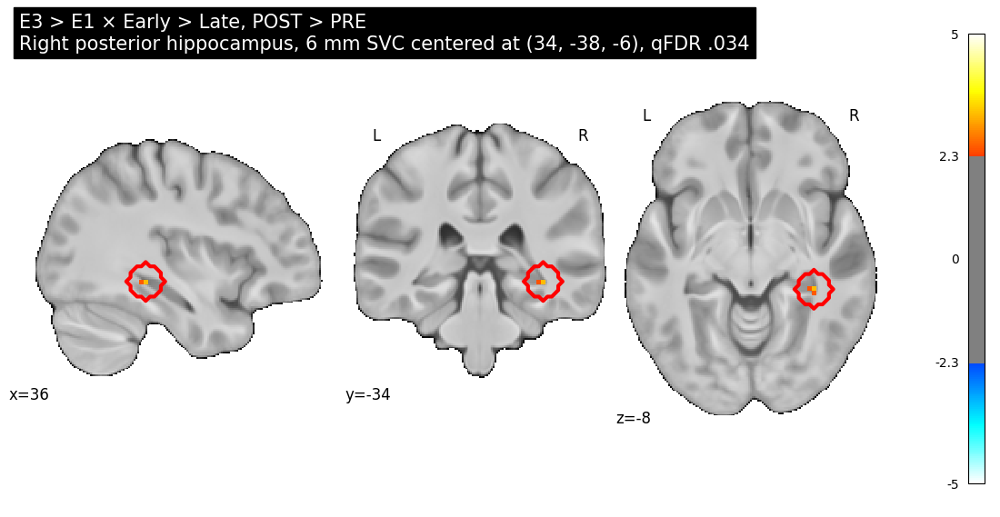

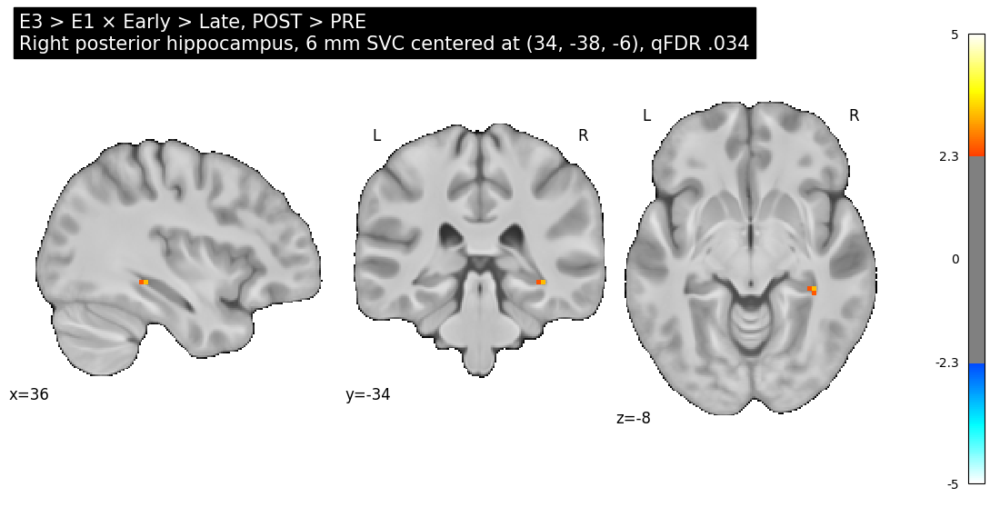


Processing: E3 > E2 × Middle > Late, POST > PRE
Actual contrast name: time_e2_gt_e3_x_space_late_gt_middle_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e2_gt_e3_x_space_late_gt_middle_post_gt_pre_smoothed5mm_zmap.nii.gz
Sphere: Bellmund_across_sequence_left_anterior_HPC_exploratory (-26.0, -19.0, -15.0)
Plot figure: True
Peak in sphere: (-23.5, -17.0, -15.5)
z: 3.1057605743408203
p unc: < .001
pBonf sphere: .058
qFDR sphere: .040


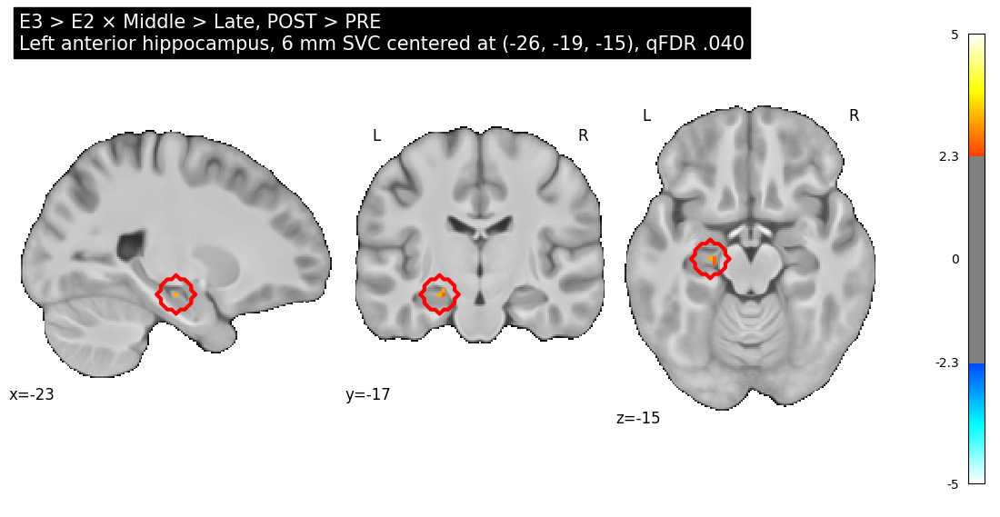

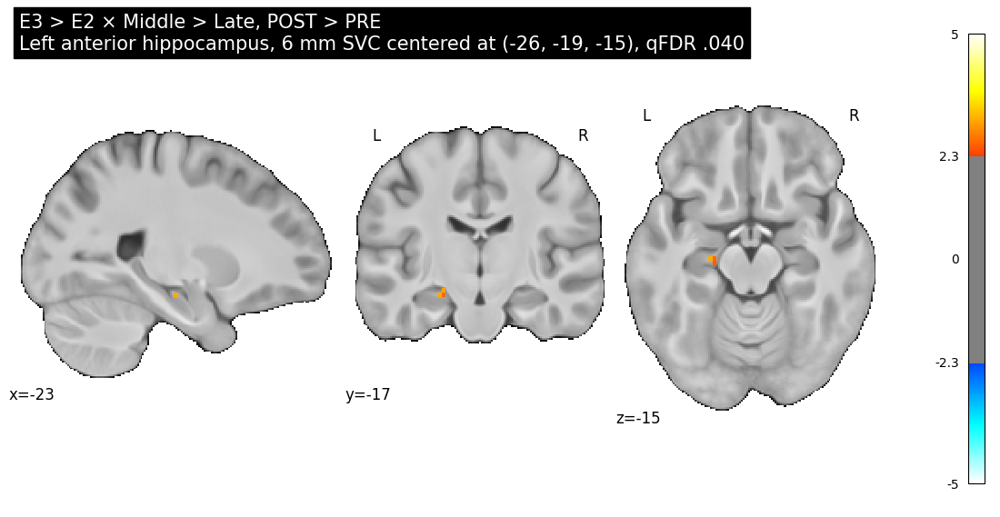


Processing: E3 > E2 × Early > Late, POST > PRE
Actual contrast name: time_e2_gt_e3_x_space_late_gt_early_post_gt_pre
z-map: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e2_gt_e3_x_space_late_gt_early_post_gt_pre_smoothed5mm_zmap.nii.gz
Sphere: Montagrin_remote_gt_current_left_anterior_HPC (-15.0, -8.5, -14.5)
Plot figure: False
Peak in sphere: (-18.5, -12.0, -15.5)
z: 3.288860321044922
p unc: < .001
pBonf sphere: .028
qFDR sphere: .028

Corrected final Notebook 12 SVC results:


,Role,Contrast,Distance interpretation,Region,Literature sphere,Paper,Sphere center,Peak,z,p unc.,pBonf sphere,qFDR,n voxels,Concept,Interpretation,Actual contrast name,z_map_path,sphere_mask_path,masked_z_path
0,Large-distance interaction,"E3 > E1 × Early > Late, POST > PRE",Large temporal × large spatial distance,Right posterior hippocampus,Viard_right_posterior_HPC_autobiographical_period,Viard et al.,"(34, -38, -6)","(36, -34, -8)",3.23,< .001,.034,.034,55,"Autobiographical memory period, right posterior hippocampus",Largest episode-time separation combined with largest route-position separation.,time_e1_gt_e3_x_space_late_gt_early_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e1_gt_e3_x_space_late_gt_early_post_gt...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_i...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_i...
1,Local-distance interaction,"E3 > E2 × Middle > Late, POST > PRE",Smaller temporal × smaller/moderate spatial distance,Left anterior hippocampus,Bellmund_across_sequence_left_anterior_HPC_exploratory,Bellmund et al. 2022,"(-26, -19, -15)","(-24, -17, -16)",3.11,< .001,.058,.040,61,"Across-sequence temporal relation, exploratory",Smaller episode-time separation combined with smaller/moderate route-position separation.,time_e2_gt_e3_x_space_late_gt_middle_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e2_gt_e3_x_space_late_gt_middle_post_g...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_i...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_i...
2,Table-only support,"E3 > E2 × Early > Late, POST > PRE",Smaller temporal × large spatial distance,Left anterior hippocampus,Montagrin_remote_gt_current_left_anterior_HPC,Montagrin et al.,"(-15, -8, -14)","(-18, -12, -16)",3.29,< .001,.028,.028,56,Remote > current goals,Smaller episode-time separation also interacts with the large Early > Late route contrast in left anterior hippocampus.,time_e2_gt_e3_x_space_late_gt_early_post_gt_pre,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/second_level_from_smoothed5mm/maps/group_time_e2_gt_e3_x_space_late_gt_early_post_gt...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_i...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_i...


Saved corrected final SVC table CSV:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_interaction_glm_FINAL_time_x_space_interaction_SVC_results_CORRECTED.csv

Corrected compact slide table:


,Contrast,Distance interpretation,Region,Peak,z,qFDR,Role
0,"E3 > E1 × Early > Late, POST > PRE",Large temporal × large spatial distance,Right posterior hippocampus,"(36, -34, -8)",3.23,.034,Large-distance interaction
1,"E3 > E2 × Middle > Late, POST > PRE",Smaller temporal × smaller/moderate spatial distance,Left anterior hippocampus,"(-24, -17, -16)",3.11,.040,Local-distance interaction
2,"E3 > E2 × Early > Late, POST > PRE",Smaller temporal × large spatial distance,Left anterior hippocampus,"(-18, -12, -16)",3.29,.028,Table-only support


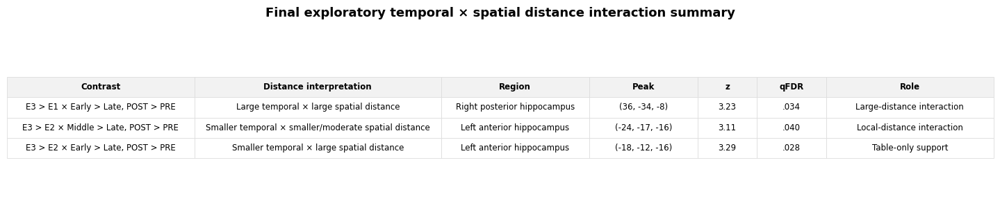

Saved table PNG:
/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_interaction_glm_FINAL_time_x_space_interaction_compact_slide_table_CORRECTED.png

Figure paths:


,result,contrast,with_red,without_red
0,large_temporal_large_spatial_right_posterior,"E3 > E1 × Early > Late, POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_...
1,small_temporal_middle_late_left_anterior,"E3 > E2 × Middle > Late, POST > PRE",/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_...,/media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_...



Recommended outputs:
Compact slide table: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/figures/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_interaction_glm_FINAL_time_x_space_interaction_compact_slide_table_CORRECTED.png
Corrected SVC table: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_interaction_glm_FINAL_time_x_space_interaction_SVC_results_CORRECTED.csv
Figure paths: /media/RCPNAS/Data3/Alison_island/kroczak/island_semester_project/data/processed/glm/pre_post_time_x_encoding_space_interaction_glm/tables/final_time_x_space_interaction_svc_CORRECTED/pre_post_time_x_encoding_space_interaction_glm_FINAL_time_x_space_interaction_figure_paths_CORRECTED.csv


In [19]:
# ============================================================
# FINAL Notebook 12 figures + SVC table — corrected version
#
# Uses exact rows from time_space_literature_svc_table.
# This avoids accidentally selecting the wrong contrast file.
#
# Plot:
# 1) E3 > E1 × Early > Late / equivalent reverse
#    large temporal × large spatial distance
#    right posterior hippocampus
#
# 2) E3 > E2 × Middle > Late / equivalent reverse
#    smaller temporal × smaller/moderate spatial distance
#    left anterior hippocampus
#
# Table only:
# 3) E3 > E2 × Early > Late / equivalent reverse
#    smaller temporal × large spatial distance
#    left anterior hippocampus
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path

import nibabel as nib
from nilearn import plotting
from nilearn.image import load_img, new_img_like, resample_to_img, math_img
from scipy.stats import norm
from statsmodels.stats.multitest import multipletests
from IPython.display import display

# ------------------------------------------------------------
# Output folders
# ------------------------------------------------------------

final_tsx_fig_dir = (
    dirs["figures"]
    / "final_time_x_space_interaction_svc_CORRECTED"
)

final_tsx_table_dir = (
    dirs["tables"]
    / "final_time_x_space_interaction_svc_CORRECTED"
)

final_tsx_fig_dir.mkdir(parents=True, exist_ok=True)
final_tsx_table_dir.mkdir(parents=True, exist_ok=True)

print("Saving corrected final Notebook 12 figures to:", final_tsx_fig_dir)
print("Saving corrected final Notebook 12 tables to:", final_tsx_table_dir)

# ------------------------------------------------------------
# Settings
# ------------------------------------------------------------

SVC_RADIUS_MM = 6.0
VISUAL_RING_RADIUS_MM = 10.0
DISPLAY_THRESHOLD_Z = 2.33
VMAX = 5.0

assert "time_space_literature_svc_table" in globals(), "Run the Notebook 12 SVC exploration cell first."
assert "second_level_table" in globals(), "second_level_table missing."

# ------------------------------------------------------------
# Helper functions
# ------------------------------------------------------------

def fmt_p(x):
    if pd.isna(x):
        return "—"
    x = float(x)
    if x < 0.001:
        return "< .001"
    return f"{x:.3f}".replace("0.", ".")


def fmt_coord(x, y, z):
    return f"({x:.0f}, {y:.0f}, {z:.0f})"


def make_sphere_mask_img(reference_img, center_mni, radius_mm):
    ref_img = load_img(reference_img) if isinstance(reference_img, (str, Path)) else reference_img

    shape = ref_img.shape[:3]
    affine = ref_img.affine

    ijk = np.array(
        np.meshgrid(
            np.arange(shape[0]),
            np.arange(shape[1]),
            np.arange(shape[2]),
            indexing="ij",
        )
    ).reshape(3, -1).T

    xyz = nib.affines.apply_affine(affine, ijk)
    center = np.array(center_mni, dtype=float)

    distances = np.linalg.norm(xyz - center, axis=1)
    sphere_data = (distances <= radius_mm).reshape(shape).astype(np.uint8)

    return new_img_like(ref_img, sphere_data)


def run_sphere_svc(z_img, sphere_img, direction="positive"):
    sphere_resampled = resample_to_img(
        sphere_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    z_data = z_img.get_fdata()
    sphere_data = sphere_resampled.get_fdata() > 0

    n_voxels = int(sphere_data.sum())
    assert n_voxels > 0, "Sphere mask has zero voxels."

    z_inside = z_data[sphere_data]

    if direction == "positive":
        peak_index = int(np.nanargmax(z_inside))
        peak_z = float(z_inside[peak_index])
        p_values = norm.sf(z_inside)
        peak_p_unc = float(norm.sf(peak_z))
    else:
        peak_index = int(np.nanargmin(z_inside))
        peak_z = float(z_inside[peak_index])
        p_values = norm.sf(-z_inside)
        peak_p_unc = float(norm.sf(-peak_z))

    _, q_values, _, _ = multipletests(
        p_values,
        alpha=0.05,
        method="fdr_bh",
    )

    sphere_indices = np.array(np.where(sphere_data)).T
    peak_ijk = sphere_indices[peak_index]
    peak_mni = nib.affines.apply_affine(z_img.affine, peak_ijk)

    peak_q_fdr = float(q_values[peak_index])
    peak_p_bonf = float(min(peak_p_unc * n_voxels, 1.0))

    return {
        "n_voxels_in_sphere": n_voxels,
        "peak_x": float(peak_mni[0]),
        "peak_y": float(peak_mni[1]),
        "peak_z_coord": float(peak_mni[2]),
        "peak_z_stat": peak_z,
        "peak_p_uncorrected": peak_p_unc,
        "peak_p_bonferroni_within_sphere": peak_p_bonf,
        "peak_q_fdr_within_sphere": peak_q_fdr,
        "n_voxels_p_unc_lt_0_001": int(np.sum(p_values < 0.001)),
        "n_voxels_fdr_q_lt_0_05": int(np.sum(q_values < 0.05)),
    }


def save_clean_table_png(
    df,
    out_path,
    title=None,
    fontsize=8.5,
    header_fontsize=8.5,
    scale_y=1.65,
    col_widths=None,
    figsize=None,
):
    n_rows, n_cols = df.shape

    if figsize is None:
        figsize = (max(10, n_cols * 1.5), max(2.8, n_rows * 0.55 + 1.2))

    fig, ax = plt.subplots(figsize=figsize)
    fig.patch.set_facecolor("white")
    ax.axis("off")

    if col_widths is None:
        col_widths = [1 / n_cols] * n_cols

    table = ax.table(
        cellText=df.values,
        colLabels=df.columns,
        cellLoc="center",
        colLoc="center",
        loc="center",
        colWidths=col_widths,
    )

    table.auto_set_font_size(False)
    table.set_fontsize(fontsize)
    table.scale(1, scale_y)

    for (row, col), cell in table.get_celld().items():
        cell.set_edgecolor("#DDDDDD")
        cell.set_linewidth(0.6)

        if row == 0:
            cell.set_text_props(weight="bold", fontsize=header_fontsize)
            cell.set_facecolor("#F2F2F2")
        else:
            cell.set_facecolor("white")

    if title:
        ax.set_title(title, fontsize=13, weight="bold", pad=18)

    plt.tight_layout()
    fig.savefig(out_path, dpi=300, bbox_inches="tight", facecolor="white")
    plt.show()

    print("Saved table PNG:")
    print(out_path)


def select_best_svc_row(
    contrast_label_contains,
    roi_contains,
    expected_peak=None,
    max_peak_distance_mm=8.0,
):
    """
    Select exact row from the previously computed SVC table.
    This uses the already correct table rather than token-searching second_level_table.
    """
    df = time_space_literature_svc_table.copy()

    mask = pd.Series(True, index=df.index)

    for token in contrast_label_contains:
        token = str(token)
        mask &= (
            df["contrast_label"].astype(str).str.contains(token, case=False, regex=False)
            | df["contrast"].astype(str).str.contains(token, case=False, regex=False)
        )

    for token in roi_contains:
        token = str(token)
        mask &= df["literature_roi"].astype(str).str.contains(token, case=False, regex=False)

    candidate = df[mask].copy()

    if expected_peak is not None and len(candidate) > 0:
        expected_peak = np.array(expected_peak, dtype=float)

        candidate["distance_to_expected_peak"] = np.sqrt(
            (candidate["peak_x"] - expected_peak[0]) ** 2
            + (candidate["peak_y"] - expected_peak[1]) ** 2
            + (candidate["peak_z_coord"] - expected_peak[2]) ** 2
        )

        candidate = candidate[
            candidate["distance_to_expected_peak"] <= max_peak_distance_mm
        ].copy()

    if len(candidate) == 0:
        print("\nNo candidate rows found.")
        print("contrast_label_contains:", contrast_label_contains)
        print("roi_contains:", roi_contains)
        print("expected_peak:", expected_peak)
        raise ValueError("Could not select SVC row.")

    candidate = candidate.sort_values(
        ["peak_q_fdr_within_sphere", "peak_z_stat"],
        ascending=[True, False],
    ).reset_index(drop=True)

    print("\nSelected row candidates:")
    display(
        candidate[
            [
                "contrast_label",
                "contrast",
                "paper",
                "literature_roi",
                "peak_x",
                "peak_y",
                "peak_z_coord",
                "peak_z_stat",
                "peak_p_bonferroni_within_sphere",
                "peak_q_fdr_within_sphere",
                "peak_distance_from_literature_center_mm",
            ]
        ].head(10)
    )

    return candidate.iloc[0].to_dict()


# ------------------------------------------------------------
# Select exact previously-correct SVC rows
# ------------------------------------------------------------

# 1. Large temporal × large spatial distance
# Earlier correct row:
# time E3 > E1 × space Early > late / equivalent reverse
# peak (36, -34, -8), Viard R posterior, qFDR .034

row_large = select_best_svc_row(
    contrast_label_contains=["E3", "E1", "Early", "late"],
    roi_contains=["Viard_right_posterior_HPC_autobiographical_period"],
    expected_peak=(36, -34, -8),
    max_peak_distance_mm=8.0,
)

# 2. Smaller temporal × smaller/moderate spatial distance
# Earlier correct row:
# time E3 > E2 × space Middle > late / equivalent reverse
# peak (-24, -17, -16), Bellmund across-sequence L anterior, qFDR .040

row_local_middle = select_best_svc_row(
    contrast_label_contains=["E3", "E2", "Middle", "late"],
    roi_contains=["Bellmund_across_sequence_left_anterior_HPC_exploratory"],
    expected_peak=(-24, -17, -16),
    max_peak_distance_mm=8.0,
)

# 3. Smaller temporal × large spatial distance, table only
# Earlier correct row:
# time E3 > E2 × space Early > late / equivalent reverse
# peak (-18, -12, -16), Montagrin L anterior, qFDR .028

row_local_early = select_best_svc_row(
    contrast_label_contains=["E3", "E2", "Early", "late"],
    roi_contains=["Montagrin_remote_gt_current_left_anterior_HPC"],
    expected_peak=(-18, -12, -16),
    max_peak_distance_mm=8.0,
)

FINAL_TSX_EFFECTS = [
    {
        "row": row_large,
        "result_name": "large_temporal_large_spatial_right_posterior",
        "plot_figure": True,
        "contrast_label_final": "E3 > E1 × Early > Late, POST > PRE",
        "distance_label": "Large temporal × large spatial distance",
        "region_label": "Right posterior hippocampus",
        "role": "Large-distance interaction",
        "interpretation": (
            "Largest episode-time separation combined with largest route-position separation."
        ),
    },
    {
        "row": row_local_middle,
        "result_name": "small_temporal_middle_late_left_anterior",
        "plot_figure": True,
        "contrast_label_final": "E3 > E2 × Middle > Late, POST > PRE",
        "distance_label": "Smaller temporal × smaller/moderate spatial distance",
        "region_label": "Left anterior hippocampus",
        "role": "Local-distance interaction",
        "interpretation": (
            "Smaller episode-time separation combined with smaller/moderate route-position separation."
        ),
    },
    {
        "row": row_local_early,
        "result_name": "small_temporal_early_late_left_anterior_table_only",
        "plot_figure": False,
        "contrast_label_final": "E3 > E2 × Early > Late, POST > PRE",
        "distance_label": "Smaller temporal × large spatial distance",
        "region_label": "Left anterior hippocampus",
        "role": "Table-only support",
        "interpretation": (
            "Smaller episode-time separation also interacts with the large Early > Late route contrast in left anterior hippocampus."
        ),
    },
]

# ------------------------------------------------------------
# Main loop: recompute SVC and plot selected figures
# ------------------------------------------------------------

final_tsx_svc_rows = []
figure_paths = []

for effect in FINAL_TSX_EFFECTS:

    row = effect["row"]

    contrast_name = row["contrast"]
    z_map_path = Path(row["z_map_path"])

    sphere_center = (
        float(row["sphere_center_x"]),
        float(row["sphere_center_y"]),
        float(row["sphere_center_z"]),
    )

    print("\n" + "=" * 90)
    print("Processing:", effect["contrast_label_final"])
    print("Actual contrast name:", contrast_name)
    print("z-map:", z_map_path)
    print("Sphere:", row["literature_roi"], sphere_center)
    print("Plot figure:", effect["plot_figure"])

    z_img = load_img(str(z_map_path))

    svc_sphere_img = make_sphere_mask_img(
        reference_img=z_img,
        center_mni=sphere_center,
        radius_mm=SVC_RADIUS_MM,
    )

    svc_sphere_resampled = resample_to_img(
        svc_sphere_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    svc_sphere_path = (
        final_tsx_table_dir
        / f"{ANALYSIS_NAME}_{effect['result_name']}_6mm_SVC_sphere_mask.nii.gz"
    )
    svc_sphere_resampled.to_filename(str(svc_sphere_path))

    svc_result = run_sphere_svc(
        z_img=z_img,
        sphere_img=svc_sphere_resampled,
        direction="positive",
    )

    peak = (
        svc_result["peak_x"],
        svc_result["peak_y"],
        svc_result["peak_z_coord"],
    )

    q_svc_label = fmt_p(svc_result["peak_q_fdr_within_sphere"])
    p_unc_label = fmt_p(svc_result["peak_p_uncorrected"])
    p_bonf_label = fmt_p(svc_result["peak_p_bonferroni_within_sphere"])

    print("Peak in sphere:", peak)
    print("z:", svc_result["peak_z_stat"])
    print("p unc:", p_unc_label)
    print("pBonf sphere:", p_bonf_label)
    print("qFDR sphere:", q_svc_label)

    masked_z_img = math_img(
        "zmap * (sphere > 0)",
        zmap=z_img,
        sphere=svc_sphere_resampled,
    )

    masked_z_path = (
        final_tsx_table_dir
        / f"{ANALYSIS_NAME}_{effect['result_name']}_zmap_masked_to_6mm_SVC_sphere.nii.gz"
    )
    masked_z_img.to_filename(str(masked_z_path))

    visual_ring_img = make_sphere_mask_img(
        reference_img=z_img,
        center_mni=peak,
        radius_mm=VISUAL_RING_RADIUS_MM,
    )

    visual_ring_resampled = resample_to_img(
        visual_ring_img,
        z_img,
        interpolation="nearest",
        force_resample=True,
        copy_header=True,
    )

    final_tsx_svc_rows.append({
        "Role": effect["role"],
        "Contrast": effect["contrast_label_final"],
        "Distance interpretation": effect["distance_label"],
        "Region": effect["region_label"],
        "Literature sphere": row["literature_roi"],
        "Paper": row["paper"],
        "Sphere center": fmt_coord(*sphere_center),
        "Peak": fmt_coord(*peak),
        "z": f"{svc_result['peak_z_stat']:.2f}",
        "p unc.": p_unc_label,
        "pBonf sphere": p_bonf_label,
        "qFDR": q_svc_label,
        "n voxels": svc_result["n_voxels_in_sphere"],
        "Concept": row["concept"],
        "Interpretation": effect["interpretation"],
        "Actual contrast name": contrast_name,
        "z_map_path": str(z_map_path),
        "sphere_mask_path": str(svc_sphere_path),
        "masked_z_path": str(masked_z_path),
    })

    if not effect["plot_figure"]:
        continue

    title_text = (
        f"{effect['contrast_label_final']}\n"
        f"{effect['region_label']}, 6 mm SVC centered at "
        f"{fmt_coord(*sphere_center)}, qFDR {q_svc_label}"
    )

    # Figure with red contour
    fig_with_red_png = (
        final_tsx_fig_dir
        / f"{ANALYSIS_NAME}_{effect['result_name']}_WITH_red_circle.png"
    )

    fig_with_red_pdf = (
        final_tsx_fig_dir
        / f"{ANALYSIS_NAME}_{effect['result_name']}_WITH_red_circle.pdf"
    )

    fig = plt.figure(figsize=(10.8, 5.5), facecolor="white")

    stat_display = plotting.plot_stat_map(
        masked_z_img,
        bg_img=mean_t1w_img if globals().get("USE_MEAN_T1W_BACKGROUND", True) else None,
        threshold=DISPLAY_THRESHOLD_Z,
        vmax=VMAX,
        cmap="cold_hot",
        symmetric_cbar=True,
        display_mode="ortho",
        cut_coords=peak,
        black_bg=False,
        colorbar=True,
        annotate=True,
        draw_cross=False,
        dim=-0.2,
        figure=fig,
        title=title_text,
    )

    stat_display.add_contours(
        visual_ring_resampled,
        levels=[0.5],
        colors=["red"],
        linewidths=3.0,
    )

    fig.savefig(fig_with_red_png, dpi=300, bbox_inches="tight", facecolor="white")
    fig.savefig(fig_with_red_pdf, bbox_inches="tight", facecolor="white")
    plt.show()

    # Figure without red contour
    fig_no_red_png = (
        final_tsx_fig_dir
        / f"{ANALYSIS_NAME}_{effect['result_name']}_NO_red_circle.png"
    )

    fig_no_red_pdf = (
        final_tsx_fig_dir
        / f"{ANALYSIS_NAME}_{effect['result_name']}_NO_red_circle.pdf"
    )

    fig = plt.figure(figsize=(10.8, 5.5), facecolor="white")

    stat_display = plotting.plot_stat_map(
        masked_z_img,
        bg_img=mean_t1w_img if globals().get("USE_MEAN_T1W_BACKGROUND", True) else None,
        threshold=DISPLAY_THRESHOLD_Z,
        vmax=VMAX,
        cmap="cold_hot",
        symmetric_cbar=True,
        display_mode="ortho",
        cut_coords=peak,
        black_bg=False,
        colorbar=True,
        annotate=True,
        draw_cross=False,
        dim=-0.2,
        figure=fig,
        title=title_text,
    )

    fig.savefig(fig_no_red_png, dpi=300, bbox_inches="tight", facecolor="white")
    fig.savefig(fig_no_red_pdf, bbox_inches="tight", facecolor="white")
    plt.show()

    figure_paths.append({
        "result": effect["result_name"],
        "contrast": effect["contrast_label_final"],
        "with_red": str(fig_with_red_png),
        "without_red": str(fig_no_red_png),
    })

# ------------------------------------------------------------
# Save final tables
# ------------------------------------------------------------

final_tsx_svc_table = pd.DataFrame(final_tsx_svc_rows)

final_tsx_svc_csv = (
    final_tsx_table_dir
    / f"{ANALYSIS_NAME}_FINAL_time_x_space_interaction_SVC_results_CORRECTED.csv"
)

final_tsx_svc_table.to_csv(final_tsx_svc_csv, index=False)

print("\nCorrected final Notebook 12 SVC results:")
display(final_tsx_svc_table)

print("Saved corrected final SVC table CSV:")
print(final_tsx_svc_csv)

# Compact table
compact_tsx_table = final_tsx_svc_table[
    [
        "Contrast",
        "Distance interpretation",
        "Region",
        "Peak",
        "z",
        "qFDR",
        "Role",
    ]
].copy()

compact_tsx_csv = (
    final_tsx_table_dir
    / f"{ANALYSIS_NAME}_FINAL_time_x_space_interaction_compact_slide_table_CORRECTED.csv"
)

compact_tsx_table.to_csv(compact_tsx_csv, index=False)

print("\nCorrected compact slide table:")
display(compact_tsx_table)

compact_tsx_png = (
    final_tsx_fig_dir
    / f"{ANALYSIS_NAME}_FINAL_time_x_space_interaction_compact_slide_table_CORRECTED.png"
)

save_clean_table_png(
    compact_tsx_table,
    compact_tsx_png,
    title="Final exploratory temporal × spatial distance interaction summary",
    fontsize=8.5,
    header_fontsize=8.5,
    scale_y=1.75,
    col_widths=[0.19, 0.25, 0.15, 0.11, 0.06, 0.07, 0.17],
    figsize=(14.5, 3.1),
)

figure_paths_df = pd.DataFrame(figure_paths)

figure_paths_csv = (
    final_tsx_table_dir
    / f"{ANALYSIS_NAME}_FINAL_time_x_space_interaction_figure_paths_CORRECTED.csv"
)

figure_paths_df.to_csv(figure_paths_csv, index=False)

print("\nFigure paths:")
display(figure_paths_df)

print("\nRecommended outputs:")
print("Compact slide table:", compact_tsx_png)
print("Corrected SVC table:", final_tsx_svc_csv)
print("Figure paths:", figure_paths_csv)

The right posterior hippocampal effect may reflect detailed contextual separation when both episode-time and route-position distances are maximal. The left anterior hippocampal effects may instead reflect integrated event-map coding of more local temporal–spatial relations.